# Semi-supervised VAE on MNIST

This notebook contains experiments with semi-supervised VAE on MNIST data.

reference paper: https://arxiv.org/abs/1406.5298

** Requirements **

This notebook has been implemented using:

- Python 3.7.7
- Numpy 1.18.1
- Pandas 1.0.3
- Scipy 1.4.1
- PyTorch 1.4.0
- torchvision 0.5.0
- Scikit-Learn 0.22.1
- matplotlib 3.1.3
- seaborn 0.10.0

### Imports

In [1]:
# Python lib
import os
# os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

import random
from typing import List, Tuple, Optional
import types
import itertools

# Scientific utilities
import numpy as np
import pandas as pd
from scipy.stats import norm as ndist
from sklearn.metrics import confusion_matrix

# PyTorch
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision.utils import make_grid

# Vizualisations
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

### Globals

In [38]:
DATA_DIR = 'data' # relative path to download and store data

BATCH_SIZE = 100

LABELED_DATA_SIZE = 0.05 # in percents

N_CLASSES = 10

** Fixing random seed for reproducibility **

In [39]:
def seed_everything(seed=2020):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    
seed_everything()

### Preparing Data

Conveniently, PyTorch comes with pre-defined MNIST dataset so we are going to use it directly.

In [40]:
def get_mnist_ds(train: bool):
    
    seed_everything()

    ds = torchvision.datasets.MNIST(DATA_DIR, 
                                    train=train, 
                                    transform=transforms.Compose([
                                                  transforms.ToTensor(),
                                              ]), 
                                    target_transform=None, 
                                    download=True)
    
    if not train:
        return ds
    
    # making sure that labeled portion of data has equal number of classes (thus making P(Y) uniform prior).
    
    sz = int(LABELED_DATA_SIZE * len(ds) / N_CLASSES)
    cnt = [0] * 10
    indices_l = []
    indices_u = []
    
    labels = list(zip(torch.LongTensor(ds.targets).tolist(), range(len(ds))))
    np.random.shuffle(labels) # shuffling data, just in case 
    
    for i in range(len(ds)):
        y, idx = labels[i]
        if cnt[y] != sz:
            cnt[y] += 1
            indices_l.append(idx)
        else:
            indices_u.append(idx)
        
    # making sure we partition the whole data into disjoint labelled/unlabelled subsets correctly.
    assert sorted(indices_l + indices_u) == list(range(len(ds)))
    
    # making sure we can distribute all of the data into equally-sized batches without leftover.
    assert len(indices_l) % BATCH_SIZE == 0
    assert len(indices_u) % BATCH_SIZE == 0
    
    return Subset(ds, indices_l), Subset(ds, indices_u)

def get_mnist_dls():
    """Returns separate DataLoaders per labelled/unlabelled and validation sets."""
    
    train_ds, train_ds_u = get_mnist_ds(train=True)
    
    valid_ds = get_mnist_ds(train=False)
    
    return (torch.utils.data.DataLoader(train_ds, 
                                        batch_size=BATCH_SIZE, 
                                        shuffle=True, 
                                        pin_memory=False, 
                                        drop_last=True),
            
            torch.utils.data.DataLoader(train_ds_u, 
                                        batch_size=BATCH_SIZE, 
                                        shuffle=True, 
                                        pin_memory=False, 
                                        drop_last=True),
            
            torch.utils.data.DataLoader(valid_ds, 
                                        batch_size=2 * BATCH_SIZE, 
                                        shuffle=False, 
                                        pin_memory=False, 
                                        drop_last=False))

train_dl, train_dl_u, valid_dl = get_mnist_dls()

print("Number of labelled, unlabelled and valid samples: ", len(train_dl.dataset), 
                                                            len(train_dl_u.dataset), 
                                                            len(valid_dl.dataset)) 
      
print("Number of labelled, unlabelled and valid batches: ", len(train_dl), 
                                                            len(train_dl_u), 
                                                            len(valid_dl))

Number of labelled, unlabelled and valid samples:  3000 57000 10000
Number of labelled, unlabelled and valid batches:  30 570 50


**Showing a few samples from the dataset**

torch.Size([100, 1, 28, 28]) tensor(0.1257) tensor(0.3014) tensor(0.) tensor(1.)


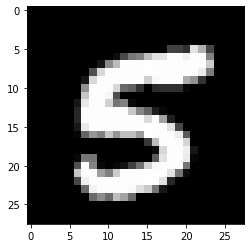

torch.Size([100, 1, 28, 28]) tensor(0.1358) tensor(0.3135) tensor(0.) tensor(1.)


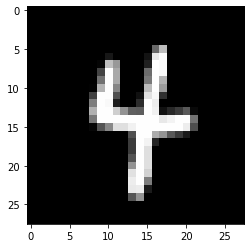

torch.Size([100, 1, 28, 28]) tensor(0.1381) tensor(0.3155) tensor(0.) tensor(1.)


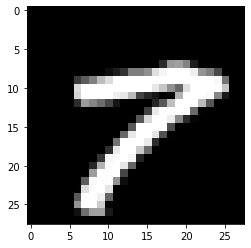

In [41]:
for i, (x, y) in enumerate(train_dl):
    print(x.shape, x.mean(), x.std(), x.min(), x.max())
    plt.imshow(x[0][0], cmap='gray')
    plt.show()
    if i > 1: break

### Defining Model

In [42]:
def init_weights(m: nn.Module):

    for m in m.modules():
        if isinstance(m, nn.Linear):
            nn.init.kaiming_normal_(m.weight, a=0.02, nonlinearity='leaky_relu')
            nn.init.constant_(m.bias, 0)

def one_hot(y, n_classes: int) -> torch.FloatTensor:
    
    assert y.ndim <= 2
    
    bs = y.shape[0]
            
    y_onehot = torch.zeros(bs, n_classes, device=y.device).long()
    y_onehot.scatter_(1, y.view(bs, 1).long(), 1)
    
    return y_onehot.float()
    
class MLP(nn.Module):
    """Simple Multi-Layer Perceptron network."""
    
    def __init__(self, inp_dim: int, hidden_dim: int, out_dim: int):
        super().__init__()
        
        self.layers = nn.Sequential(nn.Linear(inp_dim, hidden_dim),
                                    nn.LeakyReLU(0.02),
                                    nn.Linear(hidden_dim, hidden_dim),
                                    nn.LeakyReLU(0.02),
                                    nn.Linear(hidden_dim, out_dim))
        
        init_weights(self)
        
    def forward(self, x): return self.layers(x)

In [43]:
class SSVAE(nn.Module):
    """Semi-Supervised VAE"""
    
    def __init__(self, inp_shape: Tuple[int, int, int], # (1, 28, 28) in case of MNIST
                       hidden_dim: int,
                       out_dim: int, 
                       z_dim: int, 
                       n_classes: int):
        
        super().__init__()
        
        self.inp_shape = inp_shape
        self.n_classes = n_classes
        
        inp_dim = np.prod(inp_shape) # calculating flattened input size
        
        self.enc = MLP(inp_dim + n_classes, hidden_dim, out_dim) # q(z|x,y) = Normal(z | mu, diag(sigma^2) = MLP(x, y))
        self.dec = MLP(out_dim + n_classes, hidden_dim, inp_dim) # p(x|z,y) = Bernoulli(x | p = MLP(z, y))
        
        self.cls = MLP(inp_dim, hidden_dim, n_classes) # q(y|x) = Categorical(y | p = MLP(x))
        
        self.mu     = nn.Linear(out_dim, z_dim)
        self.logvar = nn.Linear(out_dim, z_dim)
        
        self.fc = nn.Linear(z_dim, out_dim)
        
        init_weights(self)
        
    def encode(self, x, y):
        
        inp = torch.cat([torch.flatten(x, 1), one_hot(y, self.n_classes)], dim=1)
        
        enc = self.enc(inp)
        
        return self.mu(enc), self.logvar(enc)
    
    def cls_logits(self, x):
        
        return self.cls(torch.flatten(x, 1))
        
    def sample_z(self, mu, logvar):
        """Applying Gaussian reparametrization trick"""
        
        eps = torch.empty_like(mu).normal_(0, 1)
        
        return mu + eps * torch.exp(0.5 * logvar)
    
    def decode(self, z, y):

        inp = torch.cat([self.fc(z), one_hot(y, self.n_classes)], dim=1)
        
        return self.dec(inp).view(-1, *self.inp_shape)
        
    def forward(self, x, y=None):
        
        if y is None:
            y = torch.argmax(self.cls_logits(x), dim=1)
        
        mu, logvar = self.encode(x, y)
        
        z = self.sample_z(mu, logvar)
        
        return self.decode(z, y)

### Defining Loss 

In [44]:
def kl_loss(mu, logvar):
    """KL_Divergence[N(mu, logvar.exp()), N(0, 1)]"""
    
    return -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp(), dim=-1)

def loss_xy(x, x_recon, mu, logvar):
    """Returns negative ELBO(x, y) with y - class index. Eq. 6 in the paper."""
    
    bce = torch.nn.functional.binary_cross_entropy_with_logits(x_recon, x, reduction='none').sum(dim=(1, 2, 3))

    logPy = np.log(1.0 / N_CLASSES) # prior is uniform due to ballanced classes.
    
    kl = kl_loss(mu, logvar)
    
    return bce - logPy + kl

def loss_x(model: nn.Module, x, y_probs):
    "Loss for unlabelled batch. Eq. 7 in the paper."
    
    s = torch.zeros(x.shape[0], device=x.device)
    
    y_entropy = torch.distributions.Categorical(y_probs).entropy()
    
    for i in range(y_probs.shape[-1]):
        
        y = torch.empty(x.shape[0], device=x.device).fill_(i)
        
        mu, logvar = model.encode(x, y)
        
        x_recon = model.decode(model.sample_z(mu, logvar), y)
        
        s += y_probs[:, i] * loss_xy(x, x_recon, mu, logvar)
                
    return (s + y_entropy).mean()

### Training Loop

This section contains model training loop as well as some helper/visualization functions. 

In [45]:
def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=True):
    """
    given a sklearn confusion matrix (cm), make a nice plot

    Arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html
                  plt.get_cmap('jet') or plt.cm.Blues

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # confusion matrix created by
                                                              # sklearn.metrics.confusion_matrix
                          normalize    = True,                # show proportions
                          target_names = y_labels_vals,       # list of names of the classes
                          title        = best_estimator_name) # title of graph

    Citiation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    """

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\n\nAccuracy={:0.4f}; Misclass={:0.4f}'.format(accuracy, misclass))
    plt.show()

def get_preds(valid_dl: DataLoader, model: nn.Module):
    
    model.eval()
    model.cuda()
    
    y_preds, y_trues = [], []
    with torch.no_grad():
        for x, y in valid_dl:
            
            y_pred = torch.argmax(model.cls_logits(x.cuda()), dim=1).long().tolist()
            
            y_preds.extend(y_pred)
            y_trues.extend(y.tolist())
            
    model.train()
    
    return y_trues, y_preds

In [46]:
def try_get_batch(it):
    
    x, y = None, None
    try:
        x, y = next(it)
    except StopIteration:
        pass
    
    return x, y

def get_next_batch(train_dl, train_dl_u):
    """Returns a next batch, either labelled or unlabelled, making equal gaps between alternations."""

    it_l, it_u = iter(train_dl), iter(train_dl_u)
    
    for i in range(1, 1 << 30):
        
        unlabelled = i % (len(train_dl_u) // len(train_dl)) != 0
        
        if unlabelled:
            x, y = try_get_batch(it_u)
            has_label = False
            
        if (not unlabelled) or (x is None):
            x, y = try_get_batch(it_l)
            has_label = True
        
        if x is None:
            return None, None, has_label
            
        yield x, y, has_label

In [47]:
class MetricLogger:
    """Helper class for logging metrics"""
    
    def __init__(self, name, init_val = 0):
        
        self.name = name
        self.init_val = init_val
        
        self.counter = 0
        
        self.logs = []
        
    def log(self, val):
        
        self.logs.append(val)
        
        self.counter += 1
        
    def reset(self):
        self.counter = 0
        
    @property
    def val(self):
        
        data = self.logs[len(self.logs) - self.counter:]
        
        mean, std = np.mean(data), np.std(data) 
        
        return f"Avg %s: %.5f (±%.3f)" % (self.name, mean, std)
    
    def plot(self):
        plt.title(self.name)
        plt.plot(self.logs)

In [48]:
def show_summary(valid_dl: DataLoader, model: nn.Module, acc_logger: Optional[MetricLogger] = None):
    """This is a helper function for visualizing model output quality during the training process."""
    
    N_SAMPLES = 15
    
    model.eval()
    
    actuals, preds = [], []
    with torch.no_grad():
        for i, (x, y) in enumerate(valid_dl.dataset):
            
            actuals.append(x)
                        
            recon_x = model(x.cuda(), torch.Tensor([y]).cuda()).sigmoid().cpu()
            
            preds.append(recon_x.view(*x.shape))
            
            if i + 1 == N_SAMPLES:
                break
                            
    grid = make_grid([*actuals, *preds], pad_value=1, padding=1, nrow=N_SAMPLES)

    plt.figure(figsize=(20, 4))
    plt.imshow(grid.permute(1, 2, 0))
    plt.axis('off')
    plt.show() 
    
    y_trues, y_preds = get_preds(valid_dl, model)
    
    cm = confusion_matrix(y_trues, y_preds)
    
    if acc_logger:
        acc_logger.log(np.trace(cm) / float(np.sum(cm)))
    
    plot_confusion_matrix(cm, target_names=[str(i) for i in range(10)])
    
    model.train()

def train_vae(train_dl: DataLoader, # labelled batch dataloader
              train_dl_u: DataLoader, # unlabelled batch dataloader
              valid_dl: DataLoader, # validation set dataloader
              model: nn.Module,
              n_epochs: int,
              loss_logger: MetricLogger,
              cls_loss_logger: MetricLogger,
              acc_logger: MetricLogger,
              semi_sup_epochs: int): # number of initial epochs after which training becomes fully unsupervised
    
    LOG_INTERVAL = 20
    SUMMARY_INTERVAL = 200
    
    CLS_LOSS_WEIGHT = 0.1 * len(train_dl.dataset) # as in paper
    
    model = model.cuda()
    
    cls_crit = nn.CrossEntropyLoss()
    
    model.train()
    
    # I use default lr, weight decay, and lr annealing schedule. Fintuning can improve results...
    
    optim = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-4)
    
    lr_scheduler = torch.optim.lr_scheduler.StepLR(optim, step_size=10, gamma=0.5)
    
    for epoch in range(n_epochs):
        
        for i, (x, y, has_label) in enumerate(get_next_batch(train_dl, train_dl_u)):
            
            if x is None: break
        
            optim.zero_grad()
            
            x = x.cuda()
            y = y.cuda()
            
            y_logits = model.cls_logits(x)
            
            cls_loss = cls_crit(y_logits, y)

            if has_label:
                
                # after semi_sup_epochs training becomes fully unsupervised. 
                # This allows us to see that after semi-supervised warmup, classifier is able to continue learning without labels, taking knowledge indirectly from generative process.
                # I tested this phenomenon with semi_sup_epochs=1 and z_dim=50 below...
                if epoch >= semi_sup_epochs: 
                    continue
                    
                mu, logvar = model.encode(x, y)
                
                z = model.sample_z(mu, logvar)

                x_recon = model.decode(z, y)

                loss = loss_xy(x, x_recon, mu, logvar).mean() + CLS_LOSS_WEIGHT * cls_loss
                                
            else:
                
                loss = loss_x(model, x, torch.softmax(y_logits, dim=-1))

            loss_logger.log(loss.item())
            cls_loss_logger.log(cls_loss.item())
            
            loss.backward()
            
            optim.step()
            
            if (i + 1) % LOG_INTERVAL == 0:
                
                print('epoch %d | iter %d | %s | %s' % (epoch + 1, i + 1, loss_logger.val, cls_loss_logger.val))
                
                loss_logger.reset()
                cls_loss_logger.reset()
                
            if (i + 1) % SUMMARY_INTERVAL == 0:
                show_summary(valid_dl, model, acc_logger)
            
        #lr_scheduler.step()

In [49]:
seed_everything()
vae = SSVAE(inp_shape=(1, 28, 28), hidden_dim=512, out_dim=256, z_dim=2, n_classes=10)

epoch 1 | iter 20 | Avg Loss: 551.22099 (±842.196) | Avg Cls Loss: 6.88125 (±3.436)
epoch 1 | iter 40 | Avg Loss: 255.09611 (±180.853) | Avg Cls Loss: 3.87596 (±1.588)
epoch 1 | iter 60 | Avg Loss: 233.13006 (±127.720) | Avg Cls Loss: 2.08033 (±0.133)
epoch 1 | iter 80 | Avg Loss: 224.60568 (±110.449) | Avg Cls Loss: 1.59048 (±0.139)
epoch 1 | iter 100 | Avg Loss: 211.55917 (±81.131) | Avg Cls Loss: 1.19374 (±0.125)
epoch 1 | iter 120 | Avg Loss: 215.69046 (±102.534) | Avg Cls Loss: 1.26880 (±0.171)
epoch 1 | iter 140 | Avg Loss: 213.76124 (±117.801) | Avg Cls Loss: 1.46517 (±0.303)
epoch 1 | iter 160 | Avg Loss: 208.88555 (±97.494) | Avg Cls Loss: 1.25973 (±0.249)
epoch 1 | iter 180 | Avg Loss: 205.07413 (±92.640) | Avg Cls Loss: 1.04993 (±0.198)
epoch 1 | iter 200 | Avg Loss: 195.84942 (±64.404) | Avg Cls Loss: 0.87222 (±0.165)


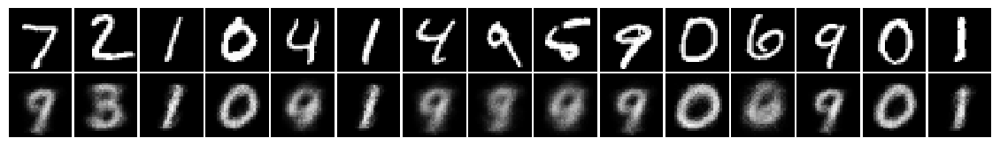

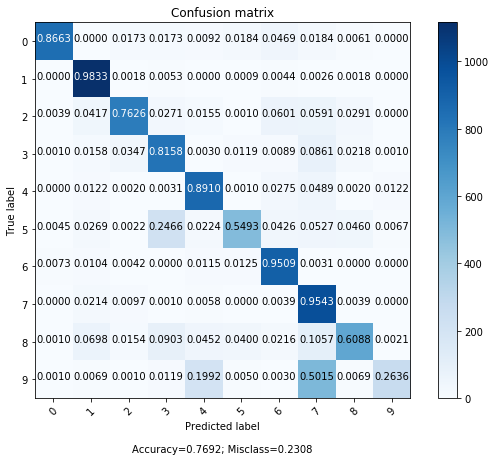

epoch 1 | iter 220 | Avg Loss: 192.75368 (±60.049) | Avg Cls Loss: 0.71027 (±0.130)
epoch 1 | iter 240 | Avg Loss: 185.17706 (±44.543) | Avg Cls Loss: 0.65262 (±0.097)
epoch 1 | iter 260 | Avg Loss: 183.46777 (±40.138) | Avg Cls Loss: 0.55282 (±0.100)
epoch 1 | iter 280 | Avg Loss: 180.42772 (±42.897) | Avg Cls Loss: 0.54319 (±0.085)
epoch 1 | iter 300 | Avg Loss: 175.73084 (±27.266) | Avg Cls Loss: 0.51783 (±0.093)
epoch 1 | iter 320 | Avg Loss: 177.10543 (±39.949) | Avg Cls Loss: 0.60131 (±0.137)
epoch 1 | iter 340 | Avg Loss: 178.66351 (±53.329) | Avg Cls Loss: 0.73483 (±0.212)
epoch 1 | iter 360 | Avg Loss: 179.80373 (±64.421) | Avg Cls Loss: 0.76414 (±0.179)
epoch 1 | iter 380 | Avg Loss: 189.85219 (±74.252) | Avg Cls Loss: 0.53168 (±0.121)
epoch 1 | iter 400 | Avg Loss: 175.84840 (±55.687) | Avg Cls Loss: 0.62671 (±0.160)


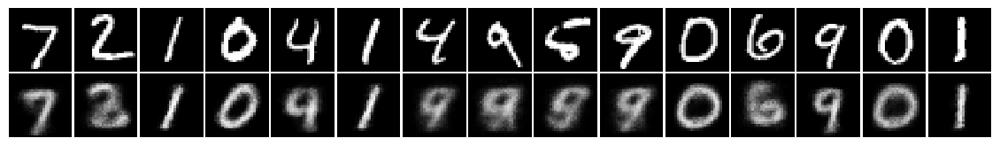

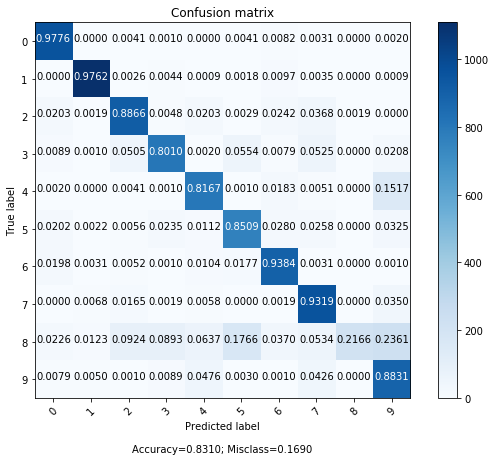

epoch 1 | iter 420 | Avg Loss: 170.11708 (±38.362) | Avg Cls Loss: 0.52602 (±0.086)
epoch 1 | iter 440 | Avg Loss: 165.40640 (±25.810) | Avg Cls Loss: 0.43835 (±0.089)
epoch 1 | iter 460 | Avg Loss: 165.01967 (±30.669) | Avg Cls Loss: 0.41328 (±0.071)
epoch 1 | iter 480 | Avg Loss: 162.93494 (±27.690) | Avg Cls Loss: 0.36434 (±0.095)
epoch 1 | iter 500 | Avg Loss: 160.50905 (±23.519) | Avg Cls Loss: 0.39457 (±0.088)
epoch 1 | iter 520 | Avg Loss: 162.62393 (±29.175) | Avg Cls Loss: 0.36639 (±0.101)
epoch 1 | iter 540 | Avg Loss: 160.53991 (±37.318) | Avg Cls Loss: 0.39423 (±0.068)
epoch 1 | iter 560 | Avg Loss: 159.62380 (±24.767) | Avg Cls Loss: 0.38786 (±0.068)
epoch 1 | iter 580 | Avg Loss: 159.95963 (±28.796) | Avg Cls Loss: 0.33062 (±0.073)
epoch 2 | iter 20 | Avg Loss: 156.39854 (±16.945) | Avg Cls Loss: 0.30418 (±0.071)
epoch 2 | iter 40 | Avg Loss: 154.36335 (±16.042) | Avg Cls Loss: 0.31551 (±0.100)
epoch 2 | iter 60 | Avg Loss: 153.02383 (±11.452) | Avg Cls Loss: 0.32873 (±0.

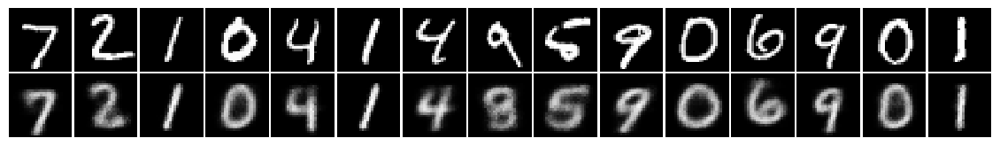

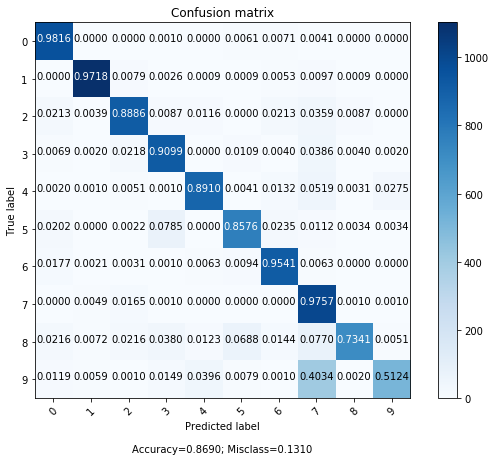

epoch 2 | iter 220 | Avg Loss: 153.91084 (±21.534) | Avg Cls Loss: 0.44295 (±0.141)
epoch 2 | iter 240 | Avg Loss: 155.63518 (±37.621) | Avg Cls Loss: 0.44978 (±0.185)
epoch 2 | iter 260 | Avg Loss: 152.43175 (±18.896) | Avg Cls Loss: 0.32103 (±0.116)
epoch 2 | iter 280 | Avg Loss: 152.96229 (±24.675) | Avg Cls Loss: 0.29199 (±0.083)
epoch 2 | iter 300 | Avg Loss: 157.15717 (±36.285) | Avg Cls Loss: 0.38918 (±0.141)
epoch 2 | iter 320 | Avg Loss: 153.04236 (±19.385) | Avg Cls Loss: 0.32040 (±0.099)
epoch 2 | iter 340 | Avg Loss: 152.37670 (±21.595) | Avg Cls Loss: 0.38137 (±0.147)
epoch 2 | iter 360 | Avg Loss: 153.62542 (±20.636) | Avg Cls Loss: 0.37705 (±0.137)
epoch 2 | iter 380 | Avg Loss: 158.57909 (±36.827) | Avg Cls Loss: 0.35964 (±0.139)
epoch 2 | iter 400 | Avg Loss: 150.89235 (±15.932) | Avg Cls Loss: 0.33015 (±0.154)


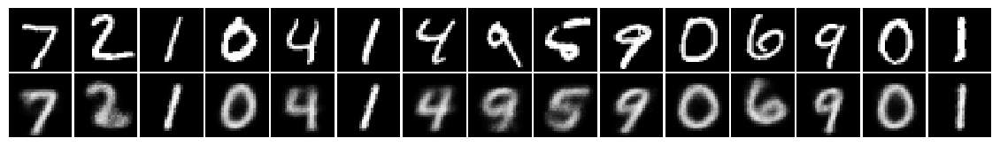

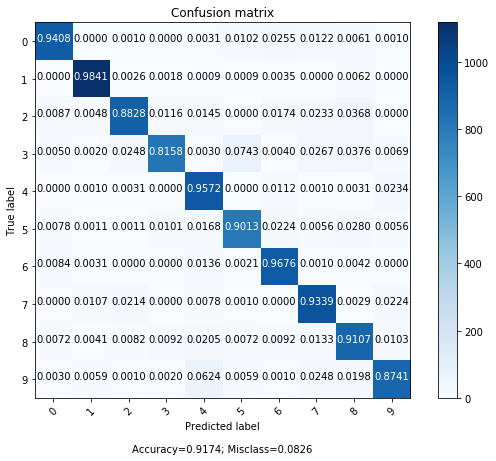

epoch 2 | iter 420 | Avg Loss: 146.42423 (±10.436) | Avg Cls Loss: 0.27103 (±0.101)
epoch 2 | iter 440 | Avg Loss: 148.33170 (±7.285) | Avg Cls Loss: 0.28459 (±0.101)
epoch 2 | iter 460 | Avg Loss: 146.78133 (±13.396) | Avg Cls Loss: 0.30077 (±0.128)
epoch 2 | iter 480 | Avg Loss: 147.26809 (±14.668) | Avg Cls Loss: 0.28796 (±0.098)
epoch 2 | iter 500 | Avg Loss: 148.58015 (±19.518) | Avg Cls Loss: 0.29826 (±0.138)
epoch 2 | iter 520 | Avg Loss: 155.23755 (±45.181) | Avg Cls Loss: 0.43783 (±0.137)
epoch 2 | iter 540 | Avg Loss: 158.23786 (±47.409) | Avg Cls Loss: 0.65787 (±0.255)
epoch 2 | iter 560 | Avg Loss: 150.47055 (±26.197) | Avg Cls Loss: 0.30470 (±0.105)
epoch 2 | iter 580 | Avg Loss: 150.06527 (±16.634) | Avg Cls Loss: 0.30727 (±0.109)
epoch 3 | iter 20 | Avg Loss: 145.41305 (±10.826) | Avg Cls Loss: 0.31427 (±0.120)
epoch 3 | iter 40 | Avg Loss: 148.43639 (±12.866) | Avg Cls Loss: 0.27096 (±0.110)
epoch 3 | iter 60 | Avg Loss: 145.36005 (±7.374) | Avg Cls Loss: 0.28702 (±0.10

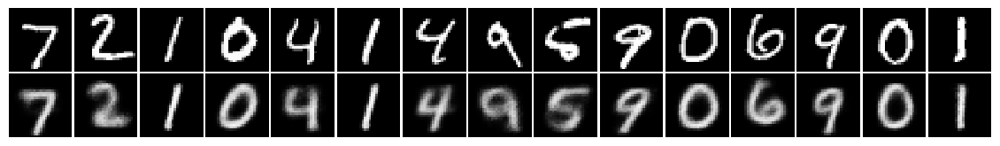

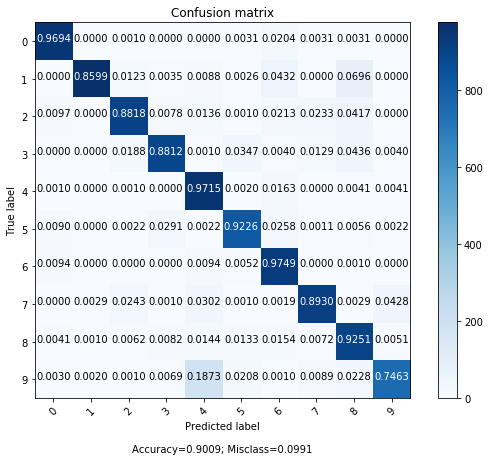

epoch 3 | iter 220 | Avg Loss: 147.94997 (±19.243) | Avg Cls Loss: 0.38075 (±0.195)
epoch 3 | iter 240 | Avg Loss: 143.75838 (±9.017) | Avg Cls Loss: 0.28094 (±0.104)
epoch 3 | iter 260 | Avg Loss: 144.08763 (±5.160) | Avg Cls Loss: 0.30905 (±0.132)
epoch 3 | iter 280 | Avg Loss: 144.94866 (±10.922) | Avg Cls Loss: 0.27253 (±0.127)
epoch 3 | iter 300 | Avg Loss: 144.76831 (±10.880) | Avg Cls Loss: 0.24912 (±0.081)
epoch 3 | iter 320 | Avg Loss: 142.99258 (±8.209) | Avg Cls Loss: 0.25584 (±0.135)
epoch 3 | iter 340 | Avg Loss: 146.17244 (±16.681) | Avg Cls Loss: 0.29872 (±0.128)
epoch 3 | iter 360 | Avg Loss: 142.68062 (±8.192) | Avg Cls Loss: 0.31153 (±0.121)
epoch 3 | iter 380 | Avg Loss: 145.91266 (±19.918) | Avg Cls Loss: 0.24271 (±0.108)
epoch 3 | iter 400 | Avg Loss: 147.20260 (±20.280) | Avg Cls Loss: 0.29014 (±0.156)


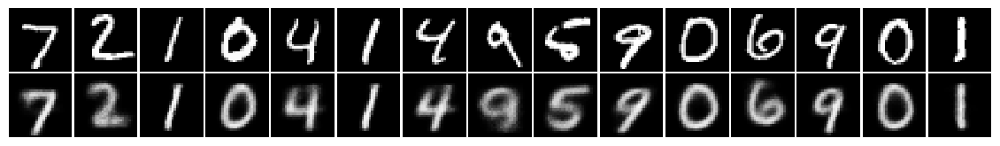

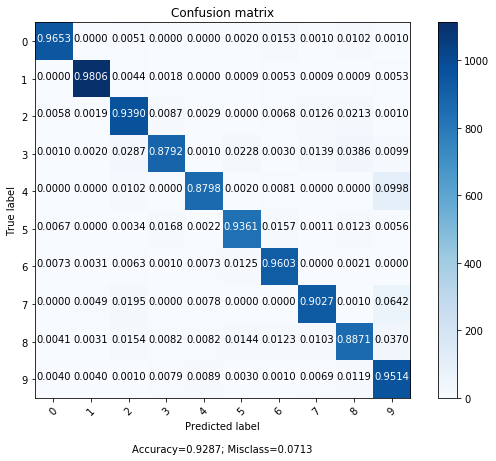

epoch 3 | iter 420 | Avg Loss: 150.75797 (±32.875) | Avg Cls Loss: 0.39304 (±0.147)
epoch 3 | iter 440 | Avg Loss: 150.36140 (±34.812) | Avg Cls Loss: 0.42941 (±0.157)
epoch 3 | iter 460 | Avg Loss: 149.96400 (±31.931) | Avg Cls Loss: 0.56313 (±0.224)
epoch 3 | iter 480 | Avg Loss: 144.43418 (±12.681) | Avg Cls Loss: 0.34401 (±0.130)
epoch 3 | iter 500 | Avg Loss: 139.91361 (±3.793) | Avg Cls Loss: 0.23922 (±0.116)
epoch 3 | iter 520 | Avg Loss: 143.75581 (±8.270) | Avg Cls Loss: 0.24711 (±0.130)
epoch 3 | iter 540 | Avg Loss: 142.41981 (±4.917) | Avg Cls Loss: 0.22328 (±0.112)
epoch 3 | iter 560 | Avg Loss: 145.57930 (±16.360) | Avg Cls Loss: 0.27415 (±0.115)
epoch 3 | iter 580 | Avg Loss: 140.26315 (±6.914) | Avg Cls Loss: 0.23039 (±0.087)
epoch 4 | iter 20 | Avg Loss: 142.27274 (±8.418) | Avg Cls Loss: 0.26163 (±0.121)
epoch 4 | iter 40 | Avg Loss: 140.74954 (±6.996) | Avg Cls Loss: 0.23354 (±0.114)
epoch 4 | iter 60 | Avg Loss: 141.93165 (±9.962) | Avg Cls Loss: 0.29125 (±0.146)
ep

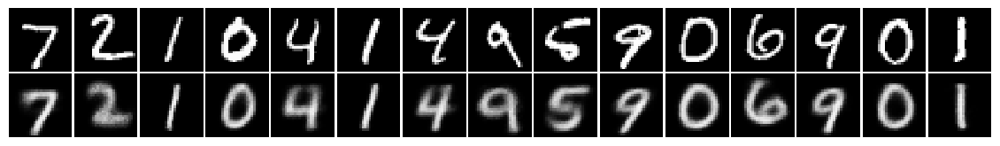

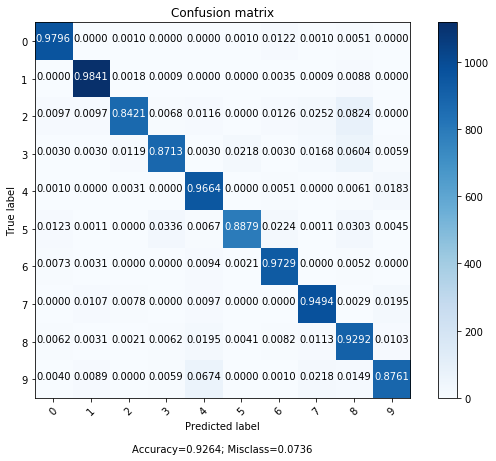

epoch 4 | iter 220 | Avg Loss: 141.34689 (±7.844) | Avg Cls Loss: 0.34461 (±0.131)
epoch 4 | iter 240 | Avg Loss: 142.92012 (±6.111) | Avg Cls Loss: 0.30813 (±0.130)
epoch 4 | iter 260 | Avg Loss: 139.47538 (±3.559) | Avg Cls Loss: 0.24856 (±0.125)
epoch 4 | iter 280 | Avg Loss: 142.04545 (±6.715) | Avg Cls Loss: 0.29689 (±0.158)
epoch 4 | iter 300 | Avg Loss: 142.31863 (±16.400) | Avg Cls Loss: 0.30049 (±0.128)
epoch 4 | iter 320 | Avg Loss: 141.90834 (±5.494) | Avg Cls Loss: 0.30482 (±0.118)
epoch 4 | iter 340 | Avg Loss: 139.68140 (±4.096) | Avg Cls Loss: 0.30207 (±0.119)
epoch 4 | iter 360 | Avg Loss: 140.97586 (±10.511) | Avg Cls Loss: 0.33739 (±0.185)
epoch 4 | iter 380 | Avg Loss: 141.51390 (±11.015) | Avg Cls Loss: 0.23854 (±0.136)
epoch 4 | iter 400 | Avg Loss: 141.44882 (±5.684) | Avg Cls Loss: 0.29035 (±0.127)


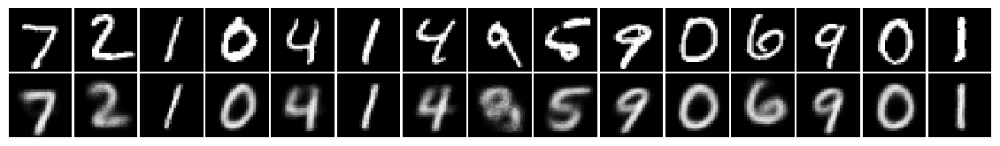

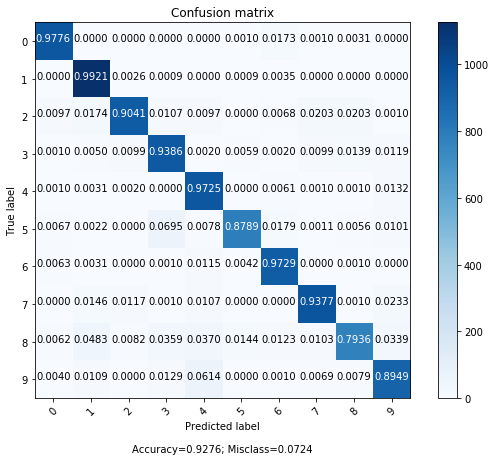

epoch 4 | iter 420 | Avg Loss: 142.58617 (±12.572) | Avg Cls Loss: 0.33990 (±0.167)
epoch 4 | iter 440 | Avg Loss: 142.07226 (±13.005) | Avg Cls Loss: 0.28047 (±0.122)
epoch 4 | iter 460 | Avg Loss: 139.90281 (±6.771) | Avg Cls Loss: 0.32011 (±0.140)
epoch 4 | iter 480 | Avg Loss: 140.43489 (±7.117) | Avg Cls Loss: 0.29569 (±0.134)
epoch 4 | iter 500 | Avg Loss: 138.29557 (±5.167) | Avg Cls Loss: 0.24629 (±0.144)
epoch 4 | iter 520 | Avg Loss: 139.02285 (±5.523) | Avg Cls Loss: 0.22114 (±0.098)
epoch 4 | iter 540 | Avg Loss: 141.40398 (±9.887) | Avg Cls Loss: 0.28363 (±0.165)
epoch 4 | iter 560 | Avg Loss: 141.53427 (±7.587) | Avg Cls Loss: 0.29918 (±0.177)
epoch 4 | iter 580 | Avg Loss: 139.13226 (±8.207) | Avg Cls Loss: 0.24027 (±0.122)
epoch 5 | iter 20 | Avg Loss: 138.82666 (±7.495) | Avg Cls Loss: 0.29356 (±0.144)
epoch 5 | iter 40 | Avg Loss: 138.81025 (±4.362) | Avg Cls Loss: 0.26236 (±0.124)
epoch 5 | iter 60 | Avg Loss: 138.80452 (±4.203) | Avg Cls Loss: 0.26410 (±0.120)
epoch

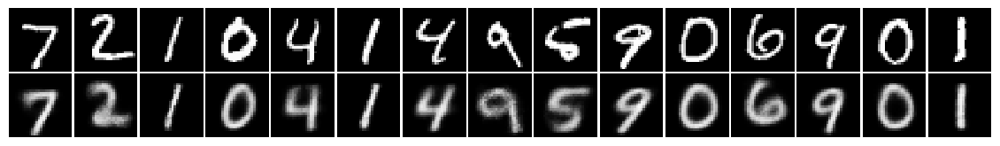

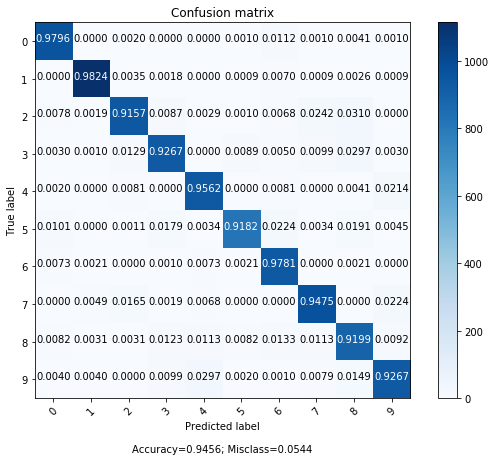

epoch 5 | iter 220 | Avg Loss: 135.99360 (±3.685) | Avg Cls Loss: 0.26046 (±0.139)
epoch 5 | iter 240 | Avg Loss: 139.77684 (±5.722) | Avg Cls Loss: 0.29600 (±0.171)
epoch 5 | iter 260 | Avg Loss: 139.20748 (±3.323) | Avg Cls Loss: 0.26818 (±0.167)
epoch 5 | iter 280 | Avg Loss: 139.60049 (±9.907) | Avg Cls Loss: 0.32764 (±0.182)
epoch 5 | iter 300 | Avg Loss: 139.40093 (±6.069) | Avg Cls Loss: 0.30242 (±0.168)
epoch 5 | iter 320 | Avg Loss: 137.57228 (±4.076) | Avg Cls Loss: 0.33393 (±0.168)
epoch 5 | iter 340 | Avg Loss: 140.62138 (±7.176) | Avg Cls Loss: 0.31174 (±0.159)
epoch 5 | iter 360 | Avg Loss: 137.83918 (±7.521) | Avg Cls Loss: 0.35909 (±0.137)
epoch 5 | iter 380 | Avg Loss: 142.43669 (±15.430) | Avg Cls Loss: 0.30617 (±0.130)
epoch 5 | iter 400 | Avg Loss: 140.06876 (±11.758) | Avg Cls Loss: 0.31572 (±0.143)


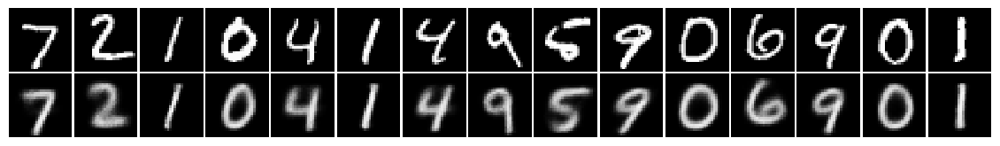

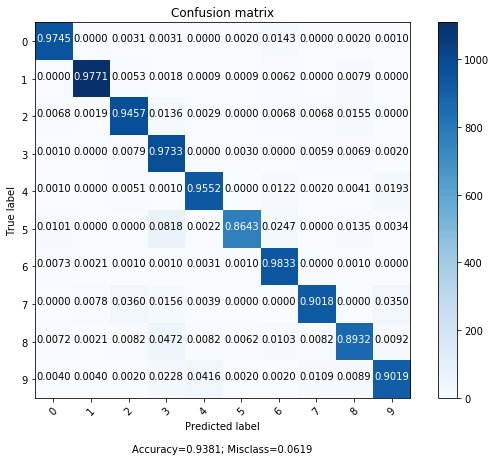

epoch 5 | iter 420 | Avg Loss: 138.44954 (±4.332) | Avg Cls Loss: 0.24692 (±0.142)
epoch 5 | iter 440 | Avg Loss: 138.45573 (±4.510) | Avg Cls Loss: 0.22001 (±0.095)
epoch 5 | iter 460 | Avg Loss: 137.70936 (±4.932) | Avg Cls Loss: 0.24054 (±0.179)
epoch 5 | iter 480 | Avg Loss: 137.81166 (±4.141) | Avg Cls Loss: 0.23588 (±0.156)
epoch 5 | iter 500 | Avg Loss: 137.90737 (±6.088) | Avg Cls Loss: 0.27489 (±0.168)
epoch 5 | iter 520 | Avg Loss: 139.80879 (±11.808) | Avg Cls Loss: 0.21398 (±0.101)
epoch 5 | iter 540 | Avg Loss: 136.75933 (±4.969) | Avg Cls Loss: 0.22328 (±0.105)
epoch 5 | iter 560 | Avg Loss: 139.38013 (±3.437) | Avg Cls Loss: 0.29953 (±0.162)
epoch 5 | iter 580 | Avg Loss: 139.94531 (±11.549) | Avg Cls Loss: 0.32227 (±0.188)
epoch 6 | iter 20 | Avg Loss: 137.75661 (±4.880) | Avg Cls Loss: 0.35174 (±0.169)
epoch 6 | iter 40 | Avg Loss: 138.95508 (±3.567) | Avg Cls Loss: 0.25383 (±0.151)
epoch 6 | iter 60 | Avg Loss: 137.00911 (±4.114) | Avg Cls Loss: 0.29535 (±0.156)
epoch

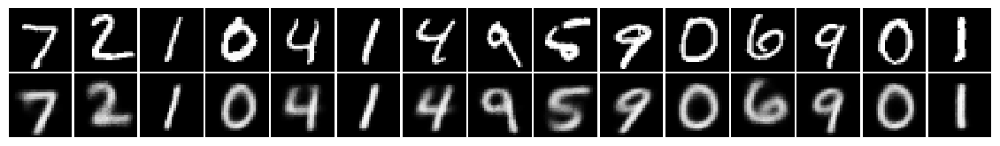

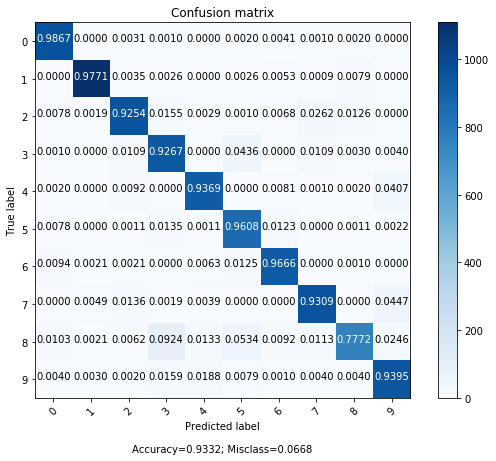

epoch 6 | iter 220 | Avg Loss: 138.83534 (±4.273) | Avg Cls Loss: 0.37527 (±0.162)
epoch 6 | iter 240 | Avg Loss: 137.99676 (±6.803) | Avg Cls Loss: 0.26883 (±0.115)
epoch 6 | iter 260 | Avg Loss: 137.78814 (±5.335) | Avg Cls Loss: 0.33955 (±0.213)
epoch 6 | iter 280 | Avg Loss: 135.62973 (±4.845) | Avg Cls Loss: 0.32040 (±0.193)
epoch 6 | iter 300 | Avg Loss: 138.52897 (±4.666) | Avg Cls Loss: 0.34386 (±0.161)
epoch 6 | iter 320 | Avg Loss: 137.03507 (±4.198) | Avg Cls Loss: 0.30846 (±0.121)
epoch 6 | iter 340 | Avg Loss: 138.78608 (±4.482) | Avg Cls Loss: 0.31842 (±0.188)
epoch 6 | iter 360 | Avg Loss: 138.95977 (±10.029) | Avg Cls Loss: 0.29874 (±0.162)
epoch 6 | iter 380 | Avg Loss: 139.08656 (±6.385) | Avg Cls Loss: 0.36664 (±0.179)
epoch 6 | iter 400 | Avg Loss: 137.57194 (±5.903) | Avg Cls Loss: 0.37711 (±0.187)


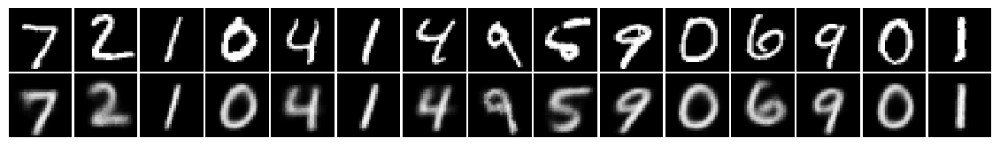

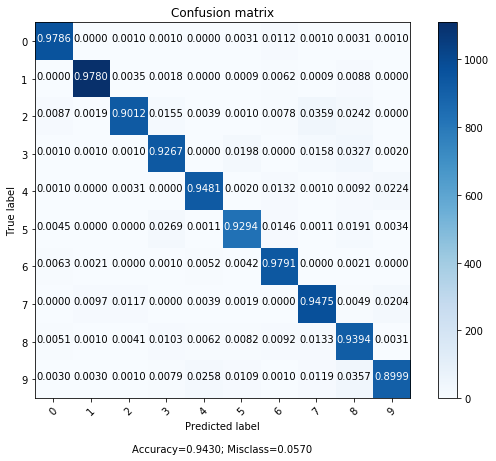

epoch 6 | iter 420 | Avg Loss: 141.82135 (±18.223) | Avg Cls Loss: 0.40854 (±0.177)
epoch 6 | iter 440 | Avg Loss: 142.43083 (±19.552) | Avg Cls Loss: 0.73019 (±0.326)
epoch 6 | iter 460 | Avg Loss: 141.14088 (±14.842) | Avg Cls Loss: 0.55254 (±0.255)
epoch 6 | iter 480 | Avg Loss: 142.87581 (±10.878) | Avg Cls Loss: 0.58618 (±0.240)
epoch 6 | iter 500 | Avg Loss: 142.30315 (±15.401) | Avg Cls Loss: 0.51348 (±0.199)
epoch 6 | iter 520 | Avg Loss: 144.80394 (±22.296) | Avg Cls Loss: 0.51906 (±0.189)
epoch 6 | iter 540 | Avg Loss: 142.42502 (±22.870) | Avg Cls Loss: 0.38990 (±0.137)
epoch 6 | iter 560 | Avg Loss: 141.78205 (±14.038) | Avg Cls Loss: 0.55336 (±0.275)
epoch 6 | iter 580 | Avg Loss: 140.37420 (±14.013) | Avg Cls Loss: 0.31103 (±0.166)
epoch 7 | iter 20 | Avg Loss: 136.90111 (±4.488) | Avg Cls Loss: 0.37760 (±0.157)
epoch 7 | iter 40 | Avg Loss: 134.53877 (±6.142) | Avg Cls Loss: 0.25551 (±0.136)
epoch 7 | iter 60 | Avg Loss: 137.62697 (±5.897) | Avg Cls Loss: 0.28516 (±0.194

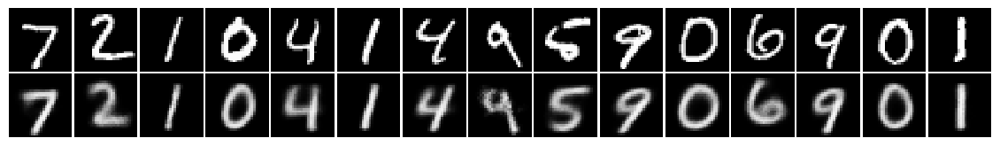

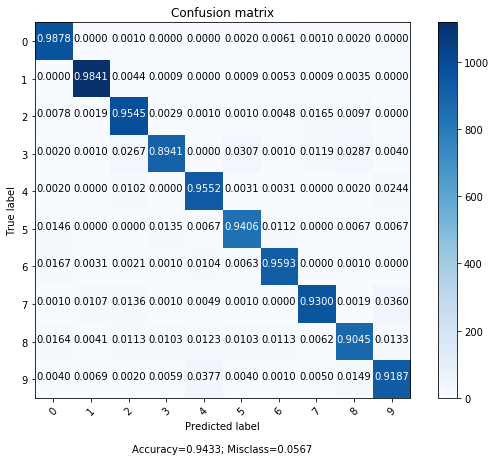

epoch 7 | iter 220 | Avg Loss: 138.16336 (±5.512) | Avg Cls Loss: 0.31357 (±0.154)
epoch 7 | iter 240 | Avg Loss: 136.14801 (±4.035) | Avg Cls Loss: 0.31488 (±0.187)
epoch 7 | iter 260 | Avg Loss: 136.36513 (±4.690) | Avg Cls Loss: 0.25778 (±0.137)
epoch 7 | iter 280 | Avg Loss: 136.92739 (±5.129) | Avg Cls Loss: 0.31742 (±0.181)
epoch 7 | iter 300 | Avg Loss: 135.71313 (±4.067) | Avg Cls Loss: 0.22849 (±0.137)
epoch 7 | iter 320 | Avg Loss: 136.46614 (±3.801) | Avg Cls Loss: 0.29989 (±0.170)
epoch 7 | iter 340 | Avg Loss: 135.71941 (±6.157) | Avg Cls Loss: 0.29961 (±0.168)
epoch 7 | iter 360 | Avg Loss: 136.96067 (±4.884) | Avg Cls Loss: 0.26716 (±0.184)
epoch 7 | iter 380 | Avg Loss: 140.98110 (±17.590) | Avg Cls Loss: 0.33014 (±0.193)
epoch 7 | iter 400 | Avg Loss: 138.08669 (±10.122) | Avg Cls Loss: 0.40654 (±0.203)


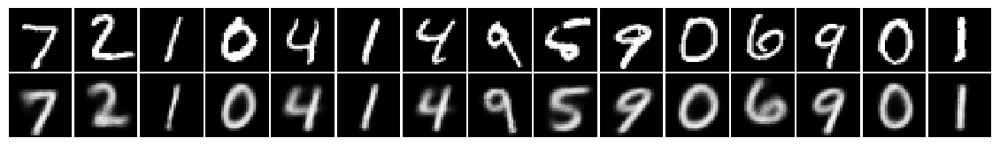

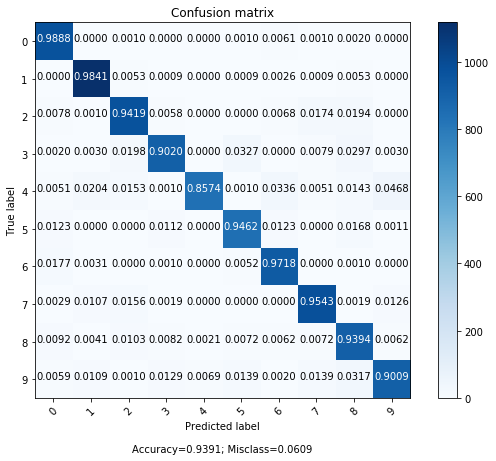

epoch 7 | iter 420 | Avg Loss: 138.32526 (±9.190) | Avg Cls Loss: 0.31584 (±0.174)
epoch 7 | iter 440 | Avg Loss: 141.29156 (±14.956) | Avg Cls Loss: 0.75322 (±0.332)
epoch 7 | iter 460 | Avg Loss: 142.58968 (±14.497) | Avg Cls Loss: 0.57462 (±0.292)
epoch 7 | iter 480 | Avg Loss: 146.67975 (±38.595) | Avg Cls Loss: 0.52872 (±0.251)
epoch 7 | iter 500 | Avg Loss: 143.85707 (±26.315) | Avg Cls Loss: 0.54072 (±0.328)
epoch 7 | iter 520 | Avg Loss: 142.17282 (±16.432) | Avg Cls Loss: 0.40259 (±0.147)
epoch 7 | iter 540 | Avg Loss: 137.54404 (±6.831) | Avg Cls Loss: 0.33631 (±0.232)
epoch 7 | iter 560 | Avg Loss: 139.86753 (±9.850) | Avg Cls Loss: 0.38876 (±0.183)
epoch 7 | iter 580 | Avg Loss: 142.78334 (±22.005) | Avg Cls Loss: 0.65258 (±0.421)
epoch 8 | iter 20 | Avg Loss: 140.02774 (±7.793) | Avg Cls Loss: 0.54190 (±0.358)
epoch 8 | iter 40 | Avg Loss: 135.37703 (±6.024) | Avg Cls Loss: 0.37484 (±0.199)
epoch 8 | iter 60 | Avg Loss: 135.65503 (±5.360) | Avg Cls Loss: 0.32359 (±0.180)
e

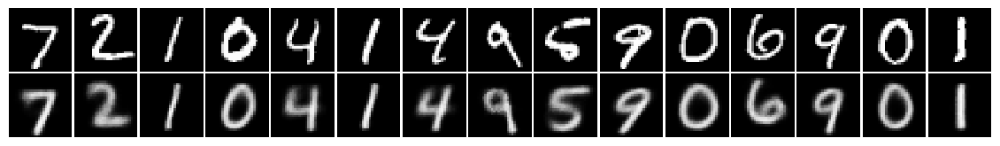

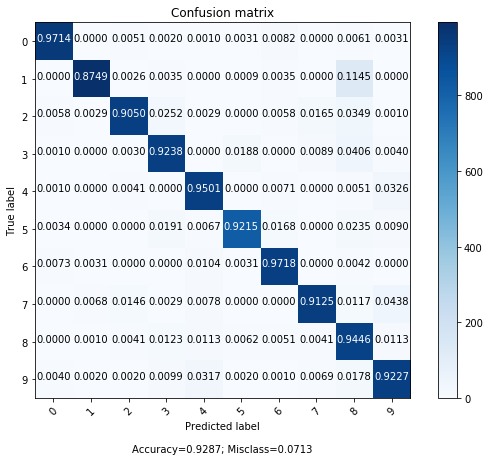

epoch 8 | iter 220 | Avg Loss: 138.27090 (±5.144) | Avg Cls Loss: 0.31821 (±0.151)
epoch 8 | iter 240 | Avg Loss: 137.17196 (±9.273) | Avg Cls Loss: 0.34199 (±0.158)
epoch 8 | iter 260 | Avg Loss: 136.26456 (±4.914) | Avg Cls Loss: 0.23820 (±0.119)
epoch 8 | iter 280 | Avg Loss: 136.63529 (±3.883) | Avg Cls Loss: 0.32037 (±0.187)
epoch 8 | iter 300 | Avg Loss: 134.72329 (±4.046) | Avg Cls Loss: 0.28492 (±0.187)
epoch 8 | iter 320 | Avg Loss: 134.26399 (±3.837) | Avg Cls Loss: 0.32185 (±0.184)
epoch 8 | iter 340 | Avg Loss: 134.96040 (±3.868) | Avg Cls Loss: 0.26538 (±0.190)
epoch 8 | iter 360 | Avg Loss: 136.44121 (±3.957) | Avg Cls Loss: 0.33304 (±0.186)
epoch 8 | iter 380 | Avg Loss: 134.08209 (±4.386) | Avg Cls Loss: 0.26770 (±0.129)
epoch 8 | iter 400 | Avg Loss: 136.83199 (±4.290) | Avg Cls Loss: 0.32152 (±0.139)


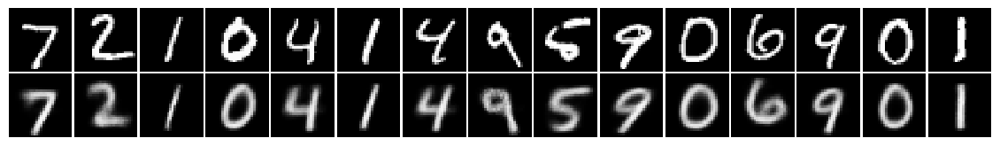

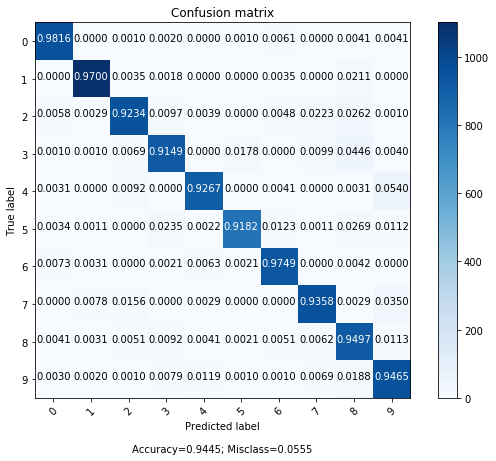

epoch 8 | iter 420 | Avg Loss: 135.51106 (±3.807) | Avg Cls Loss: 0.37576 (±0.206)
epoch 8 | iter 440 | Avg Loss: 140.66441 (±12.318) | Avg Cls Loss: 0.42479 (±0.202)
epoch 8 | iter 460 | Avg Loss: 140.34489 (±21.138) | Avg Cls Loss: 0.53942 (±0.268)
epoch 8 | iter 480 | Avg Loss: 148.32809 (±50.908) | Avg Cls Loss: 0.76905 (±0.299)
epoch 8 | iter 500 | Avg Loss: 139.90890 (±16.153) | Avg Cls Loss: 0.59100 (±0.239)
epoch 8 | iter 520 | Avg Loss: 138.81525 (±12.776) | Avg Cls Loss: 0.34993 (±0.214)
epoch 8 | iter 540 | Avg Loss: 140.49468 (±15.057) | Avg Cls Loss: 0.39830 (±0.194)
epoch 8 | iter 560 | Avg Loss: 137.19629 (±5.694) | Avg Cls Loss: 0.33582 (±0.105)
epoch 8 | iter 580 | Avg Loss: 137.27289 (±5.769) | Avg Cls Loss: 0.44431 (±0.148)
epoch 9 | iter 20 | Avg Loss: 136.95202 (±5.698) | Avg Cls Loss: 0.38792 (±0.159)
epoch 9 | iter 40 | Avg Loss: 134.66192 (±5.351) | Avg Cls Loss: 0.34611 (±0.167)
epoch 9 | iter 60 | Avg Loss: 133.62083 (±4.410) | Avg Cls Loss: 0.25552 (±0.198)
e

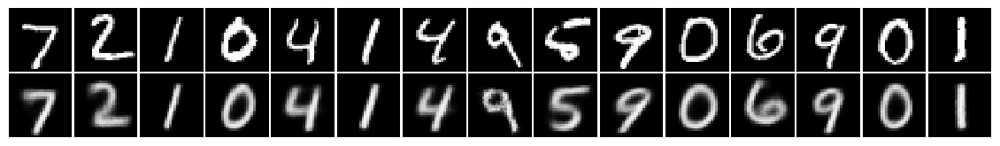

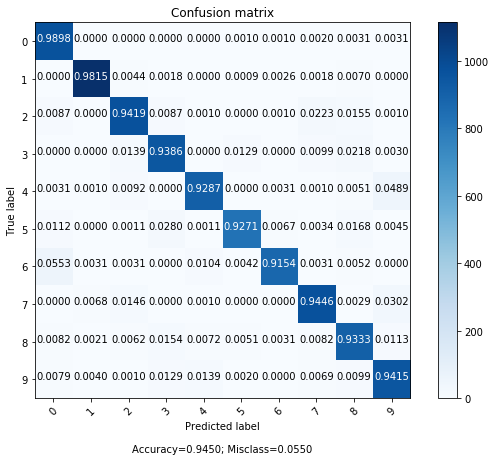

epoch 9 | iter 220 | Avg Loss: 136.84753 (±4.731) | Avg Cls Loss: 0.32992 (±0.225)
epoch 9 | iter 240 | Avg Loss: 136.23847 (±7.437) | Avg Cls Loss: 0.24746 (±0.154)
epoch 9 | iter 260 | Avg Loss: 135.59053 (±4.518) | Avg Cls Loss: 0.35660 (±0.266)
epoch 9 | iter 280 | Avg Loss: 136.19843 (±4.592) | Avg Cls Loss: 0.33771 (±0.148)
epoch 9 | iter 300 | Avg Loss: 133.83817 (±4.129) | Avg Cls Loss: 0.27031 (±0.191)
epoch 9 | iter 320 | Avg Loss: 136.03337 (±3.963) | Avg Cls Loss: 0.33439 (±0.194)
epoch 9 | iter 340 | Avg Loss: 136.70068 (±3.812) | Avg Cls Loss: 0.38628 (±0.218)
epoch 9 | iter 360 | Avg Loss: 136.07667 (±3.690) | Avg Cls Loss: 0.25672 (±0.128)
epoch 9 | iter 380 | Avg Loss: 133.69956 (±5.582) | Avg Cls Loss: 0.28134 (±0.159)
epoch 9 | iter 400 | Avg Loss: 135.17948 (±4.330) | Avg Cls Loss: 0.32988 (±0.254)


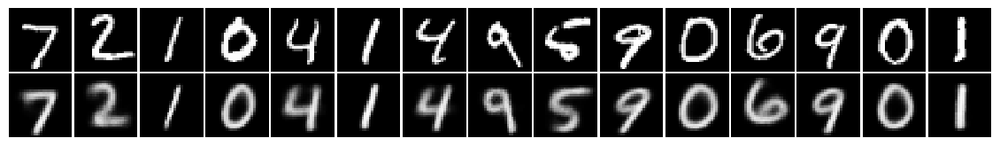

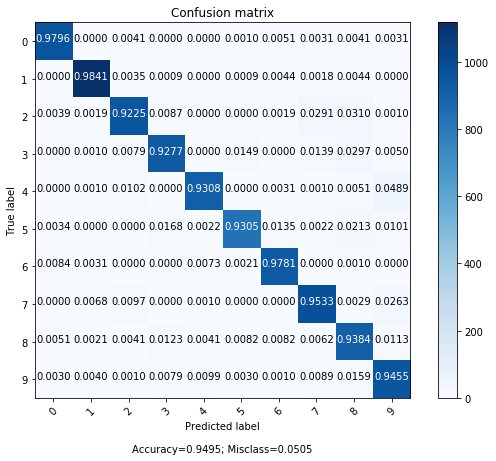

epoch 9 | iter 420 | Avg Loss: 134.80581 (±4.096) | Avg Cls Loss: 0.38322 (±0.233)
epoch 9 | iter 440 | Avg Loss: 136.52471 (±3.405) | Avg Cls Loss: 0.30527 (±0.165)
epoch 9 | iter 460 | Avg Loss: 133.17658 (±4.370) | Avg Cls Loss: 0.30848 (±0.168)
epoch 9 | iter 480 | Avg Loss: 135.83248 (±6.859) | Avg Cls Loss: 0.38509 (±0.262)
epoch 9 | iter 500 | Avg Loss: 134.05265 (±4.065) | Avg Cls Loss: 0.28664 (±0.150)
epoch 9 | iter 520 | Avg Loss: 133.14260 (±4.246) | Avg Cls Loss: 0.35230 (±0.191)
epoch 9 | iter 540 | Avg Loss: 134.37702 (±5.406) | Avg Cls Loss: 0.40341 (±0.309)
epoch 9 | iter 560 | Avg Loss: 134.74216 (±5.488) | Avg Cls Loss: 0.28497 (±0.160)
epoch 9 | iter 580 | Avg Loss: 133.54928 (±4.457) | Avg Cls Loss: 0.33609 (±0.241)
epoch 10 | iter 20 | Avg Loss: 135.25989 (±5.141) | Avg Cls Loss: 0.36146 (±0.228)
epoch 10 | iter 40 | Avg Loss: 135.20605 (±5.176) | Avg Cls Loss: 0.31840 (±0.210)
epoch 10 | iter 60 | Avg Loss: 136.93589 (±14.165) | Avg Cls Loss: 0.35550 (±0.273)
epo

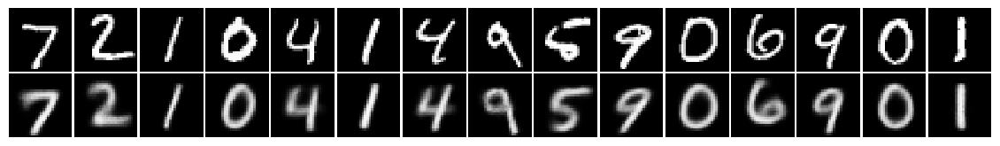

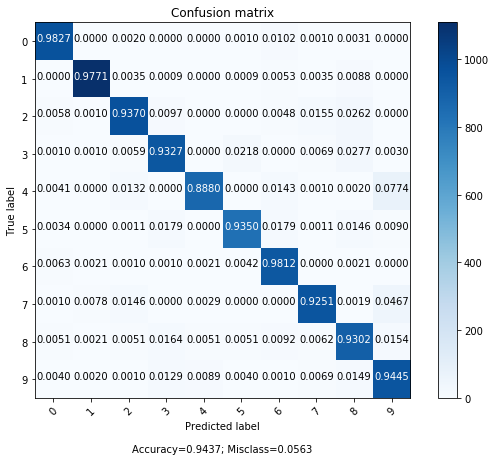

epoch 10 | iter 220 | Avg Loss: 135.77692 (±3.251) | Avg Cls Loss: 0.53411 (±0.271)
epoch 10 | iter 240 | Avg Loss: 136.07540 (±5.639) | Avg Cls Loss: 0.37513 (±0.208)
epoch 10 | iter 260 | Avg Loss: 134.86851 (±3.776) | Avg Cls Loss: 0.34084 (±0.204)
epoch 10 | iter 280 | Avg Loss: 135.54350 (±4.010) | Avg Cls Loss: 0.39853 (±0.229)
epoch 10 | iter 300 | Avg Loss: 135.89344 (±4.340) | Avg Cls Loss: 0.33082 (±0.165)
epoch 10 | iter 320 | Avg Loss: 134.42969 (±3.824) | Avg Cls Loss: 0.49476 (±0.263)
epoch 10 | iter 340 | Avg Loss: 135.55253 (±4.164) | Avg Cls Loss: 0.42788 (±0.245)
epoch 10 | iter 360 | Avg Loss: 136.45788 (±8.686) | Avg Cls Loss: 0.51673 (±0.299)
epoch 10 | iter 380 | Avg Loss: 148.37752 (±34.329) | Avg Cls Loss: 0.62586 (±0.342)
epoch 10 | iter 400 | Avg Loss: 135.48294 (±4.748) | Avg Cls Loss: 0.70585 (±0.459)


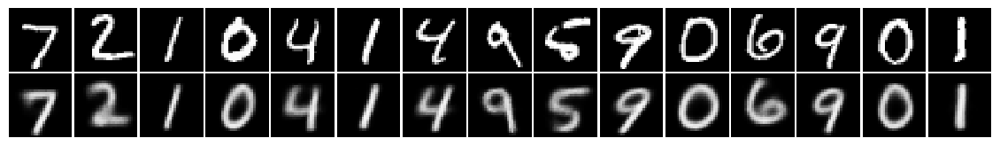

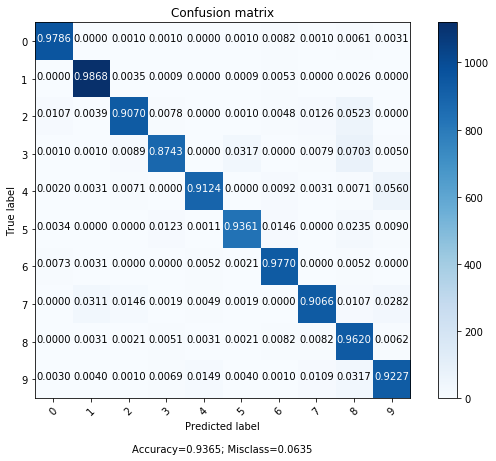

epoch 10 | iter 420 | Avg Loss: 134.86416 (±4.967) | Avg Cls Loss: 0.41301 (±0.208)
epoch 10 | iter 440 | Avg Loss: 137.19500 (±12.738) | Avg Cls Loss: 0.43206 (±0.234)
epoch 10 | iter 460 | Avg Loss: 138.29297 (±7.502) | Avg Cls Loss: 0.60863 (±0.266)
epoch 10 | iter 480 | Avg Loss: 137.29269 (±11.291) | Avg Cls Loss: 0.67362 (±0.374)
epoch 10 | iter 500 | Avg Loss: 136.58836 (±5.952) | Avg Cls Loss: 0.45060 (±0.254)
epoch 10 | iter 520 | Avg Loss: 136.77361 (±6.864) | Avg Cls Loss: 0.37387 (±0.188)
epoch 10 | iter 540 | Avg Loss: 135.15143 (±4.915) | Avg Cls Loss: 0.31237 (±0.187)
epoch 10 | iter 560 | Avg Loss: 134.60475 (±2.440) | Avg Cls Loss: 0.40606 (±0.231)
epoch 10 | iter 580 | Avg Loss: 134.72274 (±5.596) | Avg Cls Loss: 0.31688 (±0.248)
epoch 11 | iter 20 | Avg Loss: 133.96608 (±3.964) | Avg Cls Loss: 0.39633 (±0.225)
epoch 11 | iter 40 | Avg Loss: 133.42067 (±2.341) | Avg Cls Loss: 0.39519 (±0.228)
epoch 11 | iter 60 | Avg Loss: 133.32349 (±6.318) | Avg Cls Loss: 0.35353 (±

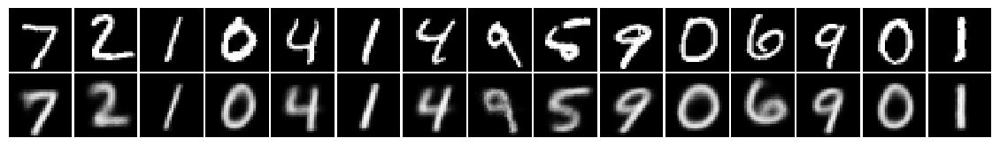

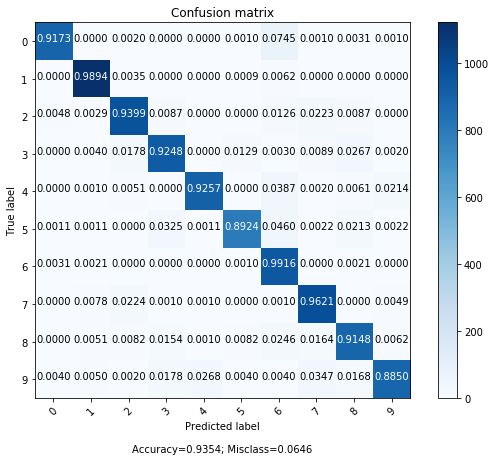

epoch 11 | iter 220 | Avg Loss: 135.19539 (±7.770) | Avg Cls Loss: 0.38096 (±0.254)
epoch 11 | iter 240 | Avg Loss: 134.66727 (±8.320) | Avg Cls Loss: 0.34545 (±0.175)
epoch 11 | iter 260 | Avg Loss: 136.06230 (±5.353) | Avg Cls Loss: 0.47131 (±0.245)
epoch 11 | iter 280 | Avg Loss: 134.16548 (±4.965) | Avg Cls Loss: 0.40224 (±0.275)
epoch 11 | iter 300 | Avg Loss: 133.65833 (±4.619) | Avg Cls Loss: 0.39822 (±0.199)
epoch 11 | iter 320 | Avg Loss: 135.71504 (±4.857) | Avg Cls Loss: 0.34875 (±0.223)
epoch 11 | iter 340 | Avg Loss: 134.20743 (±4.063) | Avg Cls Loss: 0.47232 (±0.237)
epoch 11 | iter 360 | Avg Loss: 134.77073 (±5.451) | Avg Cls Loss: 0.34436 (±0.183)
epoch 11 | iter 380 | Avg Loss: 132.72719 (±3.458) | Avg Cls Loss: 0.38867 (±0.264)
epoch 11 | iter 400 | Avg Loss: 134.04464 (±4.413) | Avg Cls Loss: 0.34247 (±0.208)


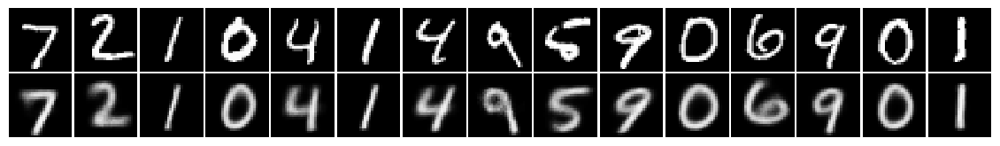

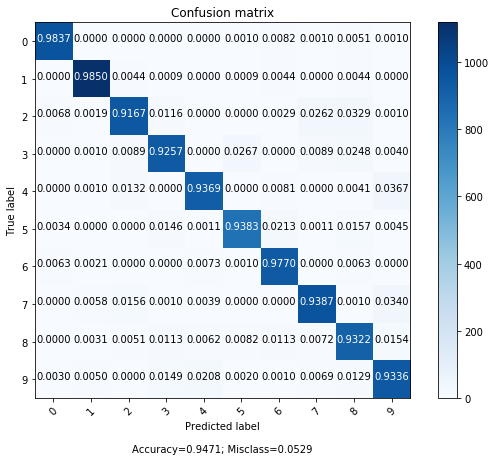

epoch 11 | iter 420 | Avg Loss: 133.75128 (±3.790) | Avg Cls Loss: 0.41030 (±0.242)
epoch 11 | iter 440 | Avg Loss: 136.59950 (±4.368) | Avg Cls Loss: 0.38721 (±0.215)
epoch 11 | iter 460 | Avg Loss: 134.04324 (±3.538) | Avg Cls Loss: 0.39442 (±0.244)
epoch 11 | iter 480 | Avg Loss: 135.38774 (±7.533) | Avg Cls Loss: 0.40783 (±0.241)
epoch 11 | iter 500 | Avg Loss: 136.18641 (±10.498) | Avg Cls Loss: 0.42471 (±0.241)
epoch 11 | iter 520 | Avg Loss: 136.49850 (±9.370) | Avg Cls Loss: 0.47398 (±0.287)
epoch 11 | iter 540 | Avg Loss: 134.82922 (±7.020) | Avg Cls Loss: 0.32956 (±0.175)
epoch 11 | iter 560 | Avg Loss: 135.09567 (±8.485) | Avg Cls Loss: 0.36878 (±0.214)
epoch 11 | iter 580 | Avg Loss: 133.16322 (±4.917) | Avg Cls Loss: 0.32201 (±0.209)
epoch 12 | iter 20 | Avg Loss: 133.16865 (±4.206) | Avg Cls Loss: 0.38509 (±0.325)
epoch 12 | iter 40 | Avg Loss: 136.05077 (±4.606) | Avg Cls Loss: 0.39663 (±0.185)
epoch 12 | iter 60 | Avg Loss: 132.10469 (±3.893) | Avg Cls Loss: 0.31905 (±0

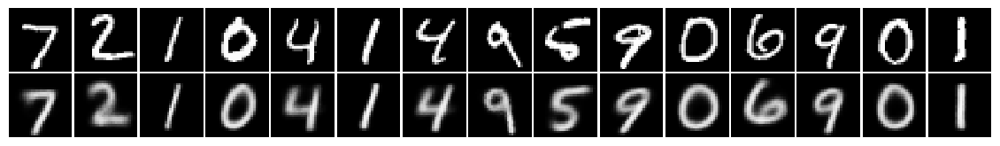

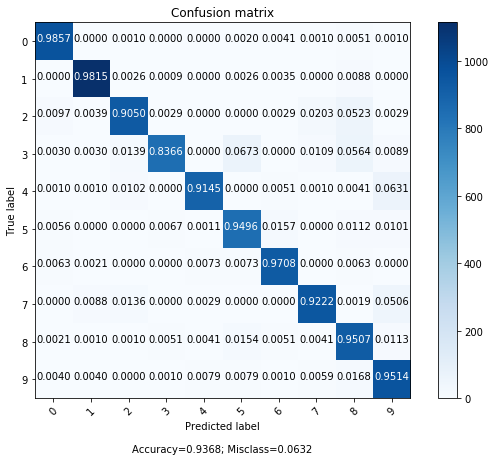

epoch 12 | iter 220 | Avg Loss: 135.66337 (±8.480) | Avg Cls Loss: 0.45382 (±0.238)
epoch 12 | iter 240 | Avg Loss: 133.99193 (±6.594) | Avg Cls Loss: 0.38457 (±0.202)
epoch 12 | iter 260 | Avg Loss: 133.65760 (±5.270) | Avg Cls Loss: 0.40246 (±0.283)
epoch 12 | iter 280 | Avg Loss: 134.82746 (±6.669) | Avg Cls Loss: 0.41703 (±0.198)
epoch 12 | iter 300 | Avg Loss: 136.18249 (±4.618) | Avg Cls Loss: 0.53506 (±0.228)
epoch 12 | iter 320 | Avg Loss: 138.65449 (±19.496) | Avg Cls Loss: 0.52406 (±0.286)
epoch 12 | iter 340 | Avg Loss: 133.49668 (±4.856) | Avg Cls Loss: 0.60375 (±0.305)
epoch 12 | iter 360 | Avg Loss: 138.32889 (±17.040) | Avg Cls Loss: 0.39978 (±0.220)
epoch 12 | iter 380 | Avg Loss: 141.90170 (±21.427) | Avg Cls Loss: 0.44862 (±0.259)
epoch 12 | iter 400 | Avg Loss: 135.30687 (±5.648) | Avg Cls Loss: 0.35835 (±0.203)


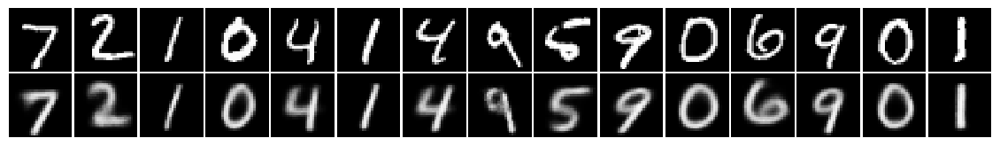

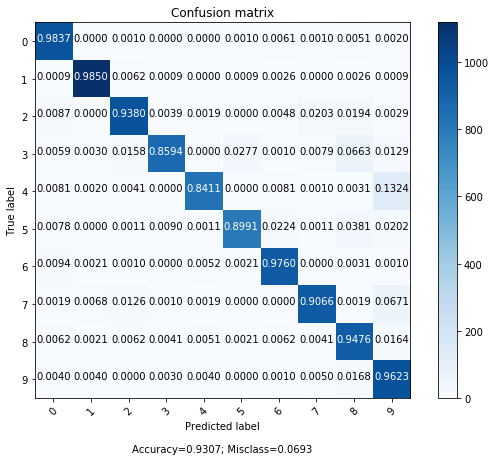

epoch 12 | iter 420 | Avg Loss: 134.22298 (±4.728) | Avg Cls Loss: 0.51024 (±0.250)
epoch 12 | iter 440 | Avg Loss: 134.97170 (±5.350) | Avg Cls Loss: 0.43865 (±0.242)
epoch 12 | iter 460 | Avg Loss: 135.83634 (±4.254) | Avg Cls Loss: 0.40115 (±0.234)
epoch 12 | iter 480 | Avg Loss: 136.15726 (±11.766) | Avg Cls Loss: 0.38058 (±0.196)
epoch 12 | iter 500 | Avg Loss: 131.87451 (±3.349) | Avg Cls Loss: 0.34048 (±0.246)
epoch 12 | iter 520 | Avg Loss: 134.14234 (±4.503) | Avg Cls Loss: 0.33802 (±0.225)
epoch 12 | iter 540 | Avg Loss: 134.04074 (±3.768) | Avg Cls Loss: 0.38319 (±0.219)
epoch 12 | iter 560 | Avg Loss: 133.83486 (±5.531) | Avg Cls Loss: 0.37748 (±0.207)
epoch 12 | iter 580 | Avg Loss: 132.19585 (±4.771) | Avg Cls Loss: 0.34620 (±0.169)
epoch 13 | iter 20 | Avg Loss: 134.77160 (±3.927) | Avg Cls Loss: 0.30613 (±0.178)
epoch 13 | iter 40 | Avg Loss: 133.32591 (±4.507) | Avg Cls Loss: 0.34229 (±0.187)
epoch 13 | iter 60 | Avg Loss: 132.11151 (±3.945) | Avg Cls Loss: 0.43700 (±0

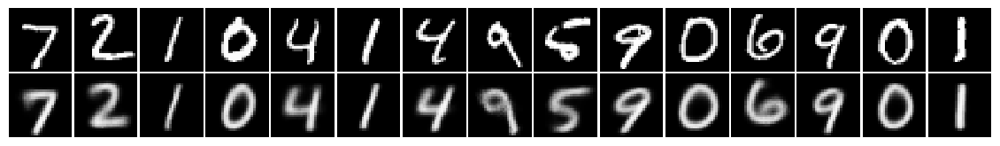

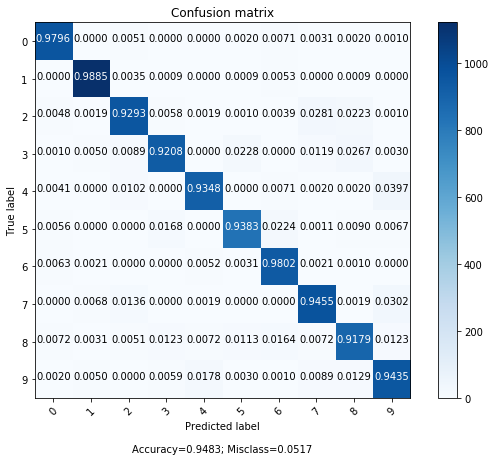

epoch 13 | iter 220 | Avg Loss: 134.02529 (±3.953) | Avg Cls Loss: 0.46133 (±0.237)
epoch 13 | iter 240 | Avg Loss: 133.42560 (±4.707) | Avg Cls Loss: 0.51297 (±0.347)
epoch 13 | iter 260 | Avg Loss: 133.70646 (±5.092) | Avg Cls Loss: 0.38213 (±0.223)
epoch 13 | iter 280 | Avg Loss: 132.90206 (±2.947) | Avg Cls Loss: 0.34516 (±0.234)
epoch 13 | iter 300 | Avg Loss: 133.23065 (±4.168) | Avg Cls Loss: 0.38688 (±0.166)
epoch 13 | iter 320 | Avg Loss: 132.45064 (±4.915) | Avg Cls Loss: 0.34493 (±0.203)
epoch 13 | iter 340 | Avg Loss: 133.66915 (±3.729) | Avg Cls Loss: 0.44113 (±0.298)
epoch 13 | iter 360 | Avg Loss: 132.75596 (±3.805) | Avg Cls Loss: 0.48407 (±0.245)
epoch 13 | iter 380 | Avg Loss: 134.30125 (±4.239) | Avg Cls Loss: 0.39188 (±0.303)
epoch 13 | iter 400 | Avg Loss: 132.53507 (±4.662) | Avg Cls Loss: 0.43789 (±0.404)


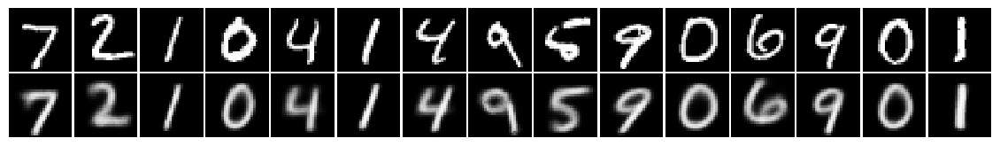

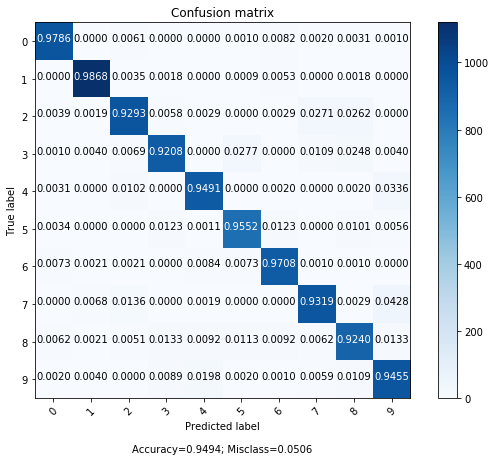

epoch 13 | iter 420 | Avg Loss: 132.54225 (±4.170) | Avg Cls Loss: 0.45701 (±0.267)
epoch 13 | iter 440 | Avg Loss: 130.81554 (±4.958) | Avg Cls Loss: 0.27647 (±0.221)
epoch 13 | iter 460 | Avg Loss: 133.58143 (±2.901) | Avg Cls Loss: 0.46548 (±0.351)
epoch 13 | iter 480 | Avg Loss: 132.87551 (±4.615) | Avg Cls Loss: 0.35625 (±0.272)
epoch 13 | iter 500 | Avg Loss: 134.03896 (±3.567) | Avg Cls Loss: 0.50071 (±0.281)
epoch 13 | iter 520 | Avg Loss: 135.88530 (±4.468) | Avg Cls Loss: 0.37094 (±0.165)
epoch 13 | iter 540 | Avg Loss: 136.36902 (±11.409) | Avg Cls Loss: 0.44845 (±0.286)
epoch 13 | iter 560 | Avg Loss: 136.13925 (±9.467) | Avg Cls Loss: 0.68069 (±0.301)
epoch 13 | iter 580 | Avg Loss: 138.30745 (±18.170) | Avg Cls Loss: 0.53466 (±0.317)
epoch 14 | iter 20 | Avg Loss: 132.18210 (±5.264) | Avg Cls Loss: 0.53690 (±0.297)
epoch 14 | iter 40 | Avg Loss: 133.51784 (±3.488) | Avg Cls Loss: 0.51275 (±0.355)
epoch 14 | iter 60 | Avg Loss: 132.91979 (±4.318) | Avg Cls Loss: 0.52611 (±

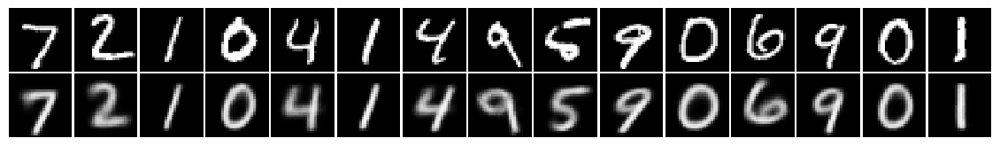

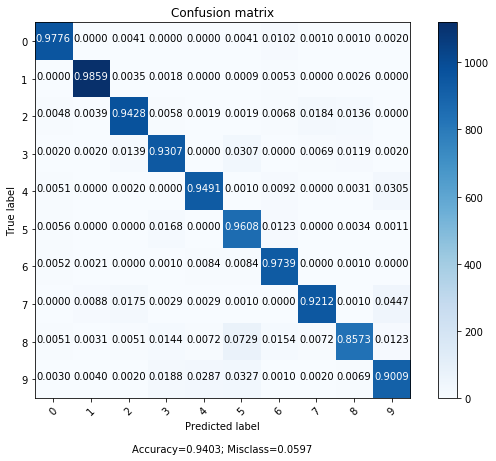

epoch 14 | iter 220 | Avg Loss: 136.05864 (±9.094) | Avg Cls Loss: 0.51160 (±0.358)
epoch 14 | iter 240 | Avg Loss: 134.83491 (±5.347) | Avg Cls Loss: 0.45401 (±0.234)
epoch 14 | iter 260 | Avg Loss: 134.40691 (±3.130) | Avg Cls Loss: 0.50354 (±0.253)
epoch 14 | iter 280 | Avg Loss: 132.06369 (±3.147) | Avg Cls Loss: 0.41182 (±0.338)
epoch 14 | iter 300 | Avg Loss: 133.39461 (±4.253) | Avg Cls Loss: 0.40611 (±0.241)
epoch 14 | iter 320 | Avg Loss: 134.12794 (±6.007) | Avg Cls Loss: 0.38213 (±0.328)
epoch 14 | iter 340 | Avg Loss: 133.41528 (±4.020) | Avg Cls Loss: 0.40690 (±0.199)
epoch 14 | iter 360 | Avg Loss: 133.37239 (±4.807) | Avg Cls Loss: 0.38432 (±0.271)
epoch 14 | iter 380 | Avg Loss: 134.65818 (±8.251) | Avg Cls Loss: 0.42540 (±0.227)
epoch 14 | iter 400 | Avg Loss: 133.87898 (±3.870) | Avg Cls Loss: 0.61692 (±0.351)


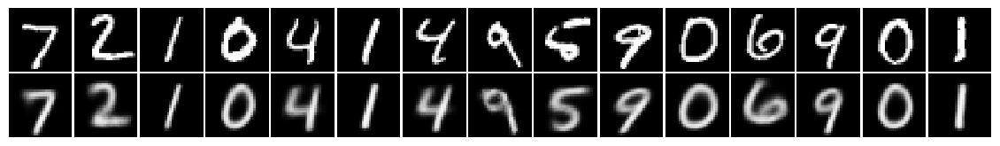

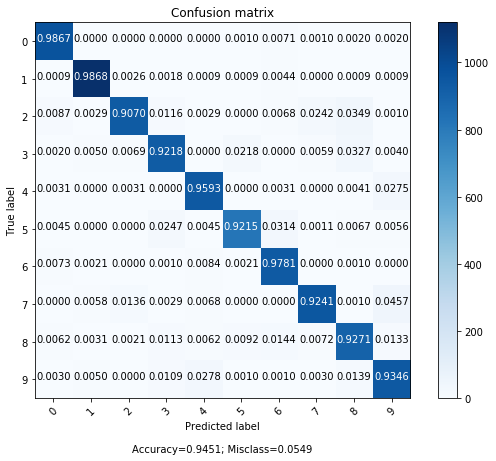

epoch 14 | iter 420 | Avg Loss: 135.62213 (±13.949) | Avg Cls Loss: 0.41393 (±0.186)
epoch 14 | iter 440 | Avg Loss: 132.98762 (±3.782) | Avg Cls Loss: 0.37100 (±0.224)
epoch 14 | iter 460 | Avg Loss: 133.92851 (±8.188) | Avg Cls Loss: 0.45596 (±0.260)
epoch 14 | iter 480 | Avg Loss: 131.62886 (±5.420) | Avg Cls Loss: 0.39415 (±0.276)
epoch 14 | iter 500 | Avg Loss: 134.19346 (±3.775) | Avg Cls Loss: 0.56960 (±0.267)
epoch 14 | iter 520 | Avg Loss: 136.14049 (±9.974) | Avg Cls Loss: 0.59316 (±0.352)
epoch 14 | iter 540 | Avg Loss: 131.55736 (±3.991) | Avg Cls Loss: 0.51676 (±0.254)
epoch 14 | iter 560 | Avg Loss: 131.89519 (±4.521) | Avg Cls Loss: 0.65663 (±0.387)
epoch 14 | iter 580 | Avg Loss: 134.15953 (±6.336) | Avg Cls Loss: 0.35131 (±0.159)
epoch 15 | iter 20 | Avg Loss: 132.86930 (±3.914) | Avg Cls Loss: 0.48601 (±0.264)
epoch 15 | iter 40 | Avg Loss: 131.88904 (±4.864) | Avg Cls Loss: 0.36777 (±0.231)
epoch 15 | iter 60 | Avg Loss: 133.37634 (±3.803) | Avg Cls Loss: 0.42061 (±0

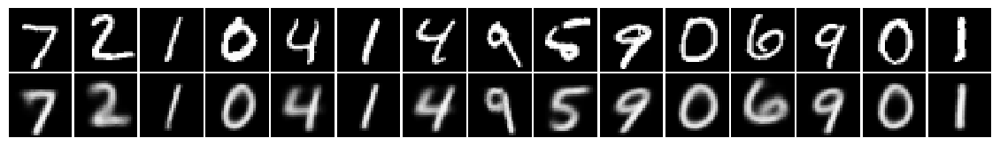

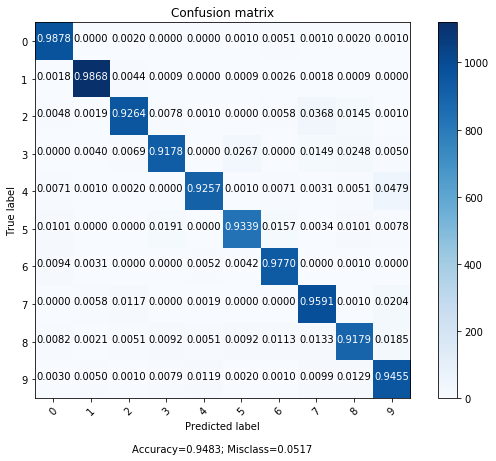

epoch 15 | iter 220 | Avg Loss: 133.30533 (±4.409) | Avg Cls Loss: 0.44043 (±0.338)
epoch 15 | iter 240 | Avg Loss: 134.06034 (±5.570) | Avg Cls Loss: 0.44756 (±0.239)
epoch 15 | iter 260 | Avg Loss: 132.49710 (±4.007) | Avg Cls Loss: 0.33967 (±0.240)
epoch 15 | iter 280 | Avg Loss: 132.19880 (±4.022) | Avg Cls Loss: 0.34666 (±0.182)
epoch 15 | iter 300 | Avg Loss: 132.33310 (±5.001) | Avg Cls Loss: 0.33086 (±0.240)
epoch 15 | iter 320 | Avg Loss: 131.96330 (±3.947) | Avg Cls Loss: 0.39468 (±0.291)
epoch 15 | iter 340 | Avg Loss: 133.53847 (±2.259) | Avg Cls Loss: 0.35045 (±0.238)
epoch 15 | iter 360 | Avg Loss: 133.39887 (±3.610) | Avg Cls Loss: 0.32629 (±0.187)
epoch 15 | iter 380 | Avg Loss: 132.44301 (±4.525) | Avg Cls Loss: 0.34432 (±0.220)
epoch 15 | iter 400 | Avg Loss: 132.14547 (±3.951) | Avg Cls Loss: 0.48318 (±0.320)


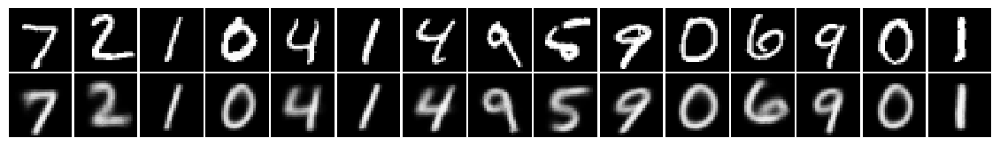

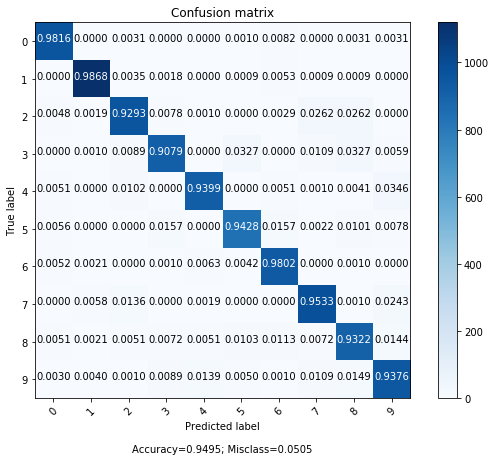

epoch 15 | iter 420 | Avg Loss: 131.92079 (±4.097) | Avg Cls Loss: 0.34959 (±0.219)
epoch 15 | iter 440 | Avg Loss: 131.13900 (±4.663) | Avg Cls Loss: 0.33258 (±0.251)
epoch 15 | iter 460 | Avg Loss: 132.89186 (±4.165) | Avg Cls Loss: 0.36579 (±0.268)
epoch 15 | iter 480 | Avg Loss: 134.25808 (±3.018) | Avg Cls Loss: 0.49895 (±0.291)
epoch 15 | iter 500 | Avg Loss: 133.21432 (±5.735) | Avg Cls Loss: 0.45918 (±0.289)
epoch 15 | iter 520 | Avg Loss: 131.70316 (±4.588) | Avg Cls Loss: 0.39040 (±0.235)
epoch 15 | iter 540 | Avg Loss: 132.61363 (±3.392) | Avg Cls Loss: 0.42553 (±0.335)
epoch 15 | iter 560 | Avg Loss: 132.32159 (±5.627) | Avg Cls Loss: 0.46404 (±0.300)
epoch 15 | iter 580 | Avg Loss: 132.68827 (±4.017) | Avg Cls Loss: 0.31488 (±0.215)
epoch 16 | iter 20 | Avg Loss: 131.19838 (±5.102) | Avg Cls Loss: 0.36196 (±0.283)
epoch 16 | iter 40 | Avg Loss: 131.43490 (±4.663) | Avg Cls Loss: 0.32729 (±0.216)
epoch 16 | iter 60 | Avg Loss: 132.84474 (±3.992) | Avg Cls Loss: 0.36360 (±0.

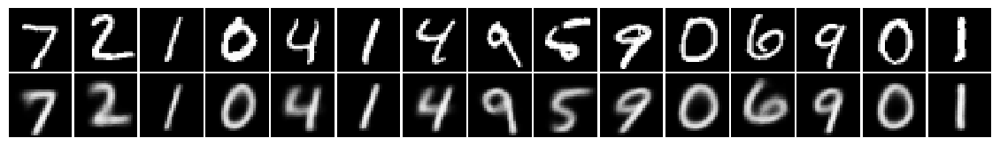

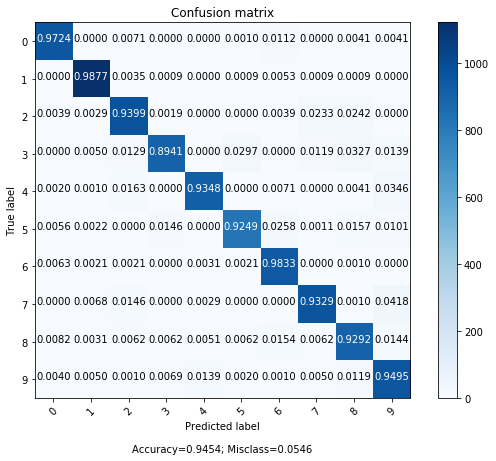

epoch 16 | iter 220 | Avg Loss: 132.08857 (±5.891) | Avg Cls Loss: 0.48026 (±0.287)
epoch 16 | iter 240 | Avg Loss: 133.98547 (±5.895) | Avg Cls Loss: 0.56862 (±0.289)
epoch 16 | iter 260 | Avg Loss: 132.75386 (±3.980) | Avg Cls Loss: 0.43933 (±0.271)
epoch 16 | iter 280 | Avg Loss: 131.19001 (±4.515) | Avg Cls Loss: 0.28041 (±0.140)
epoch 16 | iter 300 | Avg Loss: 132.04418 (±3.445) | Avg Cls Loss: 0.39988 (±0.301)
epoch 16 | iter 320 | Avg Loss: 132.55013 (±4.501) | Avg Cls Loss: 0.41306 (±0.237)
epoch 16 | iter 340 | Avg Loss: 133.34597 (±2.810) | Avg Cls Loss: 0.46187 (±0.251)
epoch 16 | iter 360 | Avg Loss: 129.22754 (±4.740) | Avg Cls Loss: 0.42815 (±0.259)
epoch 16 | iter 380 | Avg Loss: 131.75619 (±6.159) | Avg Cls Loss: 0.46960 (±0.299)
epoch 16 | iter 400 | Avg Loss: 132.74259 (±3.444) | Avg Cls Loss: 0.43976 (±0.236)


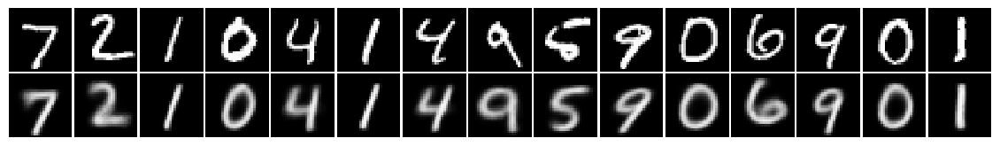

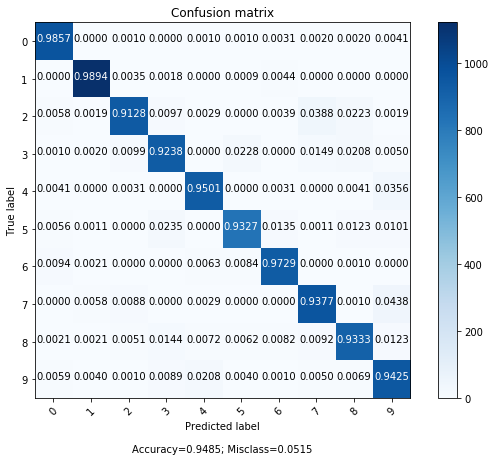

epoch 16 | iter 420 | Avg Loss: 132.88375 (±3.896) | Avg Cls Loss: 0.47837 (±0.328)
epoch 16 | iter 440 | Avg Loss: 133.26285 (±4.203) | Avg Cls Loss: 0.47086 (±0.331)
epoch 16 | iter 460 | Avg Loss: 133.56548 (±10.106) | Avg Cls Loss: 0.45765 (±0.271)
epoch 16 | iter 480 | Avg Loss: 132.31689 (±6.768) | Avg Cls Loss: 0.43819 (±0.191)
epoch 16 | iter 500 | Avg Loss: 133.03879 (±3.818) | Avg Cls Loss: 0.56198 (±0.298)
epoch 16 | iter 520 | Avg Loss: 131.09462 (±4.347) | Avg Cls Loss: 0.42605 (±0.328)
epoch 16 | iter 540 | Avg Loss: 133.05092 (±3.774) | Avg Cls Loss: 0.47447 (±0.343)
epoch 16 | iter 560 | Avg Loss: 133.52828 (±3.948) | Avg Cls Loss: 0.39677 (±0.269)
epoch 16 | iter 580 | Avg Loss: 132.15131 (±4.868) | Avg Cls Loss: 0.53583 (±0.372)
epoch 17 | iter 20 | Avg Loss: 133.24038 (±4.826) | Avg Cls Loss: 0.48881 (±0.270)
epoch 17 | iter 40 | Avg Loss: 130.22783 (±6.182) | Avg Cls Loss: 0.57353 (±0.439)
epoch 17 | iter 60 | Avg Loss: 130.06599 (±4.716) | Avg Cls Loss: 0.55817 (±0

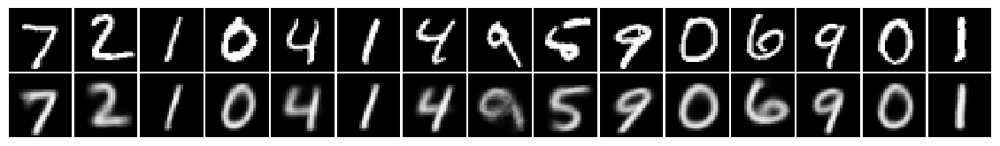

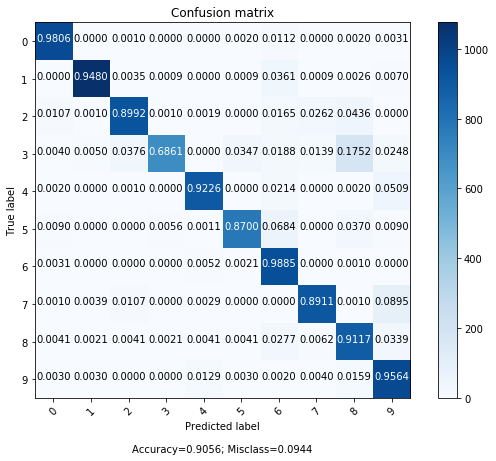

epoch 17 | iter 220 | Avg Loss: 138.25940 (±20.324) | Avg Cls Loss: 1.29326 (±0.757)
epoch 17 | iter 240 | Avg Loss: 135.91749 (±13.258) | Avg Cls Loss: 0.78274 (±0.380)
epoch 17 | iter 260 | Avg Loss: 130.51548 (±5.107) | Avg Cls Loss: 0.53689 (±0.328)
epoch 17 | iter 280 | Avg Loss: 144.96865 (±47.628) | Avg Cls Loss: 0.56798 (±0.405)
epoch 17 | iter 300 | Avg Loss: 135.70948 (±4.928) | Avg Cls Loss: 0.50715 (±0.277)
epoch 17 | iter 320 | Avg Loss: 132.02247 (±4.514) | Avg Cls Loss: 0.46472 (±0.317)
epoch 17 | iter 340 | Avg Loss: 140.85298 (±30.582) | Avg Cls Loss: 0.51784 (±0.272)
epoch 17 | iter 360 | Avg Loss: 134.45231 (±5.074) | Avg Cls Loss: 0.51552 (±0.334)
epoch 17 | iter 380 | Avg Loss: 132.79790 (±4.374) | Avg Cls Loss: 0.45076 (±0.333)
epoch 17 | iter 400 | Avg Loss: 133.59251 (±6.027) | Avg Cls Loss: 0.52084 (±0.292)


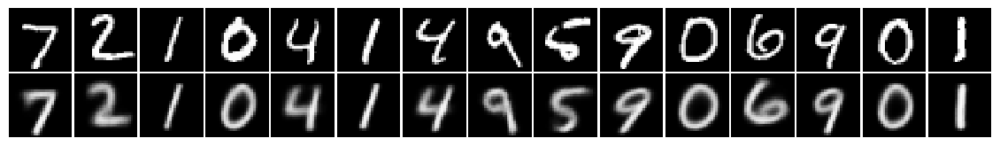

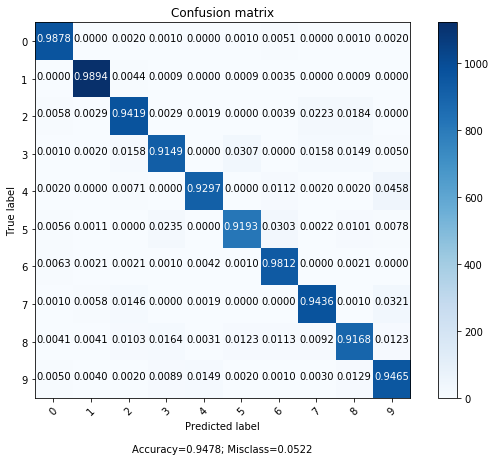

epoch 17 | iter 420 | Avg Loss: 134.22997 (±5.305) | Avg Cls Loss: 0.57044 (±0.344)
epoch 17 | iter 440 | Avg Loss: 134.78993 (±8.146) | Avg Cls Loss: 0.50814 (±0.228)
epoch 17 | iter 460 | Avg Loss: 133.24448 (±4.490) | Avg Cls Loss: 0.47013 (±0.334)
epoch 17 | iter 480 | Avg Loss: 132.29155 (±4.065) | Avg Cls Loss: 0.43829 (±0.212)
epoch 17 | iter 500 | Avg Loss: 132.31990 (±4.424) | Avg Cls Loss: 0.45323 (±0.256)
epoch 17 | iter 520 | Avg Loss: 129.91061 (±4.629) | Avg Cls Loss: 0.29223 (±0.145)
epoch 17 | iter 540 | Avg Loss: 131.97994 (±5.041) | Avg Cls Loss: 0.37796 (±0.270)
epoch 17 | iter 560 | Avg Loss: 131.87011 (±6.158) | Avg Cls Loss: 0.36314 (±0.235)
epoch 17 | iter 580 | Avg Loss: 132.24422 (±5.153) | Avg Cls Loss: 0.34569 (±0.237)
epoch 18 | iter 20 | Avg Loss: 132.21484 (±4.130) | Avg Cls Loss: 0.40565 (±0.224)
epoch 18 | iter 40 | Avg Loss: 131.88569 (±5.155) | Avg Cls Loss: 0.46296 (±0.239)
epoch 18 | iter 60 | Avg Loss: 129.79014 (±4.596) | Avg Cls Loss: 0.39400 (±0.

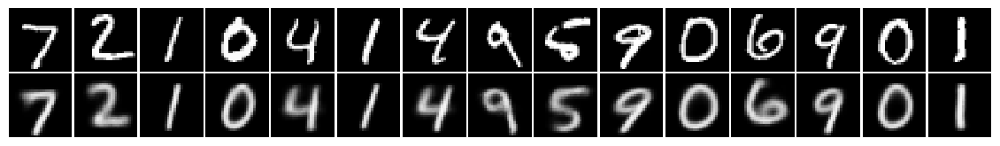

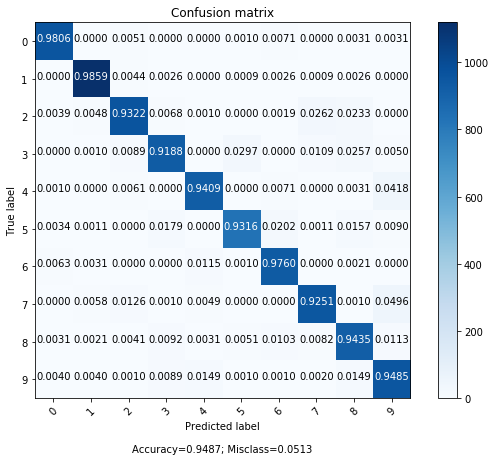

epoch 18 | iter 220 | Avg Loss: 130.80605 (±4.426) | Avg Cls Loss: 0.44850 (±0.269)
epoch 18 | iter 240 | Avg Loss: 132.44375 (±10.171) | Avg Cls Loss: 0.57081 (±0.312)
epoch 18 | iter 260 | Avg Loss: 130.53240 (±4.996) | Avg Cls Loss: 0.49802 (±0.340)
epoch 18 | iter 280 | Avg Loss: 132.69361 (±4.751) | Avg Cls Loss: 0.44523 (±0.242)
epoch 18 | iter 300 | Avg Loss: 131.94012 (±4.776) | Avg Cls Loss: 0.55316 (±0.377)
epoch 18 | iter 320 | Avg Loss: 131.29702 (±4.515) | Avg Cls Loss: 0.47300 (±0.274)
epoch 18 | iter 340 | Avg Loss: 133.41448 (±5.674) | Avg Cls Loss: 0.50490 (±0.376)
epoch 18 | iter 360 | Avg Loss: 131.72100 (±4.156) | Avg Cls Loss: 0.57878 (±0.406)
epoch 18 | iter 380 | Avg Loss: 130.61841 (±4.123) | Avg Cls Loss: 0.40279 (±0.246)
epoch 18 | iter 400 | Avg Loss: 129.86338 (±3.687) | Avg Cls Loss: 0.48420 (±0.341)


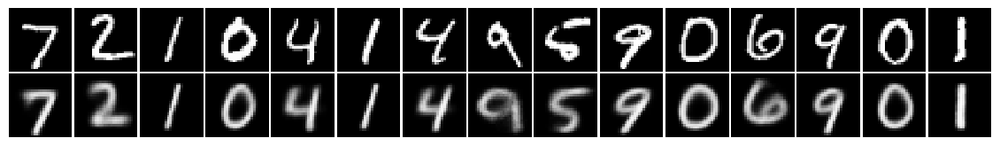

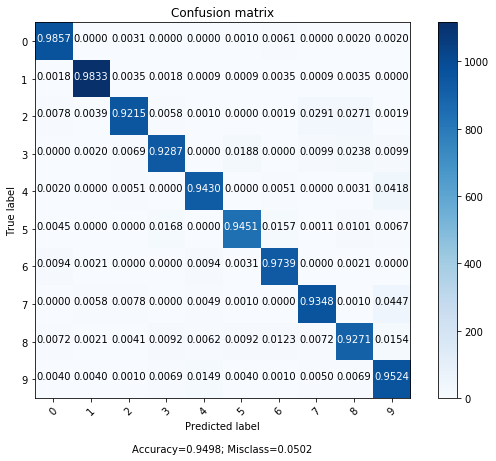

epoch 18 | iter 420 | Avg Loss: 132.38373 (±4.361) | Avg Cls Loss: 0.55031 (±0.324)
epoch 18 | iter 440 | Avg Loss: 131.23647 (±2.765) | Avg Cls Loss: 0.38166 (±0.220)
epoch 18 | iter 460 | Avg Loss: 131.47888 (±4.378) | Avg Cls Loss: 0.43582 (±0.257)
epoch 18 | iter 480 | Avg Loss: 131.77465 (±4.621) | Avg Cls Loss: 0.46737 (±0.243)
epoch 18 | iter 500 | Avg Loss: 131.52207 (±5.066) | Avg Cls Loss: 0.51553 (±0.403)
epoch 18 | iter 520 | Avg Loss: 135.30461 (±10.143) | Avg Cls Loss: 0.46734 (±0.231)
epoch 18 | iter 540 | Avg Loss: 137.71629 (±24.898) | Avg Cls Loss: 0.55710 (±0.314)
epoch 18 | iter 560 | Avg Loss: 134.68936 (±6.034) | Avg Cls Loss: 0.65187 (±0.244)
epoch 18 | iter 580 | Avg Loss: 133.92894 (±5.936) | Avg Cls Loss: 0.49951 (±0.293)
epoch 19 | iter 20 | Avg Loss: 132.79643 (±4.097) | Avg Cls Loss: 0.49472 (±0.285)
epoch 19 | iter 40 | Avg Loss: 132.63829 (±4.867) | Avg Cls Loss: 0.60675 (±0.362)
epoch 19 | iter 60 | Avg Loss: 129.96079 (±4.695) | Avg Cls Loss: 0.48051 (±

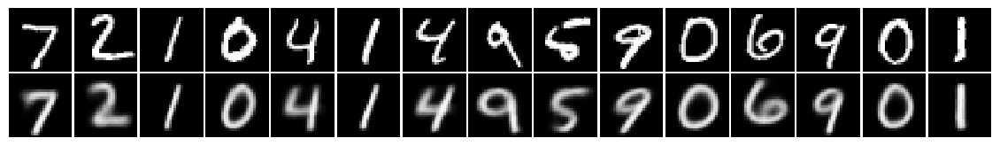

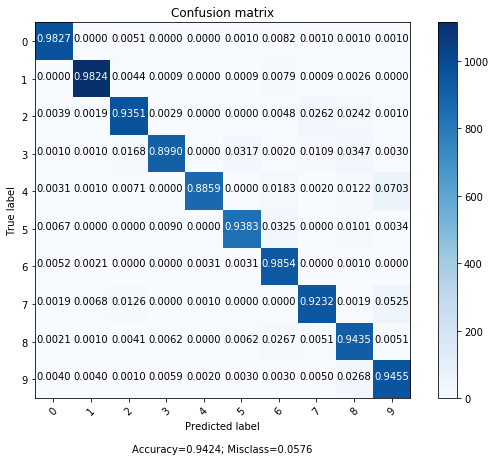

epoch 19 | iter 220 | Avg Loss: 131.06516 (±3.859) | Avg Cls Loss: 0.47060 (±0.305)
epoch 19 | iter 240 | Avg Loss: 130.74691 (±3.472) | Avg Cls Loss: 0.45643 (±0.207)
epoch 19 | iter 260 | Avg Loss: 130.70227 (±4.201) | Avg Cls Loss: 0.45041 (±0.362)
epoch 19 | iter 280 | Avg Loss: 132.31632 (±3.763) | Avg Cls Loss: 0.52168 (±0.395)
epoch 19 | iter 300 | Avg Loss: 132.65844 (±3.984) | Avg Cls Loss: 0.54144 (±0.386)
epoch 19 | iter 320 | Avg Loss: 129.77150 (±4.092) | Avg Cls Loss: 0.47482 (±0.337)
epoch 19 | iter 340 | Avg Loss: 131.76016 (±3.301) | Avg Cls Loss: 0.67277 (±0.366)
epoch 19 | iter 360 | Avg Loss: 130.63679 (±4.106) | Avg Cls Loss: 0.40396 (±0.306)
epoch 19 | iter 380 | Avg Loss: 131.06679 (±3.491) | Avg Cls Loss: 0.40282 (±0.264)
epoch 19 | iter 400 | Avg Loss: 130.99357 (±3.763) | Avg Cls Loss: 0.40691 (±0.279)


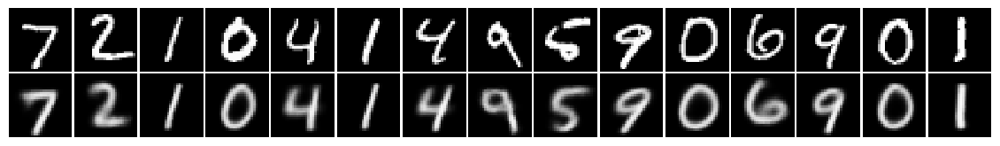

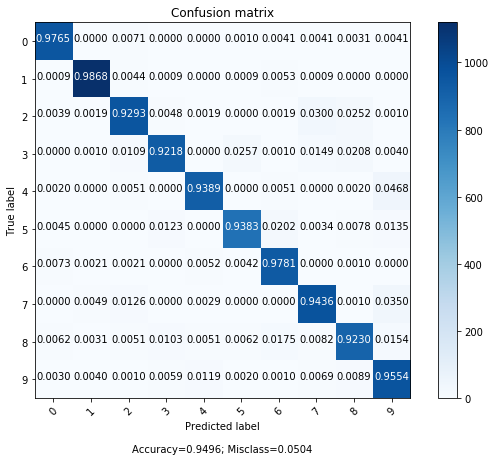

epoch 19 | iter 420 | Avg Loss: 131.43379 (±3.218) | Avg Cls Loss: 0.54089 (±0.327)
epoch 19 | iter 440 | Avg Loss: 131.06135 (±3.985) | Avg Cls Loss: 0.75631 (±0.355)
epoch 19 | iter 460 | Avg Loss: 131.79673 (±4.927) | Avg Cls Loss: 0.61028 (±0.316)
epoch 19 | iter 480 | Avg Loss: 131.42737 (±3.743) | Avg Cls Loss: 0.62020 (±0.392)
epoch 19 | iter 500 | Avg Loss: 129.85337 (±3.734) | Avg Cls Loss: 0.50142 (±0.354)
epoch 19 | iter 520 | Avg Loss: 130.25755 (±4.315) | Avg Cls Loss: 0.56098 (±0.286)
epoch 19 | iter 540 | Avg Loss: 131.11341 (±3.662) | Avg Cls Loss: 0.67925 (±0.384)
epoch 19 | iter 560 | Avg Loss: 132.93480 (±3.554) | Avg Cls Loss: 0.59711 (±0.360)
epoch 19 | iter 580 | Avg Loss: 130.77382 (±3.674) | Avg Cls Loss: 0.55363 (±0.287)
epoch 20 | iter 20 | Avg Loss: 132.02424 (±5.013) | Avg Cls Loss: 0.67252 (±0.368)
epoch 20 | iter 40 | Avg Loss: 131.44428 (±4.409) | Avg Cls Loss: 0.55474 (±0.338)
epoch 20 | iter 60 | Avg Loss: 129.59626 (±3.951) | Avg Cls Loss: 0.82435 (±0.

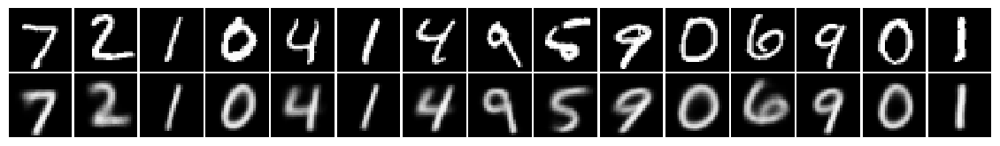

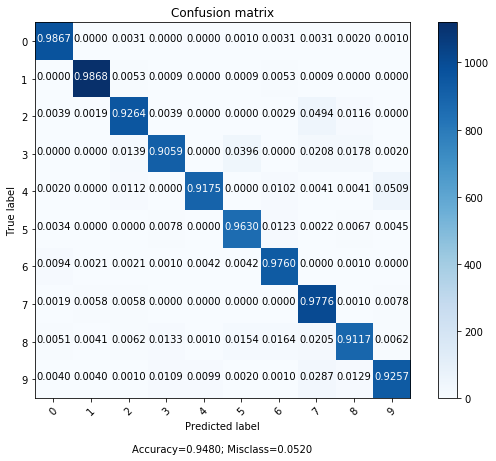

epoch 20 | iter 220 | Avg Loss: 131.31447 (±3.567) | Avg Cls Loss: 0.46221 (±0.298)
epoch 20 | iter 240 | Avg Loss: 131.90013 (±2.858) | Avg Cls Loss: 0.62321 (±0.320)
epoch 20 | iter 260 | Avg Loss: 129.90220 (±4.524) | Avg Cls Loss: 0.50073 (±0.351)
epoch 20 | iter 280 | Avg Loss: 131.73790 (±5.352) | Avg Cls Loss: 0.43888 (±0.276)
epoch 20 | iter 300 | Avg Loss: 130.63749 (±2.875) | Avg Cls Loss: 0.57513 (±0.414)
epoch 20 | iter 320 | Avg Loss: 131.03053 (±4.043) | Avg Cls Loss: 0.55037 (±0.304)
epoch 20 | iter 340 | Avg Loss: 130.87437 (±4.110) | Avg Cls Loss: 0.43483 (±0.248)
epoch 20 | iter 360 | Avg Loss: 130.63696 (±3.323) | Avg Cls Loss: 0.54305 (±0.309)
epoch 20 | iter 380 | Avg Loss: 131.00859 (±4.366) | Avg Cls Loss: 0.45547 (±0.357)
epoch 20 | iter 400 | Avg Loss: 130.67308 (±4.683) | Avg Cls Loss: 0.57796 (±0.394)


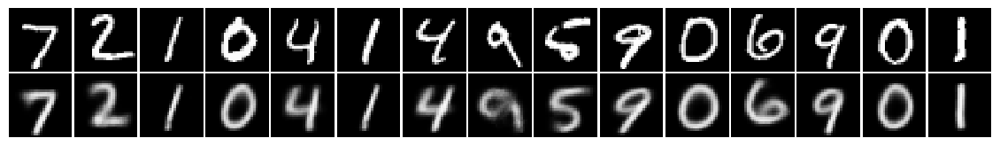

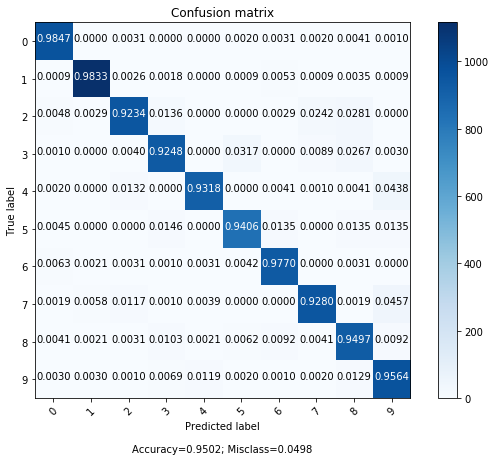

epoch 20 | iter 420 | Avg Loss: 131.22496 (±3.734) | Avg Cls Loss: 0.48771 (±0.318)
epoch 20 | iter 440 | Avg Loss: 130.44798 (±4.107) | Avg Cls Loss: 0.40514 (±0.227)
epoch 20 | iter 460 | Avg Loss: 131.26906 (±5.395) | Avg Cls Loss: 0.56103 (±0.441)
epoch 20 | iter 480 | Avg Loss: 130.74110 (±4.236) | Avg Cls Loss: 0.50480 (±0.298)
epoch 20 | iter 500 | Avg Loss: 131.08912 (±5.904) | Avg Cls Loss: 0.63359 (±0.341)
epoch 20 | iter 520 | Avg Loss: 130.27565 (±3.635) | Avg Cls Loss: 0.60491 (±0.423)
epoch 20 | iter 540 | Avg Loss: 133.04724 (±4.689) | Avg Cls Loss: 0.54352 (±0.364)
epoch 20 | iter 560 | Avg Loss: 130.20577 (±3.766) | Avg Cls Loss: 0.69104 (±0.326)
epoch 20 | iter 580 | Avg Loss: 129.92503 (±4.536) | Avg Cls Loss: 0.55128 (±0.326)
epoch 21 | iter 20 | Avg Loss: 130.57571 (±3.358) | Avg Cls Loss: 0.80401 (±0.388)
epoch 21 | iter 40 | Avg Loss: 130.21665 (±3.253) | Avg Cls Loss: 0.64328 (±0.391)
epoch 21 | iter 60 | Avg Loss: 131.07558 (±3.859) | Avg Cls Loss: 0.68782 (±0.

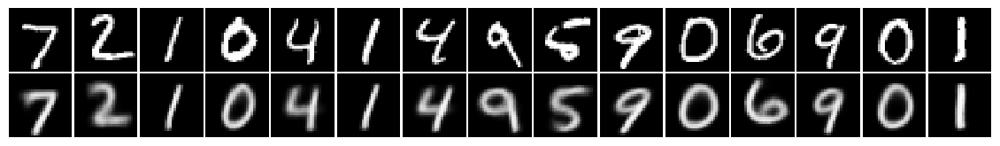

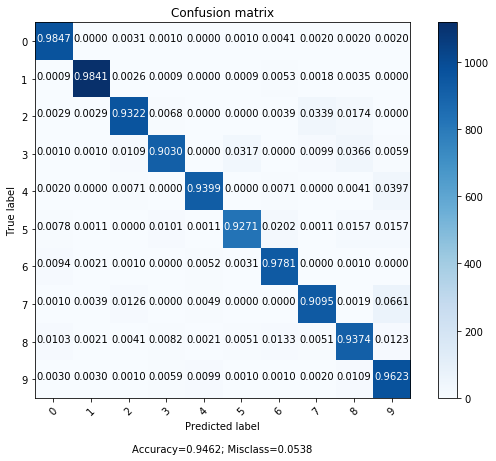

epoch 21 | iter 220 | Avg Loss: 130.31325 (±3.149) | Avg Cls Loss: 0.56346 (±0.301)
epoch 21 | iter 240 | Avg Loss: 131.31934 (±3.999) | Avg Cls Loss: 0.66909 (±0.508)
epoch 21 | iter 260 | Avg Loss: 131.03978 (±4.379) | Avg Cls Loss: 0.59126 (±0.409)
epoch 21 | iter 280 | Avg Loss: 130.93408 (±3.596) | Avg Cls Loss: 0.60268 (±0.365)
epoch 21 | iter 300 | Avg Loss: 132.11558 (±4.335) | Avg Cls Loss: 0.66433 (±0.377)
epoch 21 | iter 320 | Avg Loss: 129.92491 (±3.951) | Avg Cls Loss: 0.55551 (±0.365)
epoch 21 | iter 340 | Avg Loss: 131.86545 (±4.083) | Avg Cls Loss: 0.65258 (±0.494)
epoch 21 | iter 360 | Avg Loss: 130.41623 (±3.041) | Avg Cls Loss: 0.66861 (±0.389)
epoch 21 | iter 380 | Avg Loss: 128.95702 (±3.393) | Avg Cls Loss: 0.58158 (±0.372)
epoch 21 | iter 400 | Avg Loss: 130.67597 (±4.718) | Avg Cls Loss: 0.52385 (±0.286)


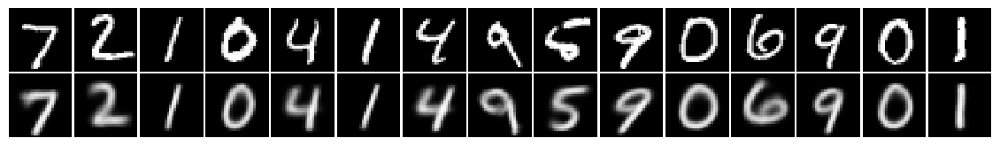

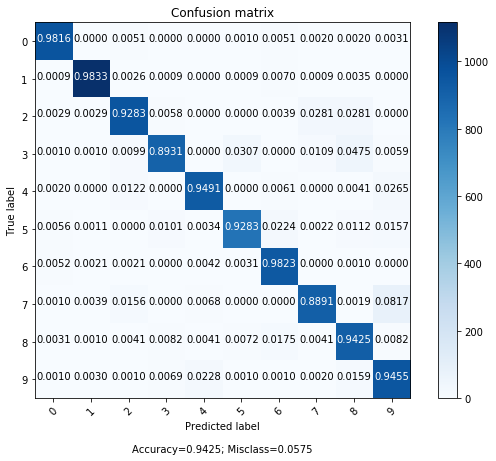

epoch 21 | iter 420 | Avg Loss: 130.78375 (±5.723) | Avg Cls Loss: 0.66290 (±0.342)
epoch 21 | iter 440 | Avg Loss: 131.98858 (±5.261) | Avg Cls Loss: 0.67211 (±0.300)
epoch 21 | iter 460 | Avg Loss: 131.41376 (±9.786) | Avg Cls Loss: 0.64867 (±0.394)
epoch 21 | iter 480 | Avg Loss: 133.72740 (±5.892) | Avg Cls Loss: 1.25119 (±0.787)
epoch 21 | iter 500 | Avg Loss: 135.54058 (±17.564) | Avg Cls Loss: 1.03064 (±0.574)
epoch 21 | iter 520 | Avg Loss: 135.81208 (±13.082) | Avg Cls Loss: 0.73540 (±0.498)
epoch 21 | iter 540 | Avg Loss: 134.36690 (±4.913) | Avg Cls Loss: 0.89937 (±0.428)
epoch 21 | iter 560 | Avg Loss: 136.93091 (±17.011) | Avg Cls Loss: 0.87389 (±0.571)
epoch 21 | iter 580 | Avg Loss: 137.42225 (±21.597) | Avg Cls Loss: 0.97064 (±0.513)
epoch 22 | iter 20 | Avg Loss: 133.04355 (±5.528) | Avg Cls Loss: 1.15650 (±0.469)
epoch 22 | iter 40 | Avg Loss: 144.91617 (±54.111) | Avg Cls Loss: 1.08063 (±0.430)
epoch 22 | iter 60 | Avg Loss: 140.94907 (±42.108) | Avg Cls Loss: 1.0189

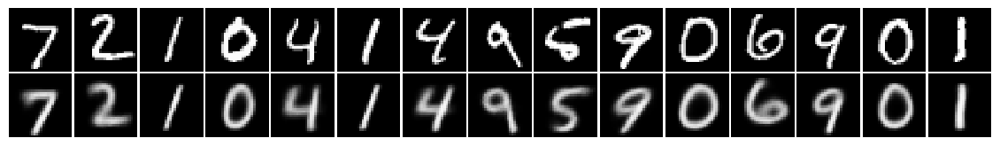

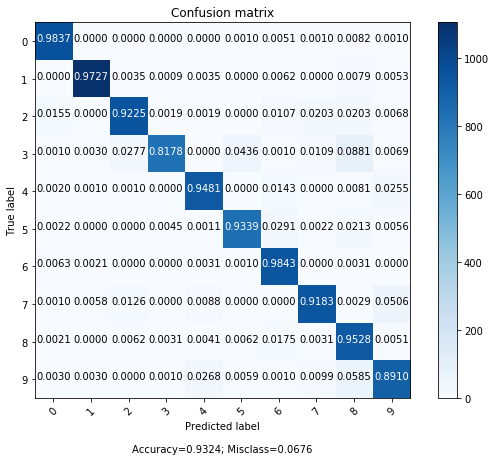

epoch 22 | iter 220 | Avg Loss: 133.43311 (±9.334) | Avg Cls Loss: 0.88884 (±0.410)
epoch 22 | iter 240 | Avg Loss: 132.60132 (±7.486) | Avg Cls Loss: 0.93843 (±0.477)
epoch 22 | iter 260 | Avg Loss: 133.75848 (±15.093) | Avg Cls Loss: 0.64238 (±0.335)
epoch 22 | iter 280 | Avg Loss: 137.56177 (±32.003) | Avg Cls Loss: 0.61620 (±0.326)
epoch 22 | iter 300 | Avg Loss: 132.87751 (±9.459) | Avg Cls Loss: 0.63886 (±0.379)
epoch 22 | iter 320 | Avg Loss: 134.03063 (±7.731) | Avg Cls Loss: 0.73877 (±0.584)
epoch 22 | iter 340 | Avg Loss: 130.59960 (±6.448) | Avg Cls Loss: 0.76713 (±0.336)
epoch 22 | iter 360 | Avg Loss: 132.58245 (±3.687) | Avg Cls Loss: 0.78739 (±0.497)
epoch 22 | iter 380 | Avg Loss: 142.40571 (±35.145) | Avg Cls Loss: 0.80713 (±0.442)
epoch 22 | iter 400 | Avg Loss: 139.46216 (±31.494) | Avg Cls Loss: 0.97593 (±0.470)


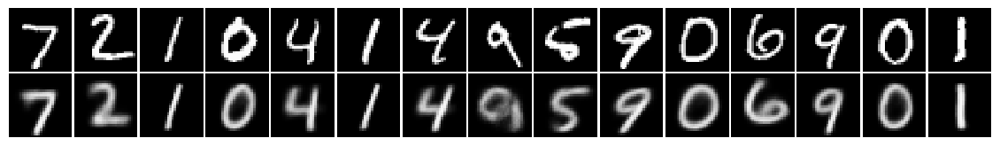

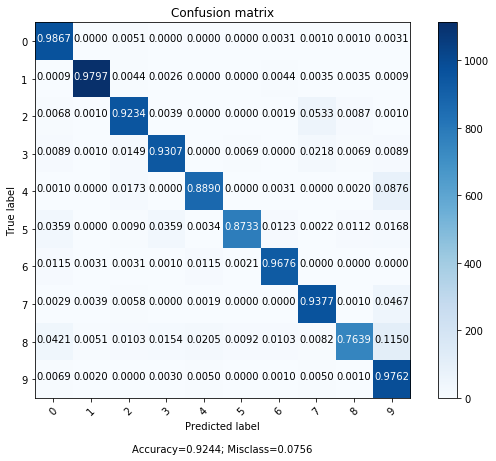

epoch 22 | iter 420 | Avg Loss: 134.83188 (±11.218) | Avg Cls Loss: 0.85219 (±0.630)
epoch 22 | iter 440 | Avg Loss: 130.69834 (±4.317) | Avg Cls Loss: 0.56906 (±0.429)
epoch 22 | iter 460 | Avg Loss: 133.97342 (±8.463) | Avg Cls Loss: 0.61763 (±0.393)
epoch 22 | iter 480 | Avg Loss: 132.51840 (±6.639) | Avg Cls Loss: 0.45061 (±0.314)
epoch 22 | iter 500 | Avg Loss: 133.84805 (±9.548) | Avg Cls Loss: 0.55341 (±0.398)
epoch 22 | iter 520 | Avg Loss: 133.17432 (±4.784) | Avg Cls Loss: 0.59603 (±0.338)
epoch 22 | iter 540 | Avg Loss: 131.65192 (±4.347) | Avg Cls Loss: 0.53276 (±0.429)
epoch 22 | iter 560 | Avg Loss: 133.98609 (±11.260) | Avg Cls Loss: 0.62776 (±0.316)
epoch 22 | iter 580 | Avg Loss: 129.76225 (±3.376) | Avg Cls Loss: 0.48991 (±0.360)
epoch 23 | iter 20 | Avg Loss: 131.06547 (±4.571) | Avg Cls Loss: 0.52413 (±0.329)
epoch 23 | iter 40 | Avg Loss: 129.97314 (±3.347) | Avg Cls Loss: 0.50540 (±0.292)
epoch 23 | iter 60 | Avg Loss: 129.51364 (±3.544) | Avg Cls Loss: 0.47788 (±

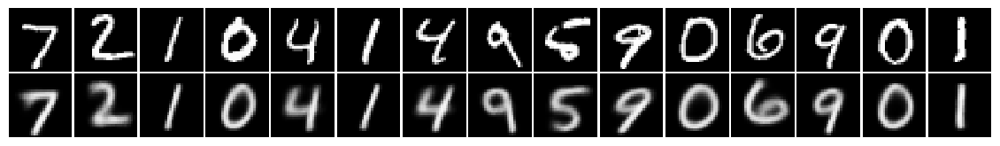

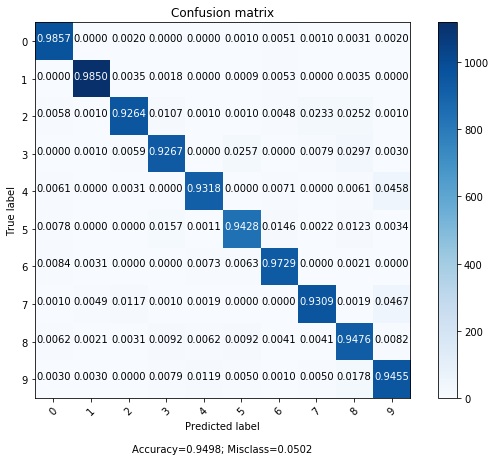

epoch 23 | iter 220 | Avg Loss: 130.98219 (±3.693) | Avg Cls Loss: 0.52603 (±0.433)
epoch 23 | iter 240 | Avg Loss: 131.47915 (±6.199) | Avg Cls Loss: 0.67364 (±0.382)
epoch 23 | iter 260 | Avg Loss: 132.11666 (±8.361) | Avg Cls Loss: 0.58946 (±0.303)
epoch 23 | iter 280 | Avg Loss: 130.68786 (±3.726) | Avg Cls Loss: 0.49937 (±0.435)
epoch 23 | iter 300 | Avg Loss: 130.58034 (±4.016) | Avg Cls Loss: 0.54334 (±0.336)
epoch 23 | iter 320 | Avg Loss: 132.40303 (±8.869) | Avg Cls Loss: 0.68412 (±0.335)
epoch 23 | iter 340 | Avg Loss: 131.76919 (±4.618) | Avg Cls Loss: 0.63391 (±0.316)
epoch 23 | iter 360 | Avg Loss: 130.62490 (±4.892) | Avg Cls Loss: 0.57171 (±0.362)
epoch 23 | iter 380 | Avg Loss: 131.32331 (±7.510) | Avg Cls Loss: 0.49555 (±0.323)
epoch 23 | iter 400 | Avg Loss: 132.41223 (±3.807) | Avg Cls Loss: 0.58979 (±0.300)


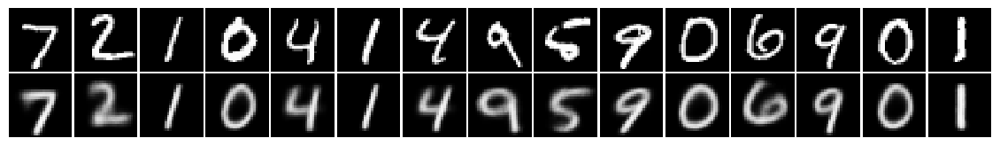

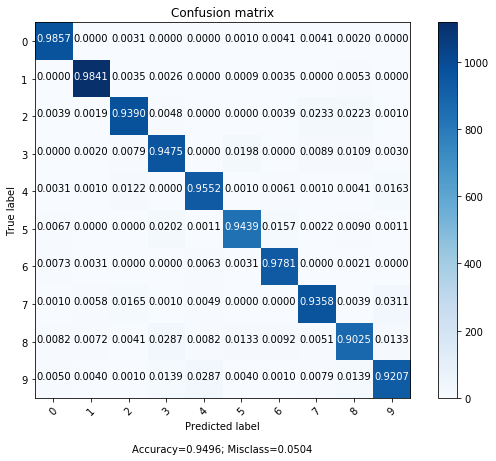

epoch 23 | iter 420 | Avg Loss: 129.64712 (±3.491) | Avg Cls Loss: 0.56878 (±0.421)
epoch 23 | iter 440 | Avg Loss: 131.27734 (±4.429) | Avg Cls Loss: 0.60082 (±0.399)
epoch 23 | iter 460 | Avg Loss: 130.42879 (±5.215) | Avg Cls Loss: 0.50002 (±0.331)
epoch 23 | iter 480 | Avg Loss: 131.52034 (±3.954) | Avg Cls Loss: 0.62209 (±0.423)
epoch 23 | iter 500 | Avg Loss: 131.67845 (±3.952) | Avg Cls Loss: 0.53967 (±0.330)
epoch 23 | iter 520 | Avg Loss: 132.76122 (±8.137) | Avg Cls Loss: 0.61166 (±0.501)
epoch 23 | iter 540 | Avg Loss: 133.45136 (±3.652) | Avg Cls Loss: 0.55672 (±0.369)
epoch 23 | iter 560 | Avg Loss: 132.07258 (±2.984) | Avg Cls Loss: 0.56136 (±0.333)
epoch 23 | iter 580 | Avg Loss: 132.11915 (±5.271) | Avg Cls Loss: 0.54583 (±0.397)
epoch 24 | iter 20 | Avg Loss: 131.52367 (±4.399) | Avg Cls Loss: 0.53416 (±0.338)
epoch 24 | iter 40 | Avg Loss: 129.64964 (±3.860) | Avg Cls Loss: 0.39326 (±0.292)
epoch 24 | iter 60 | Avg Loss: 128.81298 (±3.808) | Avg Cls Loss: 0.36506 (±0.

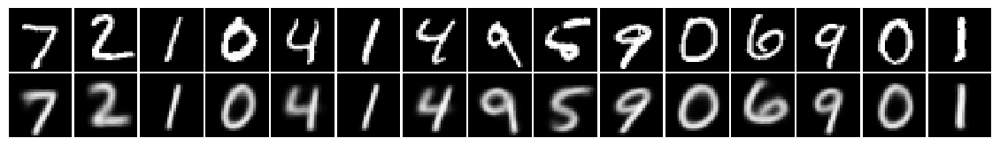

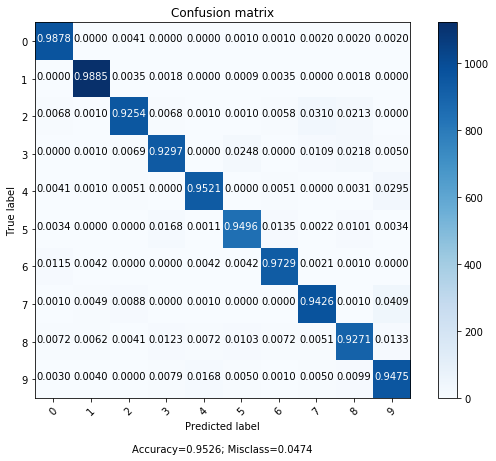

epoch 24 | iter 220 | Avg Loss: 129.80248 (±5.003) | Avg Cls Loss: 0.71488 (±0.520)
epoch 24 | iter 240 | Avg Loss: 130.68811 (±3.394) | Avg Cls Loss: 0.63226 (±0.272)
epoch 24 | iter 260 | Avg Loss: 132.24641 (±3.197) | Avg Cls Loss: 0.48180 (±0.291)
epoch 24 | iter 280 | Avg Loss: 131.52803 (±4.407) | Avg Cls Loss: 0.59742 (±0.376)
epoch 24 | iter 300 | Avg Loss: 130.60199 (±3.620) | Avg Cls Loss: 0.62718 (±0.402)
epoch 24 | iter 320 | Avg Loss: 129.97668 (±3.510) | Avg Cls Loss: 0.65522 (±0.315)
epoch 24 | iter 340 | Avg Loss: 128.90985 (±4.120) | Avg Cls Loss: 0.63411 (±0.435)
epoch 24 | iter 360 | Avg Loss: 129.79654 (±4.144) | Avg Cls Loss: 0.66826 (±0.349)
epoch 24 | iter 380 | Avg Loss: 130.23268 (±4.503) | Avg Cls Loss: 0.65104 (±0.496)
epoch 24 | iter 400 | Avg Loss: 130.18149 (±5.192) | Avg Cls Loss: 0.62181 (±0.343)


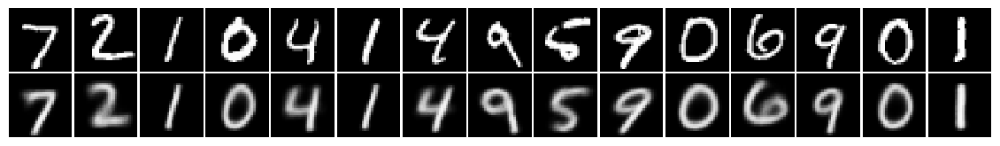

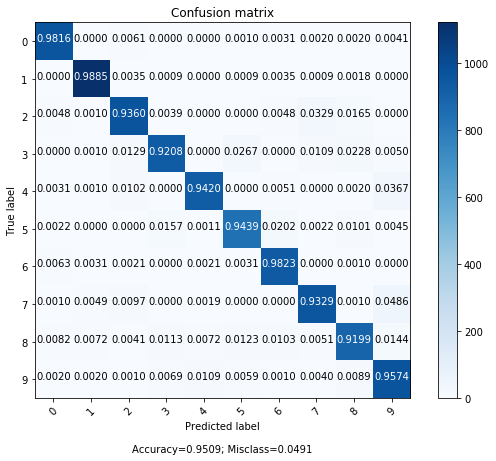

epoch 24 | iter 420 | Avg Loss: 130.33188 (±4.323) | Avg Cls Loss: 0.53268 (±0.401)
epoch 24 | iter 440 | Avg Loss: 130.85703 (±3.461) | Avg Cls Loss: 0.70379 (±0.369)
epoch 24 | iter 460 | Avg Loss: 129.80628 (±4.432) | Avg Cls Loss: 0.51311 (±0.270)
epoch 24 | iter 480 | Avg Loss: 129.33198 (±4.293) | Avg Cls Loss: 0.62905 (±0.327)
epoch 24 | iter 500 | Avg Loss: 130.75124 (±3.565) | Avg Cls Loss: 0.69715 (±0.410)
epoch 24 | iter 520 | Avg Loss: 131.10877 (±2.990) | Avg Cls Loss: 0.64977 (±0.392)
epoch 24 | iter 540 | Avg Loss: 131.38892 (±3.791) | Avg Cls Loss: 0.47708 (±0.296)
epoch 24 | iter 560 | Avg Loss: 133.29467 (±17.928) | Avg Cls Loss: 0.64339 (±0.408)
epoch 24 | iter 580 | Avg Loss: 132.44155 (±4.568) | Avg Cls Loss: 0.54328 (±0.357)
epoch 25 | iter 20 | Avg Loss: 130.43762 (±3.343) | Avg Cls Loss: 0.70668 (±0.454)
epoch 25 | iter 40 | Avg Loss: 132.99499 (±7.599) | Avg Cls Loss: 0.68972 (±0.404)
epoch 25 | iter 60 | Avg Loss: 129.18163 (±3.942) | Avg Cls Loss: 0.50370 (±0

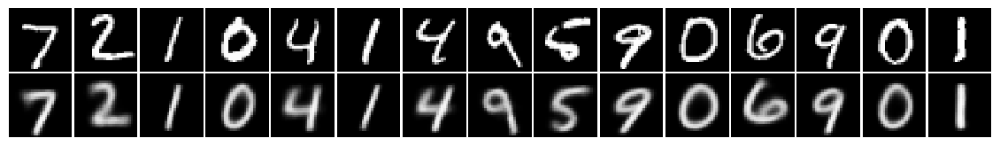

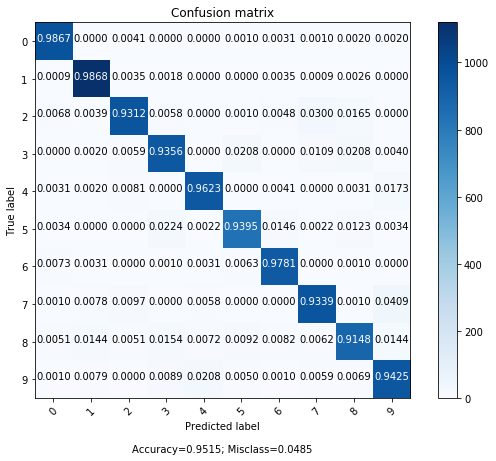

epoch 25 | iter 220 | Avg Loss: 128.47255 (±3.558) | Avg Cls Loss: 0.55706 (±0.283)
epoch 25 | iter 240 | Avg Loss: 129.64804 (±4.675) | Avg Cls Loss: 0.59709 (±0.463)
epoch 25 | iter 260 | Avg Loss: 131.49218 (±4.582) | Avg Cls Loss: 0.55323 (±0.322)
epoch 25 | iter 280 | Avg Loss: 129.60310 (±3.976) | Avg Cls Loss: 0.51118 (±0.377)
epoch 25 | iter 300 | Avg Loss: 128.75037 (±3.775) | Avg Cls Loss: 0.55087 (±0.431)
epoch 25 | iter 320 | Avg Loss: 129.95175 (±4.561) | Avg Cls Loss: 0.59735 (±0.328)
epoch 25 | iter 340 | Avg Loss: 129.97297 (±4.098) | Avg Cls Loss: 0.56747 (±0.419)
epoch 25 | iter 360 | Avg Loss: 129.67069 (±4.175) | Avg Cls Loss: 0.63792 (±0.313)
epoch 25 | iter 380 | Avg Loss: 131.28642 (±5.070) | Avg Cls Loss: 0.50301 (±0.296)
epoch 25 | iter 400 | Avg Loss: 130.24084 (±3.936) | Avg Cls Loss: 0.63051 (±0.379)


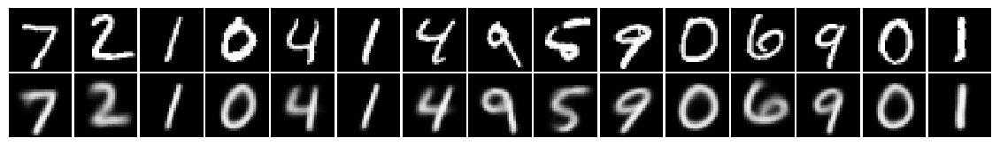

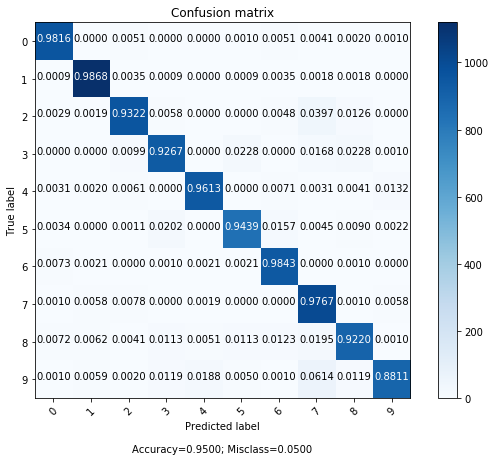

epoch 25 | iter 420 | Avg Loss: 129.54129 (±4.634) | Avg Cls Loss: 0.58638 (±0.331)
epoch 25 | iter 440 | Avg Loss: 130.04668 (±6.727) | Avg Cls Loss: 0.47388 (±0.293)
epoch 25 | iter 460 | Avg Loss: 130.18858 (±5.596) | Avg Cls Loss: 0.62512 (±0.407)
epoch 25 | iter 480 | Avg Loss: 131.74994 (±5.199) | Avg Cls Loss: 0.65384 (±0.410)
epoch 25 | iter 500 | Avg Loss: 128.34203 (±3.237) | Avg Cls Loss: 0.69835 (±0.461)
epoch 25 | iter 520 | Avg Loss: 131.33201 (±3.697) | Avg Cls Loss: 0.82663 (±0.382)
epoch 25 | iter 540 | Avg Loss: 130.00013 (±4.374) | Avg Cls Loss: 0.74193 (±0.387)
epoch 25 | iter 560 | Avg Loss: 128.60303 (±5.015) | Avg Cls Loss: 0.63159 (±0.410)
epoch 25 | iter 580 | Avg Loss: 130.12205 (±4.929) | Avg Cls Loss: 0.72368 (±0.347)
epoch 26 | iter 20 | Avg Loss: 128.00409 (±4.417) | Avg Cls Loss: 0.53697 (±0.297)
epoch 26 | iter 40 | Avg Loss: 129.79059 (±5.824) | Avg Cls Loss: 0.72380 (±0.482)
epoch 26 | iter 60 | Avg Loss: 129.39404 (±4.174) | Avg Cls Loss: 0.71486 (±0.

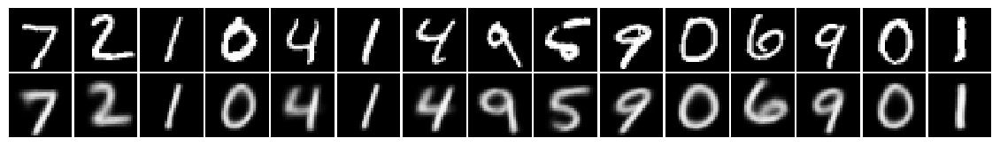

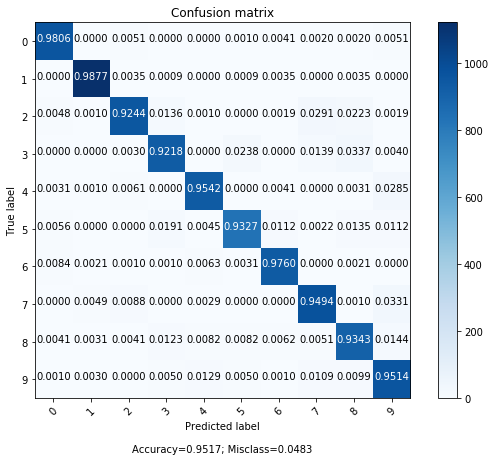

epoch 26 | iter 220 | Avg Loss: 131.04931 (±3.062) | Avg Cls Loss: 0.62797 (±0.309)
epoch 26 | iter 240 | Avg Loss: 129.70015 (±3.646) | Avg Cls Loss: 0.66006 (±0.447)
epoch 26 | iter 260 | Avg Loss: 128.79353 (±3.940) | Avg Cls Loss: 0.53751 (±0.388)
epoch 26 | iter 280 | Avg Loss: 129.70368 (±3.326) | Avg Cls Loss: 0.78511 (±0.589)
epoch 26 | iter 300 | Avg Loss: 130.00226 (±4.443) | Avg Cls Loss: 0.74780 (±0.431)
epoch 26 | iter 320 | Avg Loss: 130.55908 (±5.551) | Avg Cls Loss: 0.67110 (±0.404)
epoch 26 | iter 340 | Avg Loss: 130.58446 (±4.532) | Avg Cls Loss: 0.61980 (±0.512)
epoch 26 | iter 360 | Avg Loss: 137.77973 (±25.357) | Avg Cls Loss: 0.89038 (±0.411)
epoch 26 | iter 380 | Avg Loss: 144.41433 (±54.189) | Avg Cls Loss: 0.61380 (±0.548)
epoch 26 | iter 400 | Avg Loss: 133.84866 (±10.741) | Avg Cls Loss: 0.81846 (±0.494)


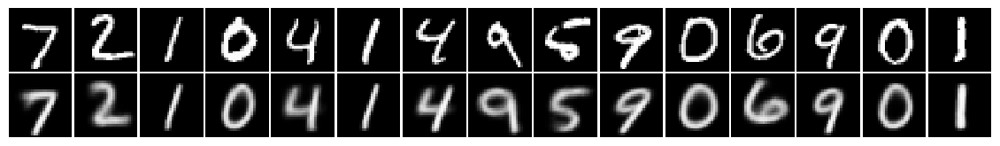

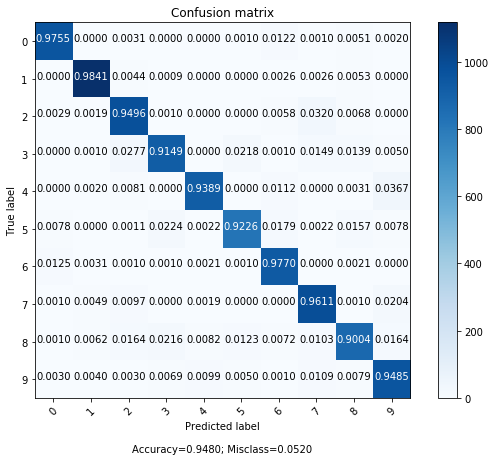

epoch 26 | iter 420 | Avg Loss: 129.39024 (±4.441) | Avg Cls Loss: 0.70862 (±0.369)
epoch 26 | iter 440 | Avg Loss: 131.66044 (±4.913) | Avg Cls Loss: 0.76429 (±0.443)
epoch 26 | iter 460 | Avg Loss: 130.09631 (±3.855) | Avg Cls Loss: 0.44216 (±0.252)
epoch 26 | iter 480 | Avg Loss: 130.69605 (±3.486) | Avg Cls Loss: 0.66486 (±0.397)
epoch 26 | iter 500 | Avg Loss: 130.22043 (±4.551) | Avg Cls Loss: 0.66619 (±0.482)
epoch 26 | iter 520 | Avg Loss: 128.79004 (±4.364) | Avg Cls Loss: 0.59712 (±0.425)
epoch 26 | iter 540 | Avg Loss: 131.19055 (±4.751) | Avg Cls Loss: 0.66478 (±0.485)
epoch 26 | iter 560 | Avg Loss: 128.90314 (±3.388) | Avg Cls Loss: 0.56742 (±0.473)
epoch 26 | iter 580 | Avg Loss: 129.82925 (±3.592) | Avg Cls Loss: 0.60769 (±0.374)
epoch 27 | iter 20 | Avg Loss: 129.54984 (±3.924) | Avg Cls Loss: 0.71270 (±0.468)
epoch 27 | iter 40 | Avg Loss: 128.07194 (±5.009) | Avg Cls Loss: 0.88918 (±0.613)
epoch 27 | iter 60 | Avg Loss: 129.75227 (±5.219) | Avg Cls Loss: 0.70363 (±0.

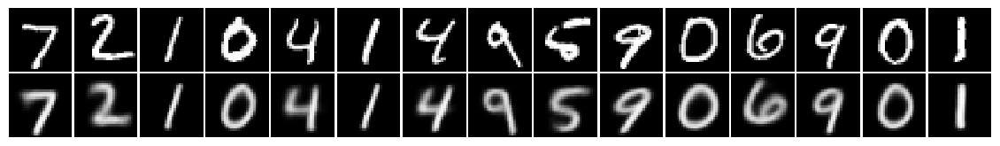

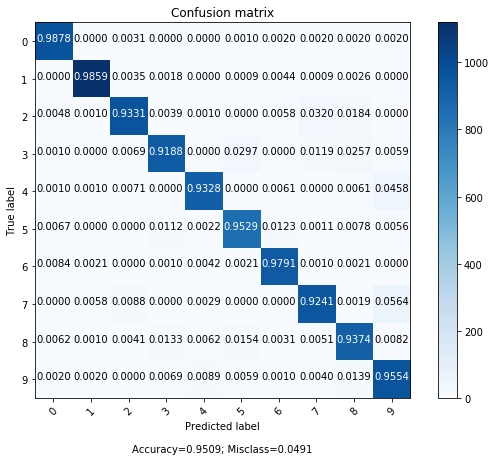

epoch 27 | iter 220 | Avg Loss: 128.19576 (±3.430) | Avg Cls Loss: 0.62255 (±0.412)
epoch 27 | iter 240 | Avg Loss: 131.98919 (±3.985) | Avg Cls Loss: 0.57757 (±0.332)
epoch 27 | iter 260 | Avg Loss: 130.51449 (±6.114) | Avg Cls Loss: 0.68412 (±0.411)
epoch 27 | iter 280 | Avg Loss: 129.03804 (±3.692) | Avg Cls Loss: 0.75657 (±0.728)
epoch 27 | iter 300 | Avg Loss: 127.87803 (±4.329) | Avg Cls Loss: 0.76618 (±0.420)
epoch 27 | iter 320 | Avg Loss: 130.50418 (±4.233) | Avg Cls Loss: 0.68168 (±0.364)
epoch 27 | iter 340 | Avg Loss: 127.90239 (±3.451) | Avg Cls Loss: 0.61223 (±0.378)
epoch 27 | iter 360 | Avg Loss: 129.63105 (±4.455) | Avg Cls Loss: 0.64736 (±0.360)
epoch 27 | iter 380 | Avg Loss: 129.49203 (±5.043) | Avg Cls Loss: 0.55039 (±0.318)
epoch 27 | iter 400 | Avg Loss: 131.34706 (±9.463) | Avg Cls Loss: 0.71085 (±0.457)


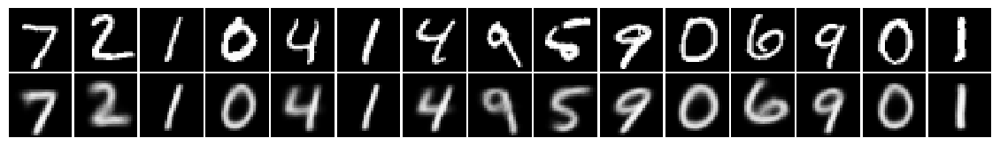

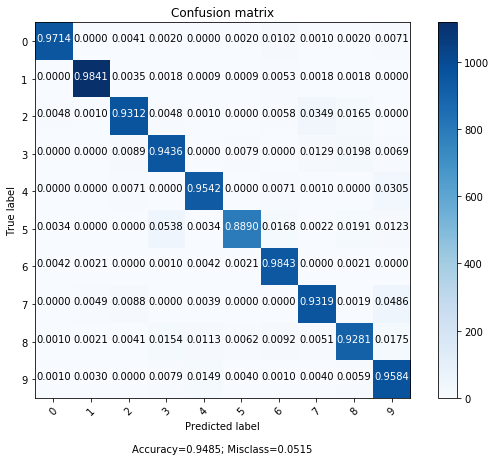

epoch 27 | iter 420 | Avg Loss: 130.02081 (±4.939) | Avg Cls Loss: 0.82825 (±0.426)
epoch 27 | iter 440 | Avg Loss: 129.68815 (±5.376) | Avg Cls Loss: 0.60624 (±0.389)
epoch 27 | iter 460 | Avg Loss: 130.79840 (±5.096) | Avg Cls Loss: 0.70242 (±0.387)
epoch 27 | iter 480 | Avg Loss: 132.63885 (±7.798) | Avg Cls Loss: 0.86346 (±0.587)
epoch 27 | iter 500 | Avg Loss: 131.69226 (±3.837) | Avg Cls Loss: 0.88471 (±0.566)
epoch 27 | iter 520 | Avg Loss: 130.60243 (±3.559) | Avg Cls Loss: 0.80424 (±0.478)
epoch 27 | iter 540 | Avg Loss: 130.78123 (±3.982) | Avg Cls Loss: 0.77275 (±0.655)
epoch 27 | iter 560 | Avg Loss: 130.33420 (±4.516) | Avg Cls Loss: 0.78302 (±0.519)
epoch 27 | iter 580 | Avg Loss: 132.74333 (±8.275) | Avg Cls Loss: 0.89021 (±0.632)
epoch 28 | iter 20 | Avg Loss: 131.45786 (±5.261) | Avg Cls Loss: 0.91859 (±0.559)
epoch 28 | iter 40 | Avg Loss: 132.45756 (±7.781) | Avg Cls Loss: 0.73262 (±0.457)
epoch 28 | iter 60 | Avg Loss: 130.45300 (±7.010) | Avg Cls Loss: 0.90808 (±0.

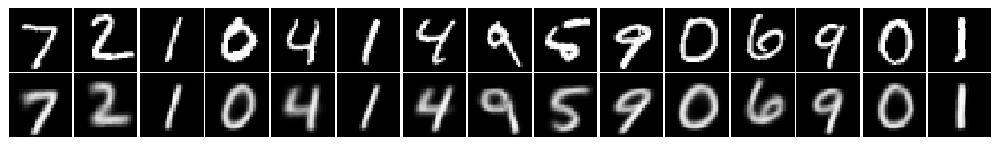

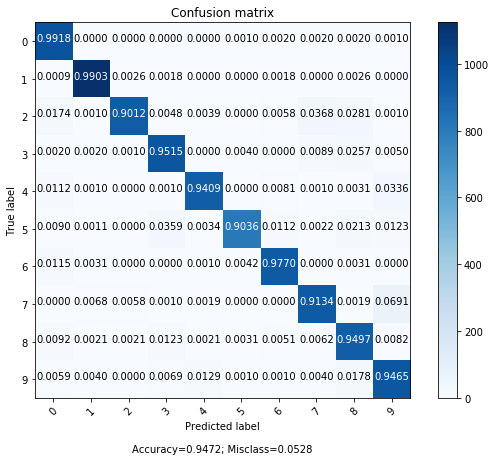

epoch 28 | iter 220 | Avg Loss: 130.70108 (±7.950) | Avg Cls Loss: 0.84583 (±0.368)
epoch 28 | iter 240 | Avg Loss: 132.96911 (±15.692) | Avg Cls Loss: 0.64951 (±0.519)
epoch 28 | iter 260 | Avg Loss: 139.71110 (±37.115) | Avg Cls Loss: 1.04217 (±0.554)
epoch 28 | iter 280 | Avg Loss: 138.33051 (±32.091) | Avg Cls Loss: 1.17834 (±0.698)
epoch 28 | iter 300 | Avg Loss: 130.84914 (±7.501) | Avg Cls Loss: 0.69240 (±0.369)
epoch 28 | iter 320 | Avg Loss: 129.84915 (±4.304) | Avg Cls Loss: 0.54522 (±0.366)
epoch 28 | iter 340 | Avg Loss: 131.06701 (±9.068) | Avg Cls Loss: 0.53570 (±0.376)
epoch 28 | iter 360 | Avg Loss: 129.93878 (±3.959) | Avg Cls Loss: 0.63503 (±0.430)
epoch 28 | iter 380 | Avg Loss: 128.68561 (±4.245) | Avg Cls Loss: 0.55528 (±0.340)
epoch 28 | iter 400 | Avg Loss: 131.13272 (±3.136) | Avg Cls Loss: 0.69707 (±0.437)


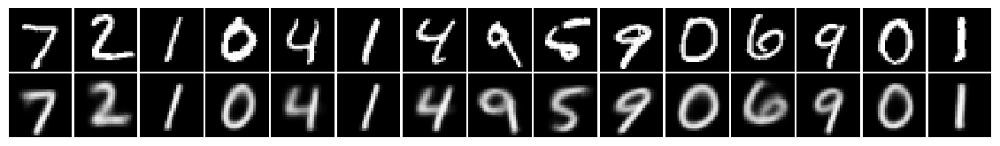

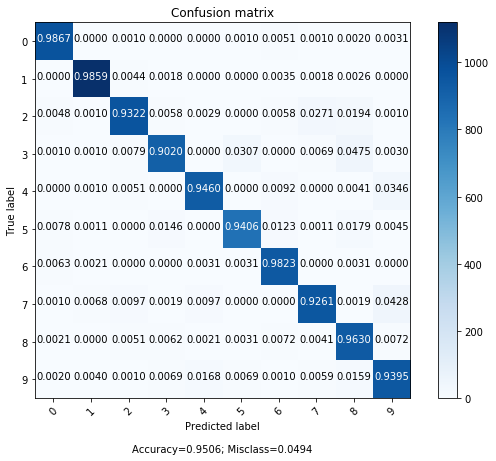

epoch 28 | iter 420 | Avg Loss: 129.94318 (±6.447) | Avg Cls Loss: 0.80554 (±0.552)
epoch 28 | iter 440 | Avg Loss: 129.56937 (±3.825) | Avg Cls Loss: 0.68430 (±0.378)
epoch 28 | iter 460 | Avg Loss: 129.47205 (±4.750) | Avg Cls Loss: 0.55063 (±0.358)
epoch 28 | iter 480 | Avg Loss: 129.05983 (±4.441) | Avg Cls Loss: 0.49012 (±0.308)
epoch 28 | iter 500 | Avg Loss: 129.55314 (±4.026) | Avg Cls Loss: 0.46667 (±0.242)
epoch 28 | iter 520 | Avg Loss: 129.77910 (±4.167) | Avg Cls Loss: 0.61290 (±0.328)
epoch 28 | iter 540 | Avg Loss: 132.07637 (±6.566) | Avg Cls Loss: 0.52813 (±0.291)
epoch 28 | iter 560 | Avg Loss: 131.21450 (±6.255) | Avg Cls Loss: 0.75351 (±0.552)
epoch 28 | iter 580 | Avg Loss: 132.57329 (±5.228) | Avg Cls Loss: 0.60096 (±0.299)
epoch 29 | iter 20 | Avg Loss: 130.66695 (±4.776) | Avg Cls Loss: 0.66728 (±0.472)
epoch 29 | iter 40 | Avg Loss: 131.97583 (±6.916) | Avg Cls Loss: 0.69382 (±0.453)
epoch 29 | iter 60 | Avg Loss: 133.78763 (±14.462) | Avg Cls Loss: 0.70793 (±0

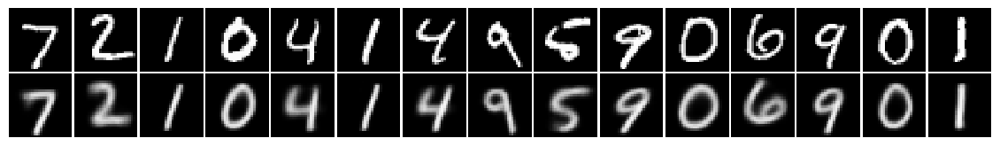

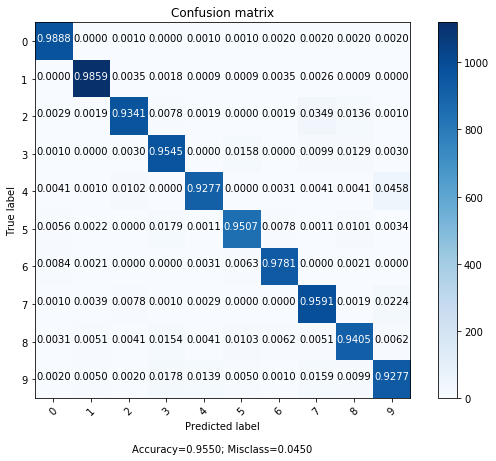

epoch 29 | iter 220 | Avg Loss: 131.31944 (±3.305) | Avg Cls Loss: 0.44644 (±0.248)
epoch 29 | iter 240 | Avg Loss: 129.01485 (±4.077) | Avg Cls Loss: 0.66992 (±0.447)
epoch 29 | iter 260 | Avg Loss: 128.14367 (±3.530) | Avg Cls Loss: 0.47212 (±0.327)
epoch 29 | iter 280 | Avg Loss: 130.77290 (±3.206) | Avg Cls Loss: 0.59494 (±0.349)
epoch 29 | iter 300 | Avg Loss: 131.14316 (±3.629) | Avg Cls Loss: 0.55565 (±0.354)
epoch 29 | iter 320 | Avg Loss: 128.39844 (±5.182) | Avg Cls Loss: 0.67200 (±0.477)
epoch 29 | iter 340 | Avg Loss: 127.82906 (±3.450) | Avg Cls Loss: 0.60184 (±0.432)
epoch 29 | iter 360 | Avg Loss: 130.74912 (±5.004) | Avg Cls Loss: 0.75245 (±0.394)
epoch 29 | iter 380 | Avg Loss: 127.55446 (±4.683) | Avg Cls Loss: 0.39051 (±0.340)
epoch 29 | iter 400 | Avg Loss: 130.54001 (±2.722) | Avg Cls Loss: 0.47495 (±0.271)


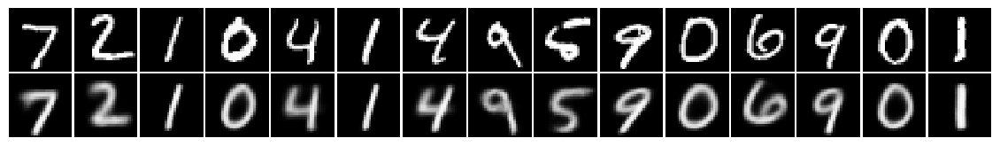

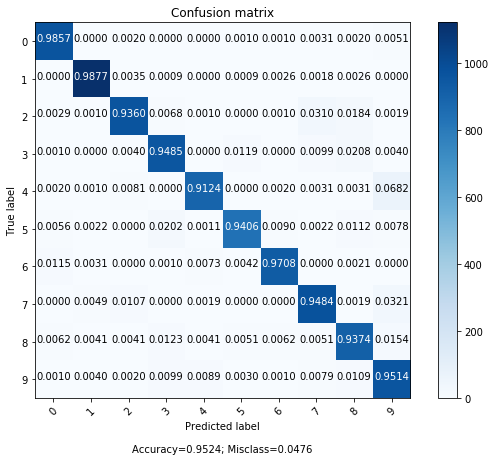

epoch 29 | iter 420 | Avg Loss: 130.13440 (±5.209) | Avg Cls Loss: 0.50443 (±0.322)
epoch 29 | iter 440 | Avg Loss: 130.05064 (±4.309) | Avg Cls Loss: 0.57889 (±0.435)
epoch 29 | iter 460 | Avg Loss: 129.82672 (±4.536) | Avg Cls Loss: 0.75759 (±0.519)
epoch 29 | iter 480 | Avg Loss: 129.17878 (±4.908) | Avg Cls Loss: 0.48016 (±0.362)
epoch 29 | iter 500 | Avg Loss: 128.95386 (±4.346) | Avg Cls Loss: 0.49537 (±0.449)
epoch 29 | iter 520 | Avg Loss: 128.46027 (±4.056) | Avg Cls Loss: 0.68638 (±0.428)
epoch 29 | iter 540 | Avg Loss: 131.33486 (±3.933) | Avg Cls Loss: 0.53913 (±0.368)
epoch 29 | iter 560 | Avg Loss: 128.19559 (±3.374) | Avg Cls Loss: 0.48764 (±0.398)
epoch 29 | iter 580 | Avg Loss: 129.36960 (±3.730) | Avg Cls Loss: 0.71505 (±0.409)
epoch 30 | iter 20 | Avg Loss: 128.54871 (±3.074) | Avg Cls Loss: 0.66528 (±0.348)
epoch 30 | iter 40 | Avg Loss: 130.21636 (±3.500) | Avg Cls Loss: 0.72699 (±0.406)
epoch 30 | iter 60 | Avg Loss: 129.88016 (±4.378) | Avg Cls Loss: 0.67754 (±0.

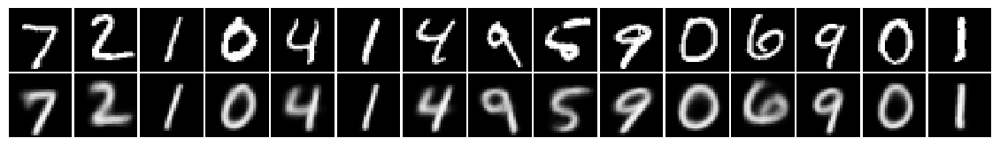

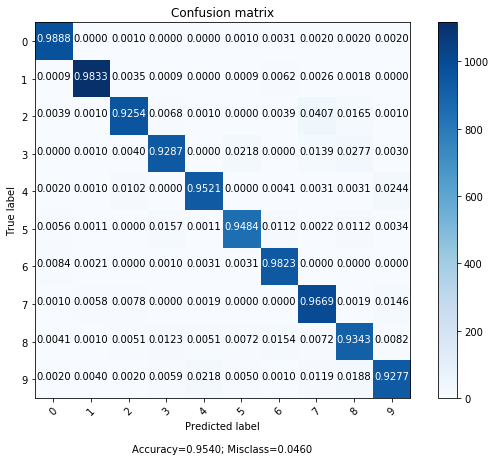

epoch 30 | iter 220 | Avg Loss: 130.44703 (±4.846) | Avg Cls Loss: 0.55534 (±0.402)
epoch 30 | iter 240 | Avg Loss: 129.43546 (±5.260) | Avg Cls Loss: 0.57059 (±0.323)
epoch 30 | iter 260 | Avg Loss: 127.23628 (±3.481) | Avg Cls Loss: 0.48876 (±0.329)
epoch 30 | iter 280 | Avg Loss: 130.68110 (±4.755) | Avg Cls Loss: 0.60127 (±0.574)
epoch 30 | iter 300 | Avg Loss: 128.39519 (±5.213) | Avg Cls Loss: 0.49626 (±0.311)
epoch 30 | iter 320 | Avg Loss: 130.35248 (±4.165) | Avg Cls Loss: 0.55770 (±0.334)
epoch 30 | iter 340 | Avg Loss: 128.04964 (±3.764) | Avg Cls Loss: 0.55984 (±0.445)
epoch 30 | iter 360 | Avg Loss: 129.53613 (±4.689) | Avg Cls Loss: 0.73652 (±0.563)
epoch 30 | iter 380 | Avg Loss: 129.69721 (±5.271) | Avg Cls Loss: 0.71538 (±0.487)
epoch 30 | iter 400 | Avg Loss: 127.80881 (±3.863) | Avg Cls Loss: 0.62074 (±0.407)


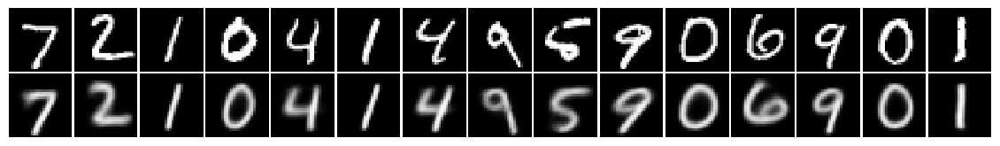

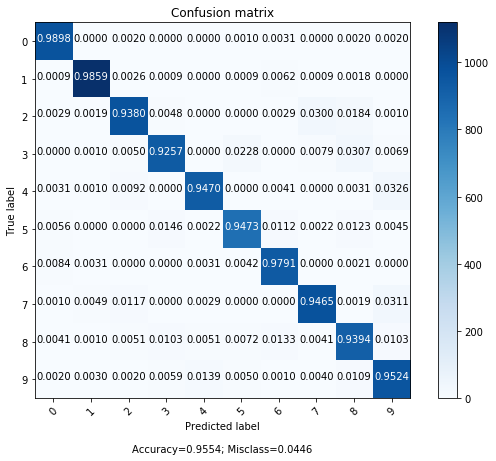

epoch 30 | iter 420 | Avg Loss: 128.34257 (±5.201) | Avg Cls Loss: 0.73643 (±0.463)
epoch 30 | iter 440 | Avg Loss: 127.78683 (±4.529) | Avg Cls Loss: 0.71035 (±0.505)
epoch 30 | iter 460 | Avg Loss: 128.38361 (±3.536) | Avg Cls Loss: 0.59455 (±0.442)
epoch 30 | iter 480 | Avg Loss: 128.85319 (±4.379) | Avg Cls Loss: 0.67878 (±0.428)
epoch 30 | iter 500 | Avg Loss: 128.39094 (±4.965) | Avg Cls Loss: 0.66770 (±0.364)
epoch 30 | iter 520 | Avg Loss: 129.83081 (±4.432) | Avg Cls Loss: 0.61116 (±0.397)
epoch 30 | iter 540 | Avg Loss: 128.10237 (±3.812) | Avg Cls Loss: 0.62323 (±0.419)
epoch 30 | iter 560 | Avg Loss: 131.02706 (±4.761) | Avg Cls Loss: 0.73371 (±0.514)
epoch 30 | iter 580 | Avg Loss: 128.91584 (±4.565) | Avg Cls Loss: 0.82083 (±0.616)


In [51]:
loss_logger = MetricLogger("Loss")
cls_loss_logger = MetricLogger("Cls Loss")
acc_logger = MetricLogger('Accuracy')

train_vae(train_dl, train_dl_u, valid_dl, vae, 30, loss_logger, cls_loss_logger, acc_logger, semi_sup_epochs=100000)

** Plotting Metrics **

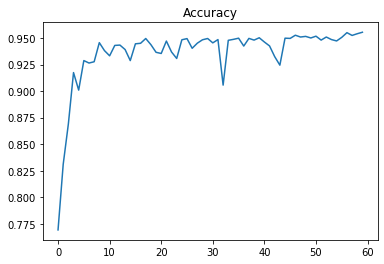

In [52]:
acc_logger.plot()

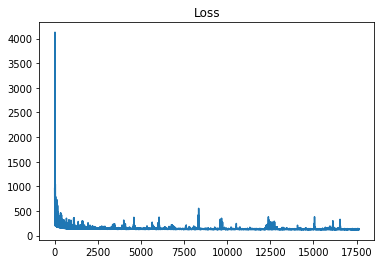

In [53]:
loss_logger.plot()

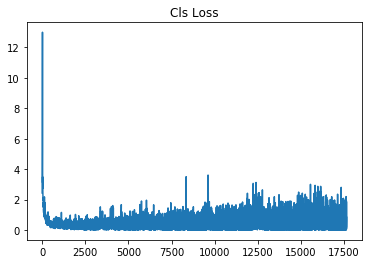

In [54]:
cls_loss_logger.plot()

### Visualizing Results

#### VIsualize 2D Latent Space (centers of Gaussian)

In [55]:
def get_df_for_viz(vae: nn.Module):

    vae.cuda()
    z, z_vars, labels = [], [], []
    
    with torch.no_grad():
        for i, (x, y) in enumerate(valid_dl):
            mu, logvar = vae.encode(x.cuda(), y.cuda())
            mu = mu.cpu()
            var = logvar.exp().cpu()
            z.append(mu)
            labels.append(y)
            z_vars.append(var[:,0] + var[:,1])
            
    z = torch.cat(z, dim=0)
    labels = torch.cat(labels, dim=0)
    z_vars = torch.cat(z_vars, dim=0)

    df = pd.DataFrame({'x': z[:,0].numpy(), 
                       'y': z[:,1].numpy(),
                       'tot_var': z_vars.numpy(),
                       'label': labels.numpy()})

    return df

df = get_df_for_viz(vae)

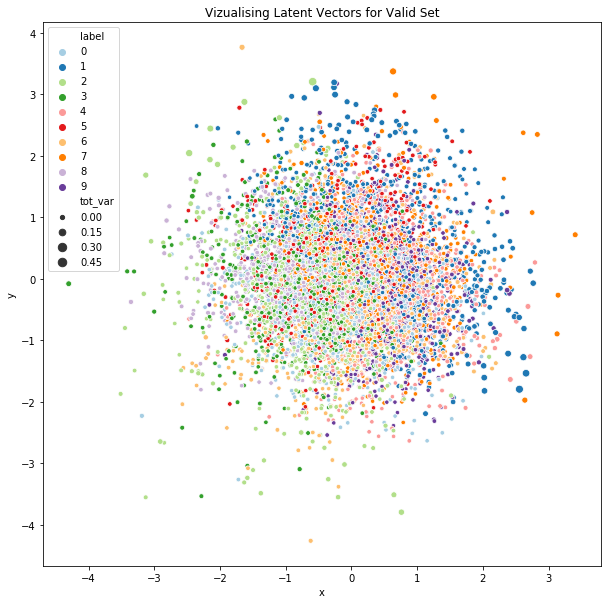

In [56]:
plt.figure(figsize=(10, 10))
sns.scatterplot(x="x", y="y", hue="label", size='tot_var', palette=sns.color_palette("Paired", 10), data=df)
plt.title('Vizualising Latent Vectors for Valid Set');

#### Show Continuity of Latent Space

In [57]:
def draw_mnist_manifold_vae(model: nn.Module, label: int, size: int = 20):
    """This function takes a trained VAE with z_dim=2 and visualizes its latent space."""

    # generate a 2D point cloud of latent space using inverse CDF of Standard Gaussian.
    x_axes = ndist.ppf(np.linspace(0.01, 0.99, size))
    y_axes = ndist.ppf(np.linspace(0.01, 0.99, size))

    # preparing input to decoder.
    z = []
    for i, y in enumerate(x_axes):
        for j, x in enumerate(y_axes):
            z.append(torch.Tensor([x, y]))
    z = torch.stack(z)
    
    # decoding latent vectors
    preds = model.decode(z, torch.empty(z.shape[0], device=z.device).fill_(label)).detach().sigmoid()
    
    # rendering a single image from predictions.
    grid = make_grid(preds, pad_value=1, padding=1, nrow=size)[0].numpy()
    
    # showing the image.
    plt.figure(figsize=(10, 10))
    plt.imshow(grid, cmap='gray')
    plt.axis('off')
    plt.title('2D Latent Space')
    plt.show()

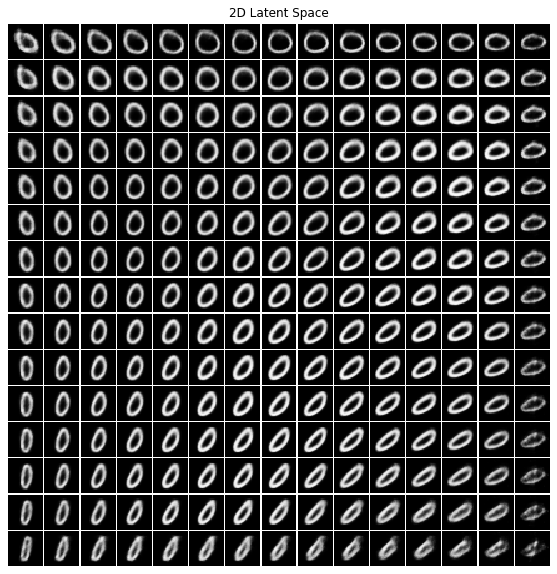

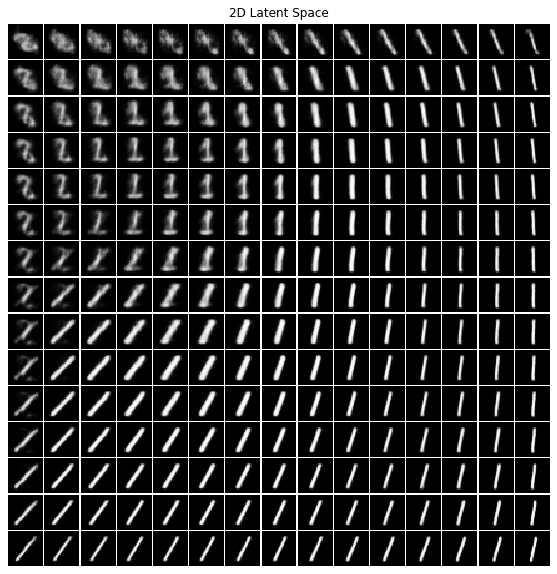

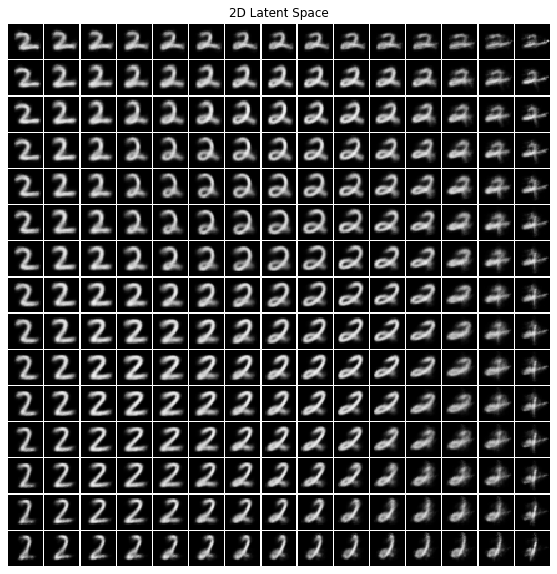

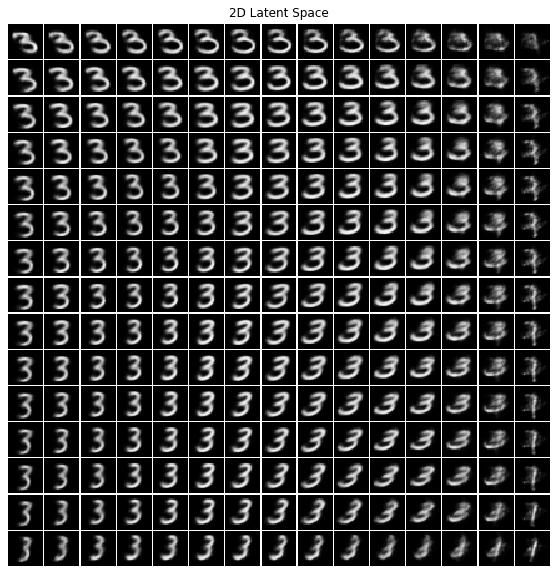

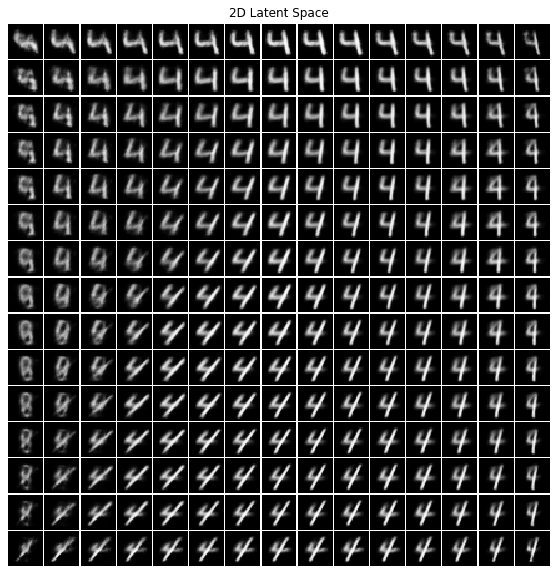

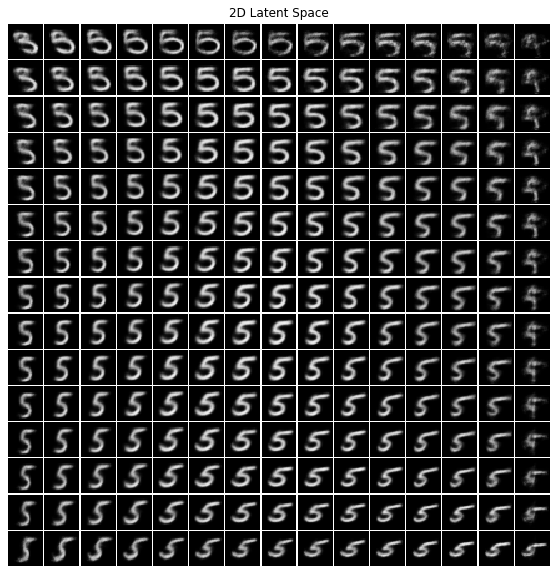

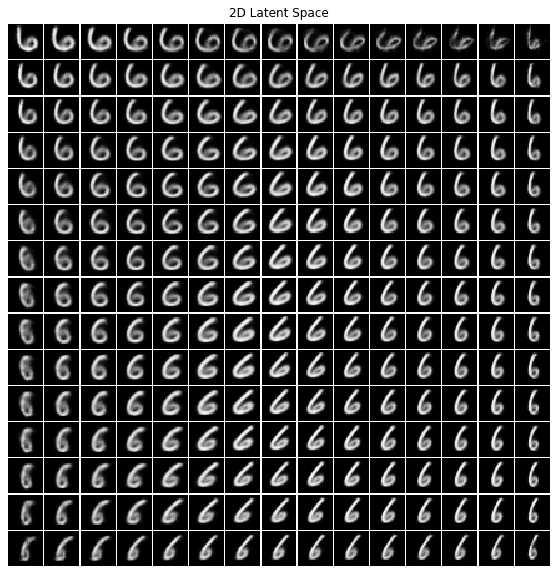

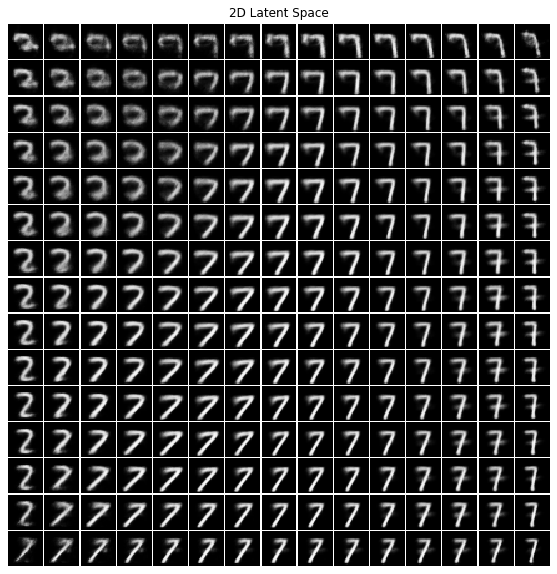

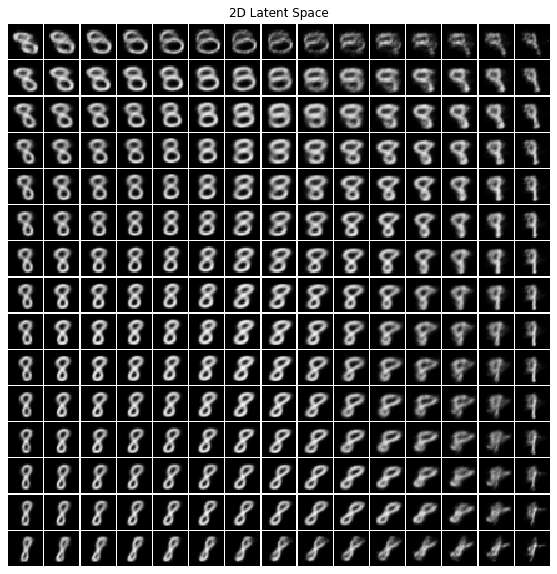

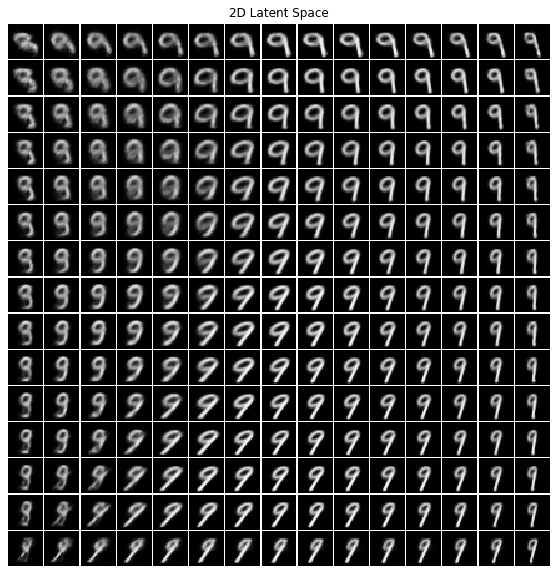

In [58]:
for label in range(10):
    draw_mnist_manifold_vae(vae.cpu(), label, size=15);

#### Generating Digits with Same Hadnwritting

Here we fix Z and vary Y to generate different digits with same style.

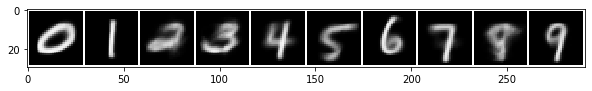

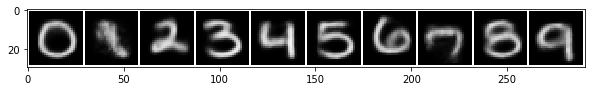

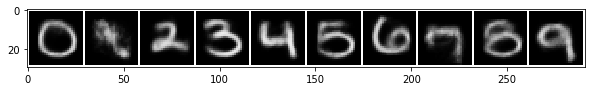

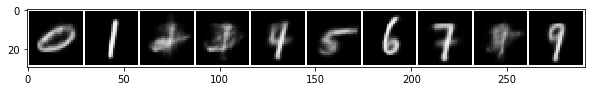

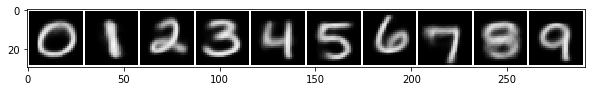

...

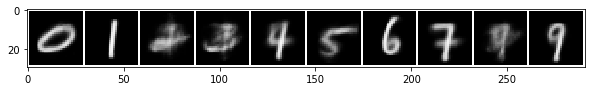

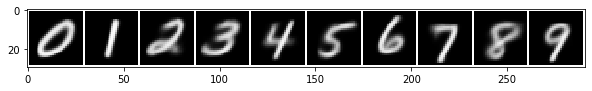

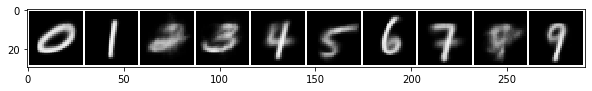

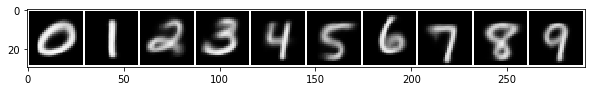

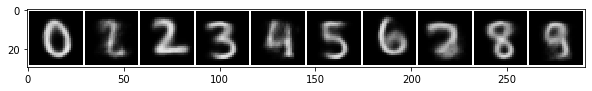

In [59]:
for i in range(20):
    z_ = torch.empty(2).normal_(0, 1).repeat(N_CLASSES, 1)

    y = torch.Tensor([i % N_CLASSES for i in range(N_CLASSES)])

    images = vae.decode(z_, y).sigmoid().detach()

    grid = make_grid(images, pad_value=1, padding=1, nrow=10)[0].detach().numpy()
    plt.figure(figsize=(10, 5))
    plt.imshow(grid, cmap='gray');

### Unsupervised Training

In this section I show that after the first epoch (warmup) we can switch to fully-unsupervised training and classifier will still improve its score by getting indirect supervision from generative process. In other words, learning classifier and generative model jointly isn't useless.

In [62]:
seed_everything()

vae = SSVAE(inp_shape=(1, 28, 28), hidden_dim=512, out_dim=256, z_dim=50, n_classes=10)

In [63]:
# I also log gradient norm at classifier's last layer to compare signal strength in labelled VS unlabelled batch scenarios.

grad_norm = MetricLogger('grad_norm')

def record_grad_norm(self, grad_input, grad_output):
    grad_norm.log(grad_input[0].norm())

vae.cls.layers[-1].register_backward_hook(record_grad_norm)


epoch 1 | iter 20 | Avg Loss: 584.49204 (±1018.986) | Avg Cls Loss: 7.67788 (±4.366)
epoch 1 | iter 40 | Avg Loss: 269.42179 (±208.098) | Avg Cls Loss: 4.73309 (±2.193)
epoch 1 | iter 60 | Avg Loss: 237.74220 (±148.561) | Avg Cls Loss: 2.15149 (±0.148)
epoch 1 | iter 80 | Avg Loss: 212.12066 (±110.953) | Avg Cls Loss: 1.64713 (±0.137)
epoch 1 | iter 100 | Avg Loss: 195.02502 (±86.538) | Avg Cls Loss: 1.26410 (±0.089)
epoch 1 | iter 120 | Avg Loss: 186.65161 (±84.807) | Avg Cls Loss: 1.03955 (±0.137)
epoch 1 | iter 140 | Avg Loss: 182.45965 (±93.759) | Avg Cls Loss: 0.98551 (±0.166)
epoch 1 | iter 160 | Avg Loss: 181.71074 (±97.853) | Avg Cls Loss: 1.10746 (±0.195)
epoch 1 | iter 180 | Avg Loss: 169.55468 (±73.371) | Avg Cls Loss: 0.85913 (±0.163)
epoch 1 | iter 200 | Avg Loss: 166.72533 (±71.295) | Avg Cls Loss: 0.80534 (±0.190)


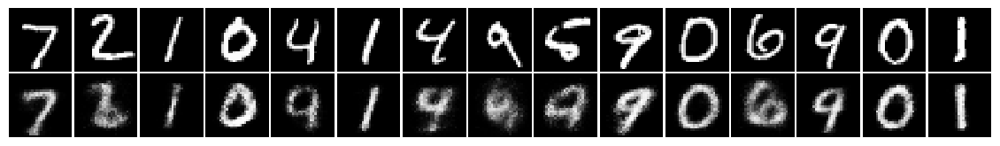

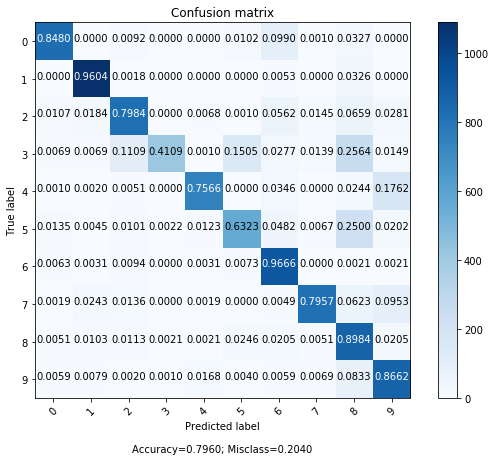

epoch 1 | iter 220 | Avg Loss: 161.99088 (±58.267) | Avg Cls Loss: 0.72653 (±0.097)
epoch 1 | iter 240 | Avg Loss: 156.54035 (±53.215) | Avg Cls Loss: 0.64923 (±0.113)
epoch 1 | iter 260 | Avg Loss: 151.04466 (±35.202) | Avg Cls Loss: 0.51657 (±0.087)
epoch 1 | iter 280 | Avg Loss: 147.53089 (±33.347) | Avg Cls Loss: 0.48471 (±0.091)
epoch 1 | iter 300 | Avg Loss: 145.24846 (±32.564) | Avg Cls Loss: 0.51801 (±0.144)
epoch 1 | iter 320 | Avg Loss: 149.01383 (±61.167) | Avg Cls Loss: 0.63116 (±0.172)
epoch 1 | iter 340 | Avg Loss: 152.04594 (±69.773) | Avg Cls Loss: 0.64403 (±0.183)
epoch 1 | iter 360 | Avg Loss: 142.60069 (±43.401) | Avg Cls Loss: 0.48766 (±0.087)
epoch 1 | iter 380 | Avg Loss: 154.09796 (±62.334) | Avg Cls Loss: 0.45895 (±0.111)
epoch 1 | iter 400 | Avg Loss: 144.33233 (±57.863) | Avg Cls Loss: 0.48136 (±0.128)


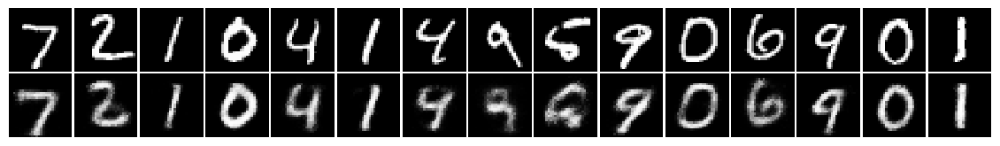

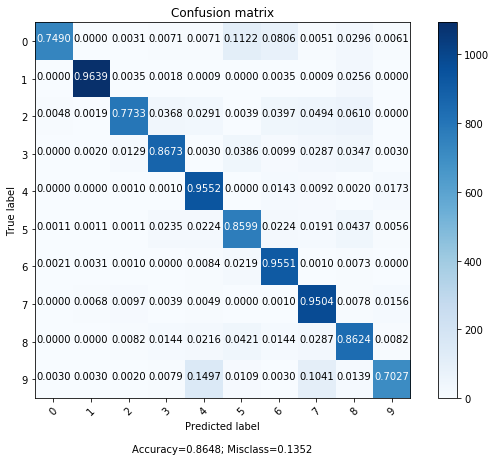

epoch 1 | iter 420 | Avg Loss: 139.79707 (±47.630) | Avg Cls Loss: 0.64362 (±0.191)
epoch 1 | iter 440 | Avg Loss: 141.91157 (±53.493) | Avg Cls Loss: 0.58929 (±0.127)
epoch 1 | iter 460 | Avg Loss: 137.76126 (±35.716) | Avg Cls Loss: 0.48592 (±0.078)
epoch 1 | iter 480 | Avg Loss: 133.37716 (±22.115) | Avg Cls Loss: 0.44484 (±0.097)
epoch 1 | iter 500 | Avg Loss: 132.59233 (±29.081) | Avg Cls Loss: 0.35513 (±0.089)
epoch 1 | iter 520 | Avg Loss: 128.94872 (±15.619) | Avg Cls Loss: 0.36083 (±0.116)
epoch 1 | iter 540 | Avg Loss: 132.01618 (±31.181) | Avg Cls Loss: 0.36548 (±0.103)
epoch 1 | iter 560 | Avg Loss: 129.33855 (±21.039) | Avg Cls Loss: 0.34482 (±0.064)
epoch 1 | iter 580 | Avg Loss: 129.34297 (±21.577) | Avg Cls Loss: 0.39382 (±0.089)
epoch 2 | iter 20 | Avg Loss: 123.35323 (±3.202) | Avg Cls Loss: 0.44427 (±0.125)
epoch 2 | iter 40 | Avg Loss: 123.10331 (±3.647) | Avg Cls Loss: 0.48342 (±0.122)
epoch 2 | iter 60 | Avg Loss: 122.15439 (±3.645) | Avg Cls Loss: 0.47002 (±0.122

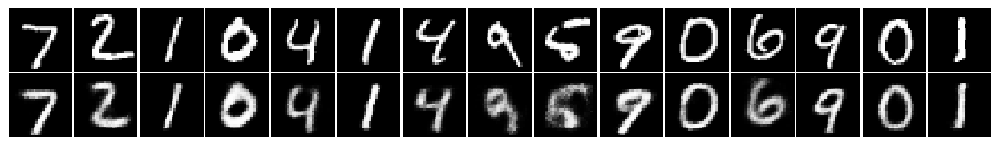

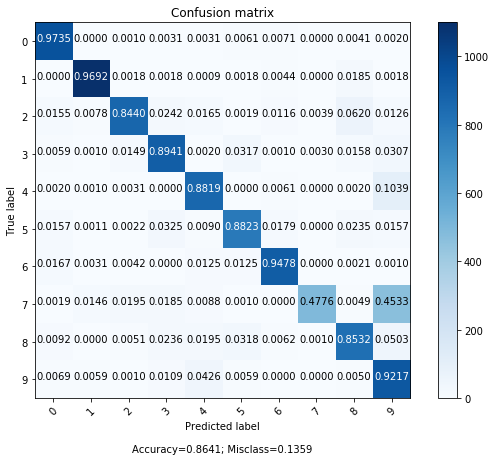

epoch 2 | iter 220 | Avg Loss: 119.83490 (±3.117) | Avg Cls Loss: 0.44259 (±0.112)
epoch 2 | iter 240 | Avg Loss: 119.46301 (±3.440) | Avg Cls Loss: 0.45069 (±0.097)
epoch 2 | iter 260 | Avg Loss: 118.65475 (±2.981) | Avg Cls Loss: 0.39595 (±0.105)
epoch 2 | iter 280 | Avg Loss: 120.58461 (±3.330) | Avg Cls Loss: 0.47484 (±0.121)
epoch 2 | iter 300 | Avg Loss: 119.09013 (±3.789) | Avg Cls Loss: 0.41144 (±0.087)
epoch 2 | iter 320 | Avg Loss: 117.20499 (±2.901) | Avg Cls Loss: 0.37520 (±0.101)
epoch 2 | iter 340 | Avg Loss: 117.99712 (±3.165) | Avg Cls Loss: 0.41831 (±0.079)
epoch 2 | iter 360 | Avg Loss: 118.16984 (±3.393) | Avg Cls Loss: 0.39710 (±0.084)
epoch 2 | iter 400 | Avg Loss: 116.29251 (±3.384) | Avg Cls Loss: 0.44599 (±0.109)


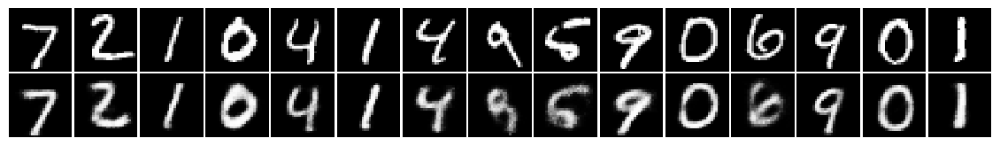

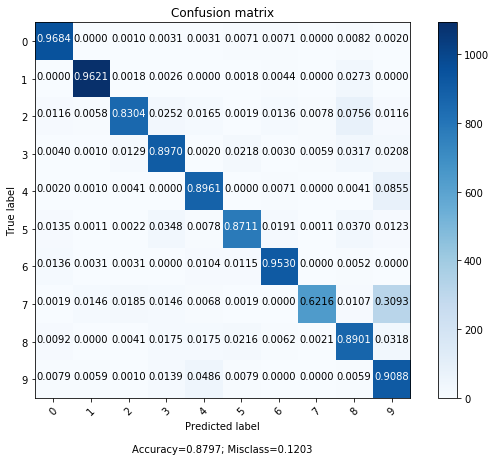

epoch 2 | iter 420 | Avg Loss: 116.89026 (±2.314) | Avg Cls Loss: 0.46772 (±0.131)
epoch 2 | iter 440 | Avg Loss: 115.84968 (±3.409) | Avg Cls Loss: 0.42875 (±0.151)
epoch 2 | iter 460 | Avg Loss: 116.01461 (±2.021) | Avg Cls Loss: 0.37096 (±0.096)
epoch 2 | iter 480 | Avg Loss: 117.33121 (±3.776) | Avg Cls Loss: 0.41816 (±0.150)
epoch 2 | iter 500 | Avg Loss: 117.16704 (±2.888) | Avg Cls Loss: 0.41099 (±0.104)
epoch 2 | iter 520 | Avg Loss: 115.61400 (±3.287) | Avg Cls Loss: 0.35656 (±0.122)
epoch 2 | iter 540 | Avg Loss: 115.29711 (±2.950) | Avg Cls Loss: 0.37777 (±0.102)
epoch 2 | iter 560 | Avg Loss: 114.90967 (±3.065) | Avg Cls Loss: 0.41929 (±0.079)
epoch 2 | iter 580 | Avg Loss: 114.86194 (±2.597) | Avg Cls Loss: 0.36868 (±0.129)
epoch 3 | iter 20 | Avg Loss: 113.51980 (±3.141) | Avg Cls Loss: 0.38540 (±0.119)
epoch 3 | iter 40 | Avg Loss: 115.02472 (±3.362) | Avg Cls Loss: 0.42312 (±0.092)
epoch 3 | iter 60 | Avg Loss: 115.05222 (±3.581) | Avg Cls Loss: 0.38826 (±0.116)
epoch 3

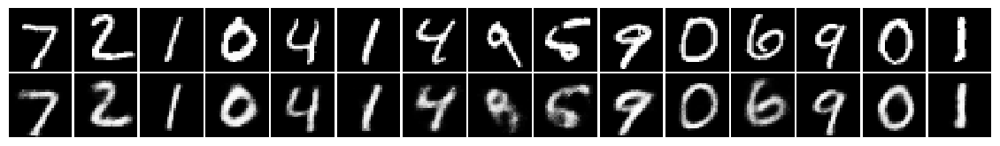

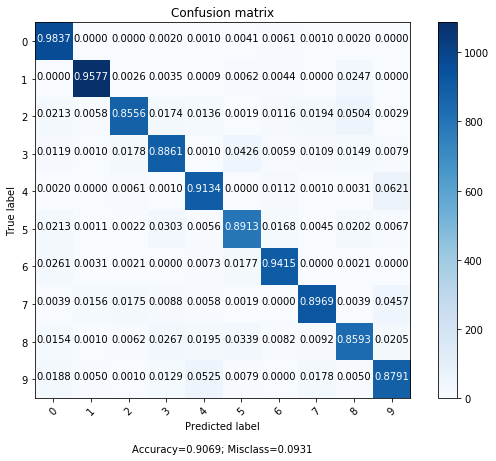

epoch 3 | iter 220 | Avg Loss: 113.73126 (±2.705) | Avg Cls Loss: 0.37074 (±0.118)
epoch 3 | iter 240 | Avg Loss: 113.86808 (±3.856) | Avg Cls Loss: 0.38444 (±0.126)
epoch 3 | iter 260 | Avg Loss: 113.15188 (±2.509) | Avg Cls Loss: 0.40764 (±0.103)
epoch 3 | iter 280 | Avg Loss: 114.09663 (±2.541) | Avg Cls Loss: 0.35849 (±0.120)
epoch 3 | iter 300 | Avg Loss: 112.21894 (±2.957) | Avg Cls Loss: 0.36997 (±0.105)
epoch 3 | iter 320 | Avg Loss: 112.50180 (±2.072) | Avg Cls Loss: 0.45128 (±0.118)
epoch 3 | iter 340 | Avg Loss: 114.05905 (±3.311) | Avg Cls Loss: 0.34366 (±0.114)
epoch 3 | iter 360 | Avg Loss: 112.64100 (±2.530) | Avg Cls Loss: 0.44625 (±0.208)
epoch 3 | iter 400 | Avg Loss: 112.31619 (±2.886) | Avg Cls Loss: 0.38977 (±0.149)


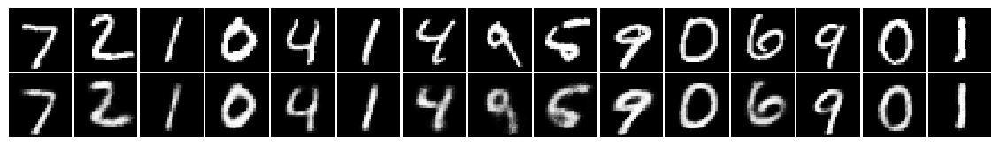

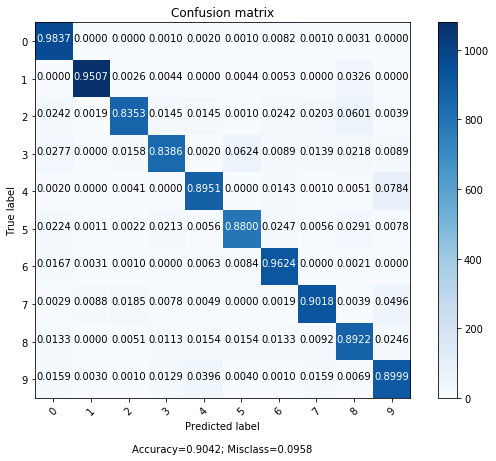

epoch 3 | iter 420 | Avg Loss: 111.84948 (±2.041) | Avg Cls Loss: 0.46039 (±0.142)
epoch 3 | iter 440 | Avg Loss: 112.76356 (±3.391) | Avg Cls Loss: 0.43934 (±0.218)
epoch 3 | iter 460 | Avg Loss: 112.59244 (±3.383) | Avg Cls Loss: 0.41605 (±0.148)
epoch 3 | iter 480 | Avg Loss: 113.07943 (±2.564) | Avg Cls Loss: 0.43485 (±0.192)
epoch 3 | iter 500 | Avg Loss: 110.96106 (±3.112) | Avg Cls Loss: 0.47128 (±0.136)
epoch 3 | iter 520 | Avg Loss: 112.54066 (±2.668) | Avg Cls Loss: 0.50819 (±0.156)
epoch 3 | iter 540 | Avg Loss: 111.65832 (±3.160) | Avg Cls Loss: 0.49018 (±0.193)
epoch 3 | iter 560 | Avg Loss: 111.57554 (±4.066) | Avg Cls Loss: 0.42994 (±0.153)
epoch 3 | iter 580 | Avg Loss: 111.63675 (±2.653) | Avg Cls Loss: 0.47006 (±0.127)
epoch 4 | iter 20 | Avg Loss: 111.60247 (±3.107) | Avg Cls Loss: 0.45719 (±0.166)
epoch 4 | iter 40 | Avg Loss: 111.42519 (±3.022) | Avg Cls Loss: 0.46463 (±0.200)
epoch 4 | iter 60 | Avg Loss: 109.87334 (±1.880) | Avg Cls Loss: 0.43375 (±0.176)
epoch 4

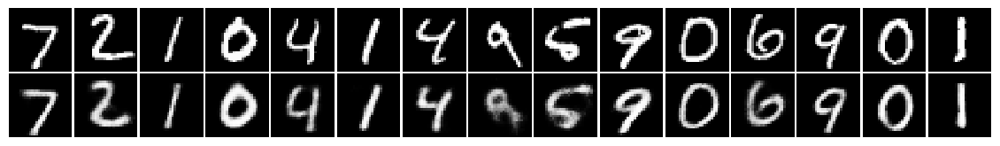

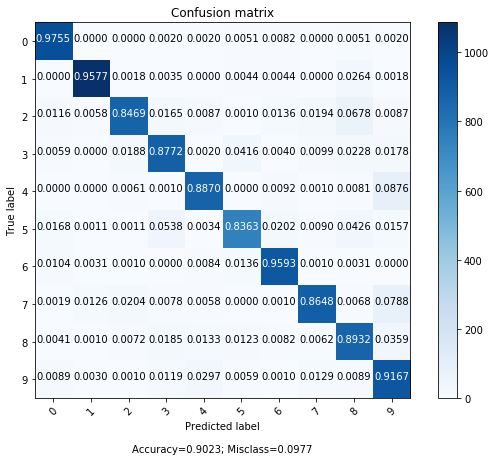

epoch 4 | iter 220 | Avg Loss: 110.64979 (±2.450) | Avg Cls Loss: 0.47314 (±0.190)
epoch 4 | iter 240 | Avg Loss: 110.80088 (±3.286) | Avg Cls Loss: 0.50162 (±0.157)
epoch 4 | iter 260 | Avg Loss: 109.45561 (±3.661) | Avg Cls Loss: 0.51595 (±0.123)
epoch 4 | iter 280 | Avg Loss: 109.12255 (±2.667) | Avg Cls Loss: 0.61426 (±0.234)
epoch 4 | iter 300 | Avg Loss: 109.05940 (±3.323) | Avg Cls Loss: 0.58732 (±0.203)
epoch 4 | iter 320 | Avg Loss: 110.28554 (±2.719) | Avg Cls Loss: 0.44862 (±0.192)
epoch 4 | iter 340 | Avg Loss: 110.57681 (±2.694) | Avg Cls Loss: 0.47027 (±0.149)
epoch 4 | iter 360 | Avg Loss: 109.42012 (±2.835) | Avg Cls Loss: 0.43806 (±0.155)
epoch 4 | iter 400 | Avg Loss: 109.74102 (±3.454) | Avg Cls Loss: 0.57776 (±0.231)


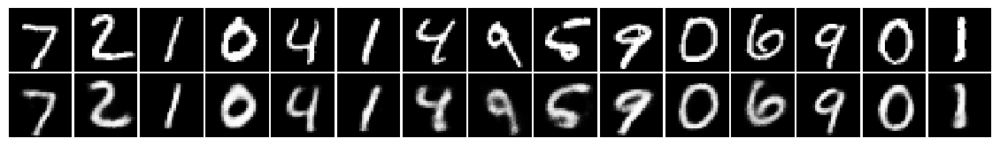

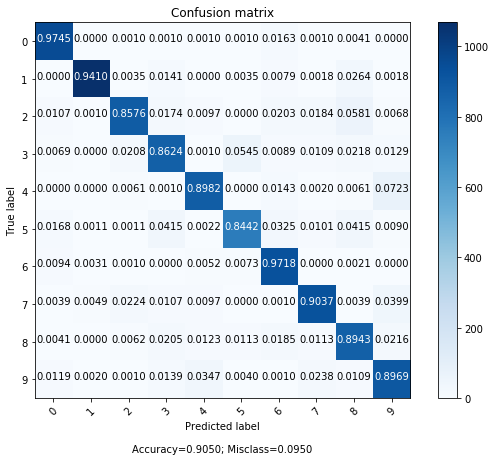

epoch 4 | iter 420 | Avg Loss: 109.60767 (±2.413) | Avg Cls Loss: 0.51054 (±0.214)
epoch 4 | iter 440 | Avg Loss: 110.08996 (±3.016) | Avg Cls Loss: 0.57431 (±0.148)
epoch 4 | iter 460 | Avg Loss: 109.07596 (±2.984) | Avg Cls Loss: 0.56217 (±0.153)
epoch 4 | iter 480 | Avg Loss: 110.27354 (±2.463) | Avg Cls Loss: 0.60077 (±0.212)
epoch 4 | iter 500 | Avg Loss: 110.21395 (±2.981) | Avg Cls Loss: 0.69763 (±0.225)
epoch 4 | iter 520 | Avg Loss: 108.88262 (±2.294) | Avg Cls Loss: 0.55321 (±0.164)
epoch 4 | iter 540 | Avg Loss: 110.41218 (±2.433) | Avg Cls Loss: 0.61835 (±0.261)
epoch 4 | iter 560 | Avg Loss: 109.90549 (±2.246) | Avg Cls Loss: 0.54885 (±0.173)
epoch 4 | iter 580 | Avg Loss: 109.18205 (±2.768) | Avg Cls Loss: 0.60321 (±0.249)
epoch 5 | iter 20 | Avg Loss: 108.27810 (±2.595) | Avg Cls Loss: 0.56020 (±0.207)
epoch 5 | iter 40 | Avg Loss: 109.95469 (±3.229) | Avg Cls Loss: 0.58754 (±0.151)
epoch 5 | iter 60 | Avg Loss: 108.03007 (±2.471) | Avg Cls Loss: 0.52377 (±0.200)
epoch 5

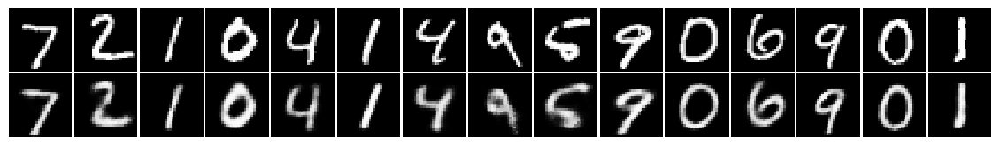

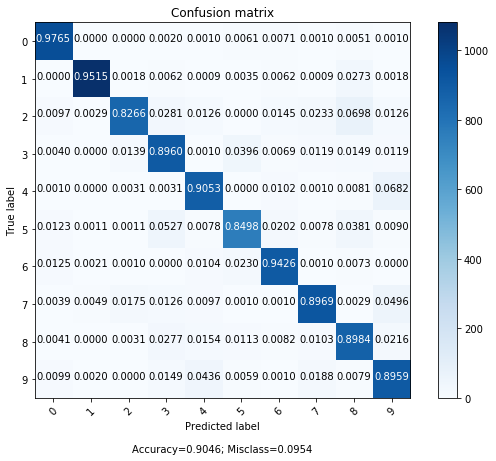

epoch 5 | iter 220 | Avg Loss: 109.09827 (±2.993) | Avg Cls Loss: 0.60058 (±0.237)
epoch 5 | iter 240 | Avg Loss: 108.34995 (±2.973) | Avg Cls Loss: 0.72845 (±0.286)
epoch 5 | iter 260 | Avg Loss: 107.91175 (±3.314) | Avg Cls Loss: 0.59089 (±0.238)
epoch 5 | iter 280 | Avg Loss: 108.45226 (±2.503) | Avg Cls Loss: 0.71963 (±0.238)
epoch 5 | iter 300 | Avg Loss: 108.18976 (±2.709) | Avg Cls Loss: 0.63870 (±0.294)
epoch 5 | iter 320 | Avg Loss: 108.03844 (±2.747) | Avg Cls Loss: 0.61585 (±0.226)
epoch 5 | iter 340 | Avg Loss: 107.77019 (±3.206) | Avg Cls Loss: 0.74256 (±0.244)
epoch 5 | iter 360 | Avg Loss: 107.62873 (±2.761) | Avg Cls Loss: 0.70384 (±0.291)
epoch 5 | iter 400 | Avg Loss: 107.93609 (±3.508) | Avg Cls Loss: 0.64354 (±0.224)


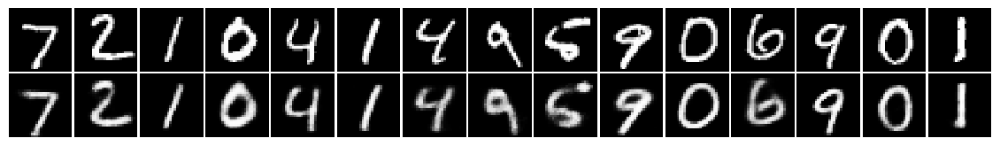

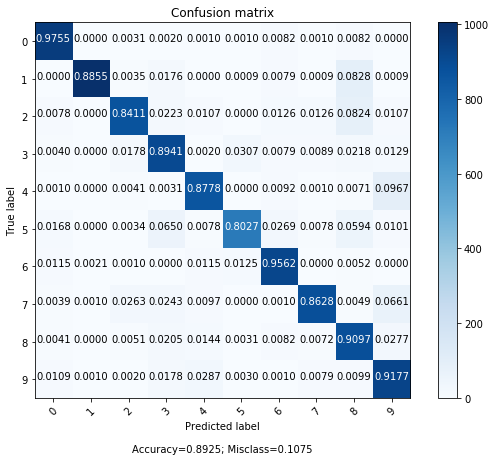

epoch 5 | iter 420 | Avg Loss: 107.81063 (±2.793) | Avg Cls Loss: 0.68023 (±0.221)
epoch 5 | iter 440 | Avg Loss: 107.81742 (±2.975) | Avg Cls Loss: 0.61666 (±0.284)
epoch 5 | iter 460 | Avg Loss: 109.13532 (±3.440) | Avg Cls Loss: 0.61153 (±0.210)
epoch 5 | iter 480 | Avg Loss: 107.00172 (±2.250) | Avg Cls Loss: 0.60751 (±0.217)
epoch 5 | iter 500 | Avg Loss: 107.65124 (±3.353) | Avg Cls Loss: 0.67400 (±0.271)
epoch 5 | iter 520 | Avg Loss: 108.55765 (±2.441) | Avg Cls Loss: 0.68538 (±0.205)
epoch 5 | iter 540 | Avg Loss: 107.10551 (±3.262) | Avg Cls Loss: 0.71779 (±0.196)
epoch 5 | iter 560 | Avg Loss: 106.74205 (±1.508) | Avg Cls Loss: 0.67455 (±0.343)
epoch 5 | iter 580 | Avg Loss: 108.10451 (±3.057) | Avg Cls Loss: 0.66996 (±0.193)
epoch 6 | iter 20 | Avg Loss: 107.80391 (±3.150) | Avg Cls Loss: 0.67147 (±0.259)
epoch 6 | iter 40 | Avg Loss: 105.92035 (±3.355) | Avg Cls Loss: 0.69609 (±0.214)
epoch 6 | iter 60 | Avg Loss: 107.43117 (±3.241) | Avg Cls Loss: 0.60333 (±0.215)
epoch 6

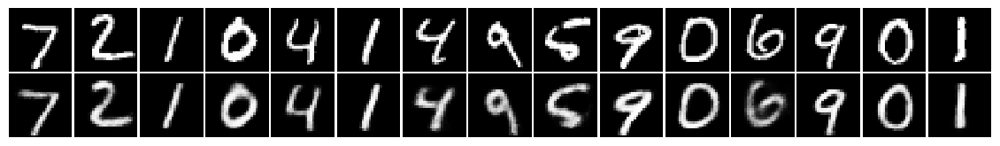

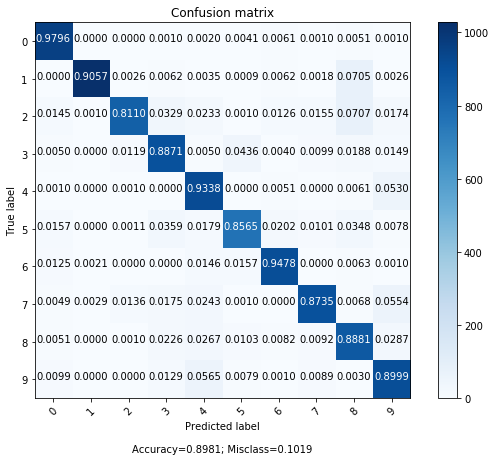

epoch 6 | iter 220 | Avg Loss: 108.47533 (±2.336) | Avg Cls Loss: 0.83339 (±0.326)
epoch 6 | iter 240 | Avg Loss: 108.60427 (±3.137) | Avg Cls Loss: 0.91907 (±0.290)
epoch 6 | iter 260 | Avg Loss: 105.33081 (±2.536) | Avg Cls Loss: 0.77212 (±0.313)
epoch 6 | iter 280 | Avg Loss: 106.77747 (±2.565) | Avg Cls Loss: 0.82507 (±0.285)
epoch 6 | iter 300 | Avg Loss: 106.19173 (±2.666) | Avg Cls Loss: 0.74022 (±0.298)
epoch 6 | iter 320 | Avg Loss: 106.97888 (±2.112) | Avg Cls Loss: 0.78102 (±0.298)
epoch 6 | iter 340 | Avg Loss: 106.30609 (±2.914) | Avg Cls Loss: 0.81602 (±0.276)
epoch 6 | iter 360 | Avg Loss: 106.41200 (±1.872) | Avg Cls Loss: 0.80625 (±0.337)
epoch 6 | iter 400 | Avg Loss: 106.83639 (±2.432) | Avg Cls Loss: 0.73464 (±0.259)


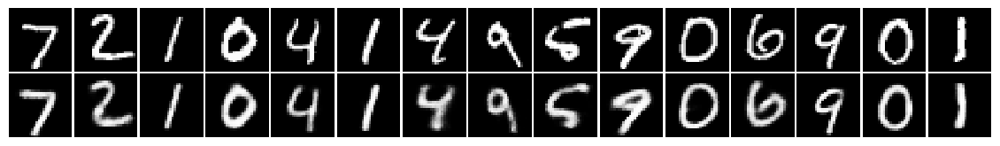

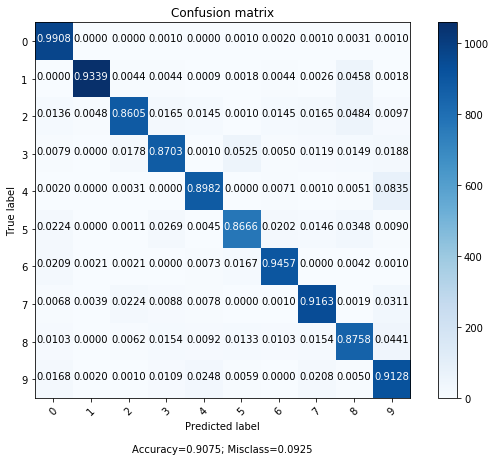

epoch 6 | iter 420 | Avg Loss: 106.98461 (±2.552) | Avg Cls Loss: 0.63311 (±0.208)
epoch 6 | iter 440 | Avg Loss: 106.85198 (±2.496) | Avg Cls Loss: 0.68750 (±0.293)
epoch 6 | iter 460 | Avg Loss: 105.36443 (±2.176) | Avg Cls Loss: 0.65103 (±0.259)
epoch 6 | iter 480 | Avg Loss: 107.26503 (±2.410) | Avg Cls Loss: 0.71746 (±0.340)
epoch 6 | iter 500 | Avg Loss: 106.94110 (±2.606) | Avg Cls Loss: 0.76652 (±0.294)
epoch 6 | iter 520 | Avg Loss: 105.94934 (±2.607) | Avg Cls Loss: 0.68703 (±0.218)
epoch 6 | iter 540 | Avg Loss: 106.75496 (±2.787) | Avg Cls Loss: 0.73768 (±0.187)
epoch 6 | iter 560 | Avg Loss: 106.68241 (±2.332) | Avg Cls Loss: 0.71647 (±0.269)
epoch 6 | iter 580 | Avg Loss: 106.98469 (±2.866) | Avg Cls Loss: 0.79560 (±0.290)
epoch 7 | iter 20 | Avg Loss: 105.42558 (±3.178) | Avg Cls Loss: 0.83000 (±0.280)
epoch 7 | iter 40 | Avg Loss: 107.14930 (±3.139) | Avg Cls Loss: 0.78773 (±0.524)
epoch 7 | iter 60 | Avg Loss: 106.74196 (±3.236) | Avg Cls Loss: 0.83441 (±0.265)
epoch 7

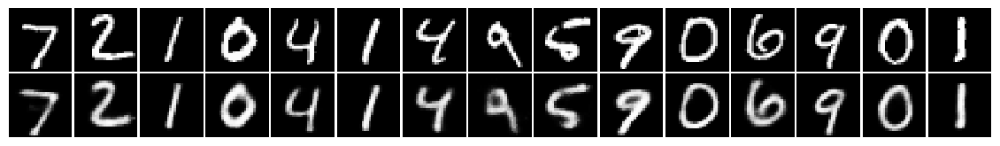

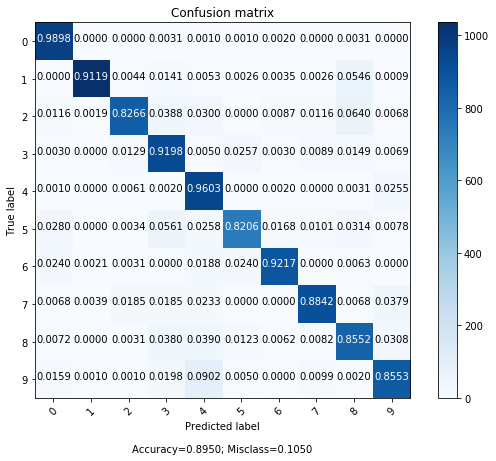

epoch 7 | iter 220 | Avg Loss: 105.55273 (±2.820) | Avg Cls Loss: 0.78442 (±0.329)
epoch 7 | iter 240 | Avg Loss: 105.94061 (±1.767) | Avg Cls Loss: 0.81360 (±0.330)
epoch 7 | iter 260 | Avg Loss: 105.39973 (±2.454) | Avg Cls Loss: 0.82353 (±0.322)
epoch 7 | iter 280 | Avg Loss: 106.97461 (±2.723) | Avg Cls Loss: 0.91410 (±0.347)
epoch 7 | iter 300 | Avg Loss: 105.80940 (±3.103) | Avg Cls Loss: 0.91503 (±0.307)
epoch 7 | iter 320 | Avg Loss: 106.07978 (±3.408) | Avg Cls Loss: 0.97679 (±0.445)
epoch 7 | iter 340 | Avg Loss: 104.70595 (±2.986) | Avg Cls Loss: 0.65025 (±0.237)
epoch 7 | iter 360 | Avg Loss: 105.63238 (±2.869) | Avg Cls Loss: 0.82363 (±0.380)
epoch 7 | iter 400 | Avg Loss: 105.30078 (±2.546) | Avg Cls Loss: 0.81085 (±0.281)


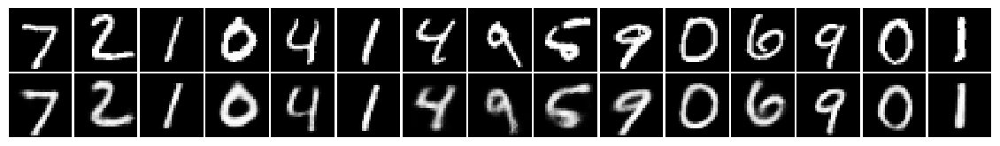

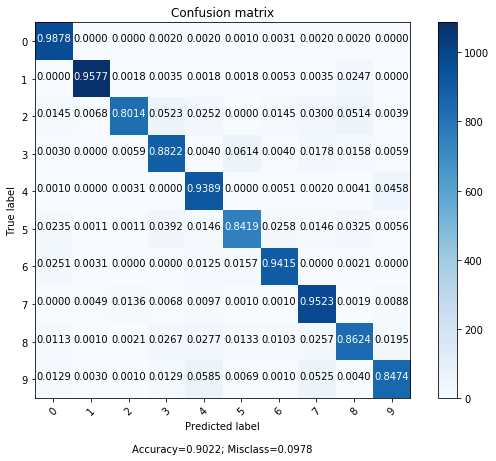

epoch 7 | iter 420 | Avg Loss: 105.21518 (±3.133) | Avg Cls Loss: 0.74846 (±0.257)
epoch 7 | iter 440 | Avg Loss: 104.98957 (±3.027) | Avg Cls Loss: 0.76127 (±0.141)
epoch 7 | iter 460 | Avg Loss: 104.68135 (±2.099) | Avg Cls Loss: 0.68891 (±0.192)
epoch 7 | iter 480 | Avg Loss: 106.20557 (±2.330) | Avg Cls Loss: 0.75601 (±0.207)
epoch 7 | iter 500 | Avg Loss: 105.89289 (±2.768) | Avg Cls Loss: 0.77805 (±0.269)
epoch 7 | iter 520 | Avg Loss: 104.96135 (±2.513) | Avg Cls Loss: 0.86754 (±0.305)
epoch 7 | iter 540 | Avg Loss: 105.20667 (±2.535) | Avg Cls Loss: 0.89554 (±0.304)
epoch 7 | iter 560 | Avg Loss: 105.51459 (±2.826) | Avg Cls Loss: 0.86688 (±0.280)
epoch 7 | iter 580 | Avg Loss: 105.41701 (±2.647) | Avg Cls Loss: 0.77843 (±0.294)
epoch 8 | iter 20 | Avg Loss: 105.08280 (±2.847) | Avg Cls Loss: 0.92559 (±0.316)
epoch 8 | iter 40 | Avg Loss: 105.35458 (±3.205) | Avg Cls Loss: 0.74845 (±0.285)
epoch 8 | iter 60 | Avg Loss: 104.32932 (±3.560) | Avg Cls Loss: 0.87634 (±0.304)
epoch 8

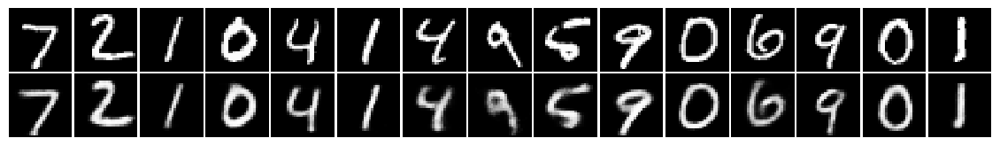

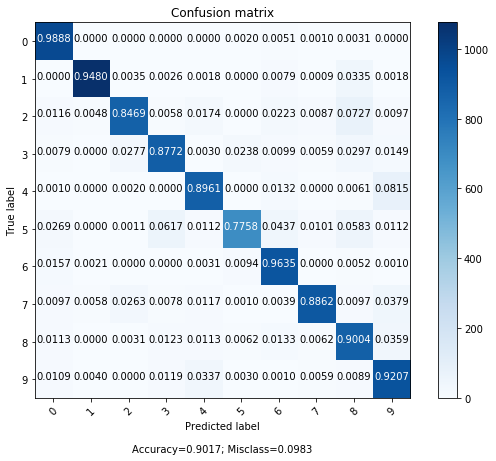

epoch 8 | iter 220 | Avg Loss: 105.15944 (±3.011) | Avg Cls Loss: 0.87404 (±0.337)
epoch 8 | iter 240 | Avg Loss: 105.68852 (±2.763) | Avg Cls Loss: 0.88509 (±0.328)
epoch 8 | iter 260 | Avg Loss: 104.96871 (±3.231) | Avg Cls Loss: 0.82620 (±0.342)
epoch 8 | iter 280 | Avg Loss: 104.77777 (±2.508) | Avg Cls Loss: 0.83672 (±0.433)
epoch 8 | iter 300 | Avg Loss: 105.12915 (±2.043) | Avg Cls Loss: 0.92289 (±0.282)
epoch 8 | iter 320 | Avg Loss: 104.41638 (±3.213) | Avg Cls Loss: 0.82206 (±0.308)
epoch 8 | iter 340 | Avg Loss: 106.02150 (±2.483) | Avg Cls Loss: 0.69609 (±0.309)
epoch 8 | iter 360 | Avg Loss: 104.72742 (±2.626) | Avg Cls Loss: 0.84308 (±0.281)
epoch 8 | iter 400 | Avg Loss: 104.97076 (±3.007) | Avg Cls Loss: 0.95904 (±0.355)


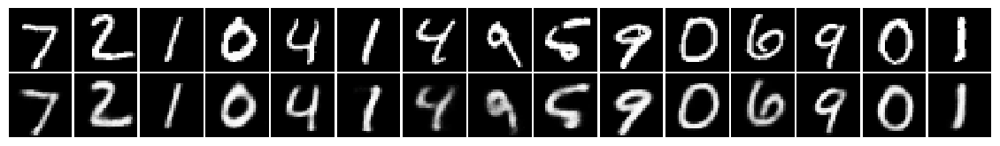

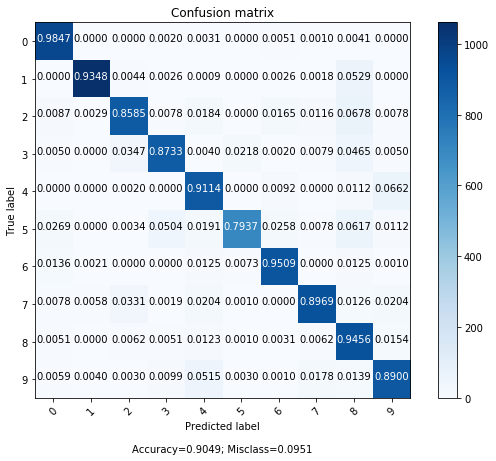

epoch 8 | iter 420 | Avg Loss: 103.28575 (±3.282) | Avg Cls Loss: 0.78161 (±0.366)
epoch 8 | iter 440 | Avg Loss: 105.12822 (±2.742) | Avg Cls Loss: 0.86655 (±0.255)
epoch 8 | iter 460 | Avg Loss: 104.36557 (±3.181) | Avg Cls Loss: 0.96954 (±0.251)
epoch 8 | iter 480 | Avg Loss: 104.18013 (±2.112) | Avg Cls Loss: 0.94430 (±0.312)
epoch 8 | iter 500 | Avg Loss: 104.79742 (±2.397) | Avg Cls Loss: 0.74932 (±0.284)
epoch 8 | iter 520 | Avg Loss: 104.63870 (±1.869) | Avg Cls Loss: 0.94033 (±0.362)
epoch 8 | iter 540 | Avg Loss: 104.17328 (±2.910) | Avg Cls Loss: 0.83386 (±0.249)
epoch 8 | iter 560 | Avg Loss: 104.46131 (±2.741) | Avg Cls Loss: 0.99099 (±0.289)
epoch 8 | iter 580 | Avg Loss: 104.71119 (±2.589) | Avg Cls Loss: 0.79878 (±0.328)
epoch 9 | iter 20 | Avg Loss: 103.67924 (±2.611) | Avg Cls Loss: 0.85756 (±0.349)
epoch 9 | iter 40 | Avg Loss: 103.56871 (±2.435) | Avg Cls Loss: 0.83412 (±0.265)
epoch 9 | iter 60 | Avg Loss: 103.43730 (±2.543) | Avg Cls Loss: 0.96479 (±0.287)
epoch 9

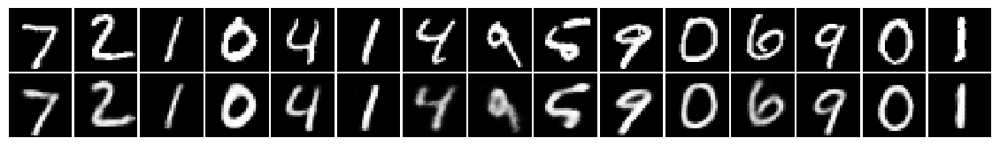

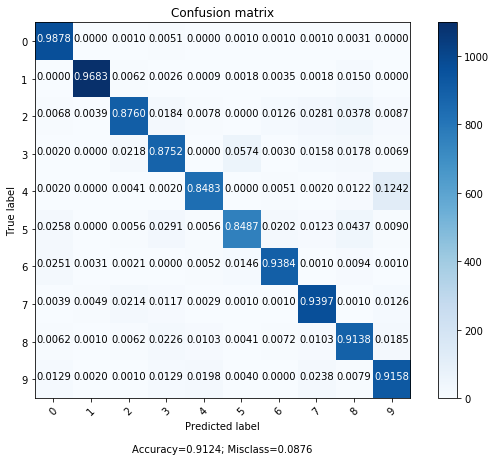

epoch 9 | iter 220 | Avg Loss: 104.44532 (±2.749) | Avg Cls Loss: 0.84647 (±0.368)
epoch 9 | iter 240 | Avg Loss: 104.13597 (±3.799) | Avg Cls Loss: 1.02114 (±0.438)
epoch 9 | iter 260 | Avg Loss: 104.57907 (±3.413) | Avg Cls Loss: 1.07318 (±0.404)
epoch 9 | iter 280 | Avg Loss: 103.43666 (±1.983) | Avg Cls Loss: 0.94748 (±0.452)
epoch 9 | iter 300 | Avg Loss: 104.60901 (±2.510) | Avg Cls Loss: 0.87728 (±0.368)
epoch 9 | iter 320 | Avg Loss: 103.96711 (±2.755) | Avg Cls Loss: 0.95411 (±0.310)
epoch 9 | iter 340 | Avg Loss: 104.35523 (±2.771) | Avg Cls Loss: 1.01521 (±0.300)
epoch 9 | iter 360 | Avg Loss: 104.36711 (±1.936) | Avg Cls Loss: 0.96139 (±0.368)
epoch 9 | iter 400 | Avg Loss: 105.14375 (±3.058) | Avg Cls Loss: 1.05656 (±0.430)


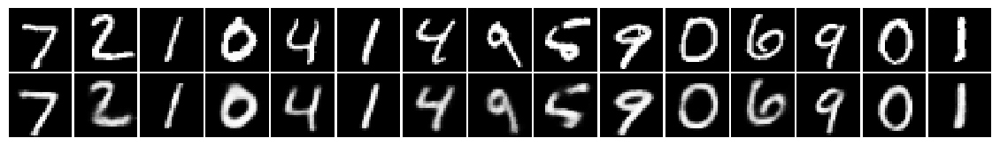

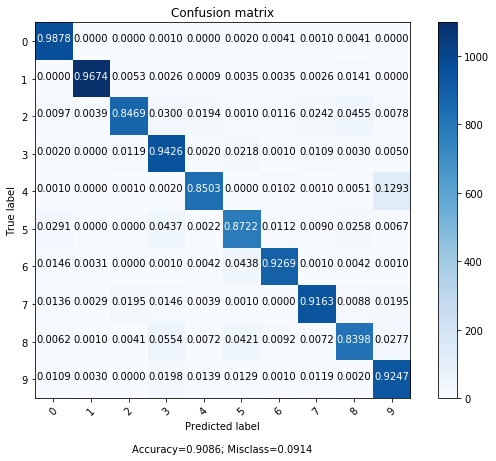

epoch 9 | iter 420 | Avg Loss: 104.03116 (±2.847) | Avg Cls Loss: 0.91519 (±0.302)
epoch 9 | iter 440 | Avg Loss: 103.52076 (±2.900) | Avg Cls Loss: 0.87856 (±0.432)
epoch 9 | iter 460 | Avg Loss: 104.14470 (±1.982) | Avg Cls Loss: 0.90495 (±0.267)
epoch 9 | iter 480 | Avg Loss: 102.94782 (±2.010) | Avg Cls Loss: 0.71109 (±0.346)
epoch 9 | iter 500 | Avg Loss: 105.35324 (±2.727) | Avg Cls Loss: 0.76424 (±0.253)
epoch 9 | iter 520 | Avg Loss: 103.55140 (±2.232) | Avg Cls Loss: 0.84391 (±0.315)
epoch 9 | iter 540 | Avg Loss: 104.54503 (±2.563) | Avg Cls Loss: 1.00948 (±0.356)
epoch 9 | iter 560 | Avg Loss: 103.88786 (±2.457) | Avg Cls Loss: 0.86953 (±0.365)
epoch 9 | iter 580 | Avg Loss: 103.03797 (±2.802) | Avg Cls Loss: 0.81924 (±0.354)
epoch 10 | iter 20 | Avg Loss: 103.34332 (±2.637) | Avg Cls Loss: 0.86105 (±0.400)
epoch 10 | iter 40 | Avg Loss: 104.59972 (±3.096) | Avg Cls Loss: 0.86279 (±0.436)
epoch 10 | iter 60 | Avg Loss: 103.59402 (±1.810) | Avg Cls Loss: 0.82936 (±0.367)
epoc

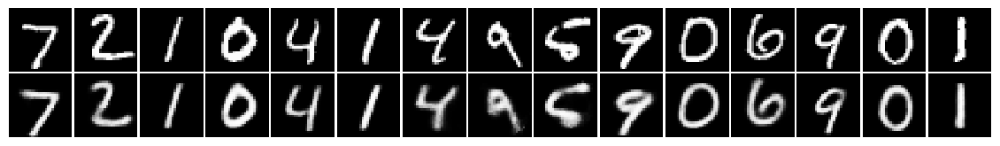

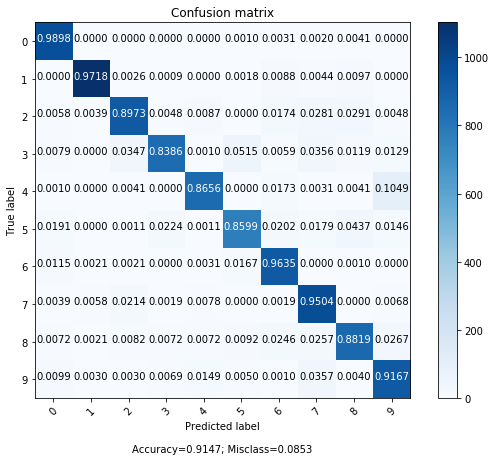

epoch 10 | iter 220 | Avg Loss: 103.46427 (±2.583) | Avg Cls Loss: 1.19790 (±0.335)
epoch 10 | iter 240 | Avg Loss: 103.33901 (±2.122) | Avg Cls Loss: 1.00715 (±0.336)
epoch 10 | iter 260 | Avg Loss: 104.19107 (±2.678) | Avg Cls Loss: 0.90504 (±0.362)
epoch 10 | iter 280 | Avg Loss: 102.92160 (±2.515) | Avg Cls Loss: 0.94674 (±0.421)
epoch 10 | iter 300 | Avg Loss: 103.84189 (±3.149) | Avg Cls Loss: 0.94323 (±0.385)
epoch 10 | iter 320 | Avg Loss: 102.40822 (±1.581) | Avg Cls Loss: 1.24131 (±0.411)
epoch 10 | iter 340 | Avg Loss: 103.62918 (±1.941) | Avg Cls Loss: 1.01608 (±0.513)
epoch 10 | iter 360 | Avg Loss: 103.55988 (±2.835) | Avg Cls Loss: 1.16543 (±0.315)
epoch 10 | iter 400 | Avg Loss: 103.04751 (±2.781) | Avg Cls Loss: 1.15207 (±0.514)


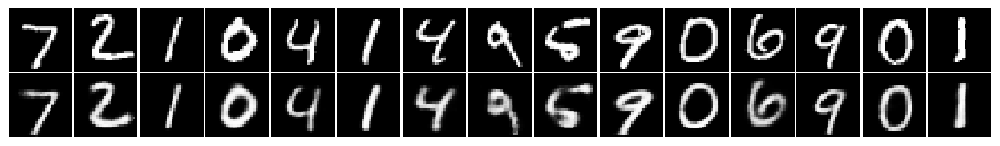

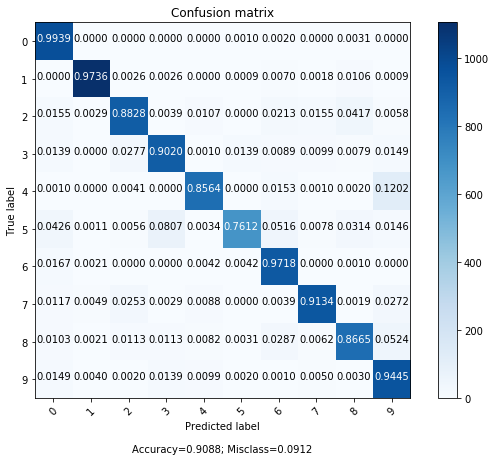

epoch 10 | iter 420 | Avg Loss: 104.73048 (±1.877) | Avg Cls Loss: 0.88287 (±0.296)
epoch 10 | iter 440 | Avg Loss: 102.71925 (±1.978) | Avg Cls Loss: 0.92917 (±0.409)
epoch 10 | iter 460 | Avg Loss: 103.19740 (±3.117) | Avg Cls Loss: 0.95932 (±0.449)
epoch 10 | iter 480 | Avg Loss: 103.44256 (±2.961) | Avg Cls Loss: 0.87059 (±0.450)
epoch 10 | iter 500 | Avg Loss: 103.74704 (±3.003) | Avg Cls Loss: 0.98500 (±0.486)
epoch 10 | iter 520 | Avg Loss: 103.58708 (±2.653) | Avg Cls Loss: 1.13800 (±0.392)
epoch 10 | iter 540 | Avg Loss: 104.01639 (±2.651) | Avg Cls Loss: 0.94768 (±0.428)
epoch 10 | iter 560 | Avg Loss: 103.83272 (±2.324) | Avg Cls Loss: 1.06562 (±0.425)
epoch 10 | iter 580 | Avg Loss: 103.15396 (±2.712) | Avg Cls Loss: 1.15447 (±0.459)


In [64]:
loss_logger = MetricLogger("Loss")
cls_loss_logger = MetricLogger("Cls Loss")
acc_logger = MetricLogger('Accuracy')

train_vae(train_dl, train_dl_u, valid_dl, vae, 10, loss_logger, cls_loss_logger, acc_logger, semi_sup_epochs=1)

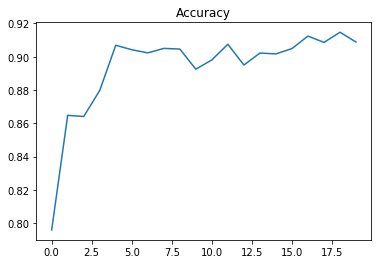

In [65]:
acc_logger.plot()

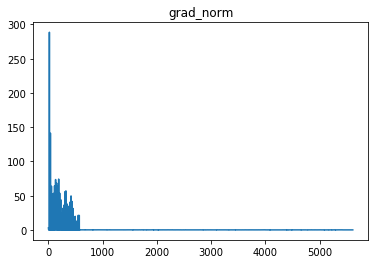

In [70]:
# we can see that classifier learns fast during semi-supervised setting (high gradient signal) and much slower afterrwards (signal is small, yet nonzero).

grad_norm.plot()